# Quantum Finance – Projeto Integrado em Inteligência Artificial e Machine Learning - 2025

**Integrantes**

* RM 357240 - Jose Carlos Basilio
* RM 358285 - Rafael Henrique Gallo
* RM 358024 - Lucas Nascimento dos Santos
* RM 358921 - Társis Fortes Tavares
* RM 358829 - Rodrigo Patricio Carvalho

# **Part 1 – Problema de Negócio**

### **Fonte dos Dados**
Dataset disponível no Kaggle:  
[https://www.kaggle.com/datasets/parisrohan/credit-score-classification](https://www.kaggle.com/datasets/parisrohan/credit-score-classification)

### **Contexto e Objetivo do Projeto**

Como parte da equipe de analistas da **Quantum Finance**, o desafio é explorar e aplicar técnicas de Inteligência Artificial e Machine Learning sobre uma base de dados utilizada para classificação de **score de crédito**. A proposta é transformar os dados em **insights práticos**, desenvolver modelos preditivos e propor soluções que agreguem valor ao processo de avaliação de risco de crédito.

O projeto envolve duas frentes principais:

### **Problema 1 – Modelo Supervisionado de Classificação**

O objetivo é **desenvolver um modelo de machine learning supervisionado** capaz de prever a **classificação de crédito** de indivíduos com base em suas características financeiras e comportamentais.

**Etapas esperadas:**

- Realizar uma **Análise Exploratória de Dados (EDA)** para compreender a estrutura dos dados e identificar padrões relevantes;
- Implementar diferentes modelos de classificação, como **Decision Tree, Random Forest, Logistic Regression**, entre outros;
- Avaliar os modelos utilizando métricas apropriadas: **acurácia, F1-score, matriz de confusão, etc.**;
- Apresentar os resultados obtidos e discutir como o modelo pode ser utilizado para **apoiar decisões financeiras e de concessão de crédito**.

### **Problema 2 – Modelo Não Supervisionado ou Sistema Especialista**

Como alternativa ou extensão, a proposta envolve a aplicação de técnicas de aprendizado **não supervisionado** ou a construção de um **sistema especialista** baseado em regras.

**Etapas esperadas:**

- Realizar uma EDA inicial para embasar a definição de estratégia;
- Escolher entre:
  - Aplicar algoritmos de **clusterização**, como **K-Means** ou **PCA**, para **agrupar clientes por similaridade**;
  - Ou desenvolver um **sistema especialista** que utilize **regras de negócio** para classificar os perfis de risco;

- Documentar o processo, destacando os **resultados obtidos**, os **desafios enfrentados** e a **viabilidade prática da abordagem adotada**.

### **Entrega Final**

- **Prazo de entrega:** 27/04/2025 (até as 23:59)
- Submeter um arquivo `.zip` contendo:
  - Códigos desenvolvidos
  - Relatórios
  - Documentação adicional relevante

###  **Recomendações**

- Dividam as tarefas entre os membros do grupo para otimizar o tempo e a profundidade da análise;
- Comecem por uma **EDA bem estruturada**;
- Para quem optar por modelagem supervisionada, é desejável testar **vários classificadores** e comparar os resultados;
- Foco em gerar **valor prático** com a solução proposta.

In [7]:
#Esta seção do código é dedicada à instalação de bibliotecas Python necessárias que não estão incluídas na distribuição padrão do Python.
#Essas bibliotecas são essenciais para o projeto e provavelmente serão usadas mais tarde no notebook para tarefas de aprendizado de máquina,
#como construção de modelos, avaliação e visualização de dados:

#lightgbm: Framework de gradient boosting para tarefas de aprendizado de máquina, como classificação, conhecido por sua velocidade e eficiência.
!pip install lightgbm

#catboost: Outra biblioteca de gradient boosting, eficaz para lidar com dados categóricos, com alta precisão e robustez.
!pip install catboost

#kneed: Utilizada para encontrar o "ponto de cotovelo" em uma curva, auxiliando na determinação do número ideal de clusters em algoritmos como o K-Means.
!pip install kneed

In [8]:
# Import of libraries
# Nesta seção, estamos importando as bibliotecas Python necessárias para o projeto.
# Bibliotecas são conjuntos de funções e ferramentas pré-escritas que facilitam a realização de tarefas específicas,
# como manipulação de dados, visualização e modelagem.

# Importando bibliotecas para manipulação de dados, visualização, expressões regulares,
# operações com strings e outras ferramentas úteis para análise de dados e machine learning.
# Também configuramos o estilo visual dos gráficos e ignoramos os avisos (warnings).

# Bibliotecas do sistema
import re
import string
import unicodedata
import itertools
from collections import Counter

# Bibliotecas para manipulação de dados
import pandas as pd
import numpy as np


# Bibliotecas para visualização de dados
import seaborn as sns
import matplotlib.pylab as pl
import matplotlib as m
import matplotlib as mpl
import matplotlib.pyplot as plt
#import plotly.express as px
from matplotlib import pyplot as plt

# Configurações para gráficos
sns.set_theme(style='whitegrid')
palette='viridis'

# Ignorando avisos
import warnings
warnings.filterwarnings("ignore")

# Versão do Python
from platform import python_version
print('Python version in this Jupyter Notebook:', python_version())

Python version in this Jupyter Notebook: 3.11.12


# Part 2 - Base dados

In [9]:
#Esta seção configura a exibição de dataframes do Pandas, garantindo que todas as colunas e seu conteúdo sejam mostrados sem cortes,
#e limitando a largura da exibição para melhor visualização.

pd.set_option('display.max_columns', None)
pd.set_option('display.width', 200)
pd.set_option('display.max_colwidth', None)

# base train. Carregamento dos arquivos com a base de treino.
data_train = pd.read_csv('/content/train.csv', delimiter = ',', decimal= '.')

# base test. Carregamento dos arquivos com a base de teste.
data_test = pd.read_csv('/content/test.csv', delimiter = ',', decimal= '.')

# Visualizando 5 primeiros dados
data_train.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",3,7,11.27,4.0,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",-1,NaN,11.27,4.0,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",3,7,_,4.0,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",5,4,6.27,4.0,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",6,NaN,11.27,4.0,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


In [10]:
# Visualizando 5 últimos dados
data_train.tail()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
99995,0x25fe9,CUS_0x942c,April,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,6,7,2,"Auto Loan, and Student Loan",23,7,11.5,3.0,_,502.38,34.663572,31 Years and 6 Months,No,35.104023,60.97133255718485,High_spent_Large_value_payments,479.866228,Poor
99996,0x25fea,CUS_0x942c,May,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,6,7,2,"Auto Loan, and Student Loan",18,7,11.5,3.0,_,502.38,40.565631,31 Years and 7 Months,No,35.104023,54.18595028760385,High_spent_Medium_value_payments,496.65161,Poor
99997,0x25feb,CUS_0x942c,June,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,6,5729,2,"Auto Loan, and Student Loan",27,6,11.5,3.0,Good,502.38,41.255522,31 Years and 8 Months,No,35.104023,24.02847744864441,High_spent_Large_value_payments,516.809083,Poor
99998,0x25fec,CUS_0x942c,July,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,6,7,2,"Auto Loan, and Student Loan",20,NaN,11.5,3.0,Good,502.38,33.638208,31 Years and 9 Months,No,35.104023,251.67258219721603,Low_spent_Large_value_payments,319.164979,Standard
99999,0x25fed,CUS_0x942c,August,Nicks,25,078-73-5990,Mechanic,39628.99_,3359.415833,4,6,7,2,"Auto Loan, and Student Loan",18,6,11.5,3.0,Good,502.38,34.192463,31 Years and 10 Months,No,35.104023,167.1638651610451,!@9#%8,393.673696,Poor


In [11]:
# Visualizando linhas e colunas
data_train.shape

(100000, 28)

In [12]:
# Info dados
#É possível observar que existem várias coluna com o tipo de objeto.
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  object 
 13  Type_of_Loan              88592 non-null   ob

# Part 3 - Limpeza de Dados

**Verificando dados nulos na base train.csv**

In [13]:
#Esse trecho de código tem como objetivo verificar e exibir a quantidade de valores faltantes (NaN) em cada coluna do DataFrame

print("Quantidade de dados nulos em cada coluna:")
data_train.isnull().sum()

Quantidade de dados nulos em cada coluna:


,0
ID,0
Customer_ID,0
Month,0
Name,9985
Age,0
SSN,0
Occupation,0
Annual_Income,0
Monthly_Inhand_Salary,15002
Num_Bank_Accounts,0


In [14]:
# Lista das colunas que devem ser consideradas para remoção de linhas com NaN
cols_to_check = ['Monthly_Balance',
                 'Amount_invested_monthly',
                 'Credit_History_Age',
                 'Num_Credit_Inquiries',
                 'Num_of_Delayed_Payment',
                 'Type_of_Loan',
                 'Monthly_Inhand_Salary',
                 'Name']

# Remover apenas as linhas que têm NaN nessas colunas
data_train = data_train.dropna(subset=cols_to_check)

print("Quantidade de dados nulos em cada coluna após remoção:")
data_train.isnull().sum()

Quantidade de dados nulos em cada coluna após remoção:


,0
ID,0
Customer_ID,0
Month,0
Name,0
Age,0
SSN,0
Occupation,0
Annual_Income,0
Monthly_Inhand_Salary,0
Num_Bank_Accounts,0


In [15]:
# 1. Remover colunas pouco úteis
data_train.drop(columns=['ID', 'Name', 'Customer_ID', 'Name', 'SSN', 'Month'], inplace=True)
data_train.head(n=10)

,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,23,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",3,7,11.27,4.0,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
6,23,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",3,8_,11.27,4.0,Good,809.98,22.537593,22 Years and 7 Months,No,49.574949,178.3440674122349,Low_spent_Small_value_payments,244.5653167062043,Good
8,28_,_______,34847.84,3037.986667,2,4,6,1,Credit-Builder Loan,3,4,5.42,2.0,Good,605.03,24.464031,26 Years and 7 Months,No,18.816215,104.291825168246,Low_spent_Small_value_payments,470.69062692529184,Standard
9,28,Teacher,34847.84,3037.986667,2,4,6,1,Credit-Builder Loan,7,1,7.42,2.0,Good,605.03,38.550848,26 Years and 8 Months,No,18.816215,40.39123782853101,High_spent_Large_value_payments,484.5912142650067,Good
10,28,Teacher,34847.84_,3037.986667,2,1385,6,1,Credit-Builder Loan,3,-1,5.42,2.0,_,605.03,33.224951,26 Years and 9 Months,No,18.816215,58.51597569589465,High_spent_Large_value_payments,466.46647639764313,Standard
12,28,Teacher,34847.84,3037.986667,2,4,6,1,Credit-Builder Loan,3,1,6.42,2.0,Good,605.03,34.977895,26 Years and 11 Months,No,18.816215,130.11542024292334,Low_spent_Small_value_payments,444.8670318506144,Good
13,28,Teacher,34847.84,3037.986667,2,4,6,1,Credit-Builder Loan,3,0,5.42,2.0,Good,605.03,33.381010,27 Years and 0 Months,No,18.816215,43.477190144355745,High_spent_Large_value_payments,481.505261949182,Good
15,28,Teacher,34847.84,3037.986667,2,4,6,1,Credit-Builder Loan,3,4,5.42,2.0,Good,605.03,32.933856,27 Years and 2 Months,No,18.816215,218.90434353388733,Low_spent_Small_value_payments,356.07810855965045,Good
16,34,_______,143162.64,12187.220000,1,5,8,3,"Auto Loan, Auto Loan, and Not Specified",5,8,7.1,3.0,Good,1303.01,28.616735,17 Years and 9 Months,No,246.992319,168.413702679309,!@9#%8,1043.3159778669492,Good
20,34,_______,143162.64,12187.220000,1,5,8,3,"Auto Loan, Auto Loan, and Not Specified",10,5,7.1,3.0,Good,1303.01,31.376150,18 Years and 1 Months,No,246.992319,430.9475278803298,Low_spent_Large_value_payments,810.7821526659284,Good


**Verificando dados nulos na base test.csv**

In [16]:
# Remover colunas pouco úteis na base de teste
data_test.drop(columns=['ID', 'Name', 'Customer_ID', 'Name', 'SSN', 'Month'], inplace=True)
data_test.head(n=10)

,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance
0,23,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",3,7,11.27,2022.0,Good,809.98,35.030402,22 Years and 9 Months,No,49.574949,236.64268203272135,Low_spent_Small_value_payments,186.26670208571772
1,24,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",3,9,13.27,4.0,Good,809.98,33.053114,22 Years and 10 Months,No,49.574949,21.465380264657146,High_spent_Medium_value_payments,361.44400385378196
2,24,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",-1,4,12.27,4.0,Good,809.98,33.811894,NaN,No,49.574949,148.23393788500925,Low_spent_Medium_value_payments,264.67544623342997
3,24_,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",4,5,11.27,4.0,Good,809.98,32.430559,23 Years and 0 Months,No,49.574949,39.08251089460281,High_spent_Medium_value_payments,343.82687322383634
4,28,_______,34847.84,3037.986667,2,4,6,1,Credit-Builder Loan,3,1,5.42,5.0,Good,605.03,25.926822,27 Years and 3 Months,No,18.816215,39.684018417945296,High_spent_Large_value_payments,485.2984336755923
5,28,Teacher,34847.84,3037.986667,2,4,6,1,Credit-Builder Loan,3,3,5.42,5.0,Good,605.03,30.116600,27 Years and 4 Months,No,18.816215,251.62736875017606,Low_spent_Large_value_payments,303.3550833433617
6,28,Teacher,34847.84,3037.986667,2,4,6,1,Credit-Builder Loan,3,NaN,5.42,5.0,_,605.03,30.996424,27 Years and 5 Months,No,18.816215,72.68014533363515,High_spent_Large_value_payments,452.30230675990265
7,28,Teacher,34847.84,3037.986667,2,4,6,1,Credit-Builder Loan,3,2_,7.42,5.0,_,605.03,33.875167,27 Years and 6 Months,No,18.816215,153.53448761392985,!@9#%8,421.44796447960783
8,35,Engineer,143162.64,NaN,1,5,8,3,"Auto Loan, Auto Loan, and Not Specified",8,1942,7.1,3.0,Good,1303.01,35.229707,18 Years and 5 Months,No,246.992319,397.50365354404653,Low_spent_Medium_value_payments,854.2260270022115
9,35,Engineer,143162.64,12187.220000,1,5,8,3,"Auto Loan, Auto Loan, and Not Specified",6,3,2.1,3.0,Good,1303.01,35.685836,18 Years and 6 Months,No,246.992319,453.6151305781054,Low_spent_Large_value_payments,788.1145499681528


In [17]:
# Remover todas as linhas com pelo menos um valor nulo
test_df_clean = data_test.dropna()

print("Após remoção de nulos:", data_test.shape)

Após remoção de nulos: (50000, 22)


# Part 4 - Pré-processamento

**Aplicando pré-processamento na base train.csv()**

In [18]:
# Conversões de tipo com erros tratados
# Lista de colunas numéricas que podem conter valores como vírgulas ou underscores que atrapalham a conversão
cols_to_numeric = ['Annual_Income', 'Num_of_Delayed_Payment',
                   'Changed_Credit_Limit', 'Outstanding_Debt',
                   'Amount_invested_monthly', 'Monthly_Balance']

# Loop para limpar e converter os valores dessas colunas para tipo numérico (float64)
# Remove vírgulas e underscores, e converte os valores para números com tratamento de erro
for col in cols_to_numeric:
    data_train[col] = pd.to_numeric(data_train[col].astype(str).str.replace(',', '').str.replace('_', ''), errors='coerce')

# Exibe o DataFrame resultante após as conversões
data_train

,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,23,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",3,7,11.27,4.0,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.415295,High_spent_Small_value_payments,312.494089,Good
6,23,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",3,8,11.27,4.0,Good,809.98,22.537593,22 Years and 7 Months,No,49.574949,178.344067,Low_spent_Small_value_payments,244.565317,Good
8,28_,_______,34847.84,3037.986667,2,4,6,1,Credit-Builder Loan,3,4,5.42,2.0,Good,605.03,24.464031,26 Years and 7 Months,No,18.816215,104.291825,Low_spent_Small_value_payments,470.690627,Standard
9,28,Teacher,34847.84,3037.986667,2,4,6,1,Credit-Builder Loan,7,1,7.42,2.0,Good,605.03,38.550848,26 Years and 8 Months,No,18.816215,40.391238,High_spent_Large_value_payments,484.591214,Good
10,28,Teacher,34847.84,3037.986667,2,1385,6,1,Credit-Builder Loan,3,-1,5.42,2.0,_,605.03,33.224951,26 Years and 9 Months,No,18.816215,58.515976,High_spent_Large_value_payments,466.466476,Standard
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99994,25,Mechanic,39628.99,3359.415833,4,6,7,2,"Auto Loan, and Student Loan",20,6,9.50,3.0,_,502.38,39.323569,31 Years and 5 Months,No,35.104023,140.581403,High_spent_Medium_value_payments,410.256158,Poor
99995,25,Mechanic,39628.99,3359.415833,4,6,7,2,"Auto Loan, and Student Loan",23,7,11.50,3.0,_,502.38,34.663572,31 Years and 6 Months,No,35.104023,60.971333,High_spent_Large_value_payments,479.866228,Poor
99996,25,Mechanic,39628.99,3359.415833,4,6,7,2,"Auto Loan, and Student Loan",18,7,11.50,3.0,_,502.38,40.565631,31 Years and 7 Months,No,35.104023,54.185950,High_spent_Medium_value_payments,496.651610,Poor
99997,25,Mechanic,39628.99,3359.415833,4,6,5729,2,"Auto Loan, and Student Loan",27,6,11.50,3.0,Good,502.38,41.255522,31 Years and 8 Months,No,35.104023,24.028477,High_spent_Large_value_payments,516.809083,Poor


No código é limpar e converter corretamente os dados numéricos que, por algum motivo, estão armazenados como texto (strings), e que podem conter caracteres que impedem a conversão direta, como vírgulas e underscores (_). Primeiro, é criada uma lista chamada cols_to_numeric contendo os nomes das colunas que precisam passar por esse tratamento. Essas colunas representam variáveis numéricas no contexto do projeto, como renda anual, dívida pendente, número de pagamentos atrasados, entre outras.

Em seguida, é utilizado um for para percorrer cada uma dessas colunas. Para cada coluna, o código faz o seguinte:

1) Converte todos os valores para strings, caso ainda não estejam nesse formato.

2) Remove caracteres indesejados, como vírgulas (,) e underscores (_), que atrapalham a conversão.

3) Converte os valores para formato numérico (float), utilizando pd.to_numeric(). O parâmetro errors='coerce' garante que, caso algum valor ainda não possa ser convertido, ele será transformado em NaN (valor ausente), evitando que o processo quebre.

Ao final do processo, as colunas especificadas estarão prontas para análises e modelagem, contendo apenas valores numéricos válidos.

In [19]:
# Preenchimento de nulos
data_train['Monthly_Inhand_Salary'].fillna(data_train['Monthly_Inhand_Salary'].median(), inplace=True)
data_train['Num_of_Delayed_Payment'].fillna(data_train['Num_of_Delayed_Payment'].median(), inplace=True)
data_train['Num_Credit_Inquiries'].fillna(data_train['Num_Credit_Inquiries'].median(), inplace=True)
data_train['Amount_invested_monthly'].fillna(data_train['Amount_invested_monthly'].median(), inplace=True)
data_train['Monthly_Balance'].fillna(data_train['Monthly_Balance'].median(), inplace=True)

# Categorias
data_train['Type_of_Loan'].fillna('Unknown', inplace=True)

# Remover linhas com '_______' em Occupation
data_train = data_train[data_train['Occupation'] != '_______']

# Remover linhas com '_' em Credit_Mix
data_train = data_train[data_train['Credit_Mix'] != '_']

# Visualizando dataset
data_train.head()

,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
6,23,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",3,8,11.27,4.0,Good,809.98,22.537593,22 Years and 7 Months,No,49.574949,178.344067,Low_spent_Small_value_payments,244.565317,Good
9,28,Teacher,34847.84,3037.986667,2,4,6,1,Credit-Builder Loan,7,1,7.42,2.0,Good,605.03,38.550848,26 Years and 8 Months,No,18.816215,40.391238,High_spent_Large_value_payments,484.591214,Good
12,28,Teacher,34847.84,3037.986667,2,4,6,1,Credit-Builder Loan,3,1,6.42,2.0,Good,605.03,34.977895,26 Years and 11 Months,No,18.816215,130.115420,Low_spent_Small_value_payments,444.867032,Good
13,28,Teacher,34847.84,3037.986667,2,4,6,1,Credit-Builder Loan,3,0,5.42,2.0,Good,605.03,33.381010,27 Years and 0 Months,No,18.816215,43.477190,High_spent_Large_value_payments,481.505262,Good
15,28,Teacher,34847.84,3037.986667,2,4,6,1,Credit-Builder Loan,3,4,5.42,2.0,Good,605.03,32.933856,27 Years and 2 Months,No,18.816215,218.904344,Low_spent_Small_value_payments,356.078109,Good


No código realiza uma limpeza de dados na base data_train, removendo registros que contêm valores inválidos ou placeholders nas colunas Occupation e Credit_Mix. A primeira linha remove todas as linhas da base em que o valor da coluna Occupation seja igual a **'_______'**, o que indica um valor ausente, não informado ou inválido. Manter esse tipo de valor poderia distorcer a análise e prejudicar a performance do modelo de machine learning.

A segunda linha realiza a mesma operação na coluna Credit_Mix, eliminando as linhas que contenham o valor **'_'**, que também representa um dado ausente ou mal preenchido essas etapas são fundamentais para garantir que o conjunto de dados esteja limpo e consistente, evitando que entradas incompletas prejudiquem a análise e o desempenho dos modelos preditivos.

In [20]:
# Importando a biblioteca de expressões regulares
import re

# Função para converter o histórico de crédito de "X Years and Y Months" para meses totais
def convert_credit_age_to_months(x):
    try:
        # Utiliza regex para capturar os números de anos e meses
        match = re.search(r"(\d+)\s+Years\s+and\s+(\d+)\s+Months", x)
        if match:
            years = int(match.group(1))   # Extrai a quantidade de anos
            months = int(match.group(2))  # Extrai a quantidade de meses
            return years * 12 + months    # Retorna o total em meses
        else:
            return None  # Retorna None se o padrão não for encontrado
    except:
        return None  # Retorna None em caso de erro na conversão

# Converte a coluna 'Credit_History_Age' para string, caso não esteja
data_train['Credit_History_Age'] = data_train['Credit_History_Age'].astype(str)

# Aplica a função de conversão para toda a coluna
data_train['Credit_History_Age'] = data_train['Credit_History_Age'].apply(convert_credit_age_to_months)

# Exibe os valores únicos e suas contagens após a conversão
data_train.Credit_History_Age.value_counts()

,count
Credit_History_Age,
220,206
233,203
227,196
191,195
218,194
...,...
3,8
403,8
2,8


A função **convert_credit_age_to_months** tem como objetivo converter valores de tempo de histórico de crédito, originalmente no formato textual "X Years and Y Months", para um valor numérico representando o total de meses. Para isso, a função utiliza expressões regulares (regex) para identificar automaticamente os números de anos e meses presentes na string. Uma vez identificados, os anos são convertidos em meses (multiplicando por 12), e então somados aos meses encontrados, retornando assim o total. Caso o valor informado esteja fora do padrão esperado, incompleto ou nulo, a função retorna None, garantindo robustez contra erros e inconsistências nos dados. Esse tipo de transformação é extremamente útil em modelos de machine learning, pois transforma uma variável de texto em uma variável numérica contínua, que pode ser interpretada corretamente pelos algoritmos.

In [21]:
# Remove todas as linhas que contêm ao menos um valor nulo
data_train = data_train.dropna()

data_train.isnull().sum()

,0
Age,0
Occupation,0
Annual_Income,0
Monthly_Inhand_Salary,0
Num_Bank_Accounts,0
Num_Credit_Card,0
Interest_Rate,0
Num_of_Loan,0
Type_of_Loan,0
Delay_from_due_date,0


In [22]:
# Remover underscores e converter para numérico
data_train['Age'] = data_train['Age'].astype(str).str.replace('_', '', regex=False)
data_train['Age'] = pd.to_numeric(data_train['Age'], errors='coerce')

print(data_train['Age'].dtype)
print(data_train['Age'].isnull().sum())

data_train.head(n=10)

int64
0


,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
6,23,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",3,8,11.27,4.0,Good,809.98,22.537593,271,No,49.574949,178.344067,Low_spent_Small_value_payments,244.565317,Good
9,28,Teacher,34847.84,3037.986667,2,4,6,1,Credit-Builder Loan,7,1,7.42,2.0,Good,605.03,38.550848,320,No,18.816215,40.391238,High_spent_Large_value_payments,484.591214,Good
12,28,Teacher,34847.84,3037.986667,2,4,6,1,Credit-Builder Loan,3,1,6.42,2.0,Good,605.03,34.977895,323,No,18.816215,130.115420,Low_spent_Small_value_payments,444.867032,Good
13,28,Teacher,34847.84,3037.986667,2,4,6,1,Credit-Builder Loan,3,0,5.42,2.0,Good,605.03,33.381010,324,No,18.816215,43.477190,High_spent_Large_value_payments,481.505262,Good
15,28,Teacher,34847.84,3037.986667,2,4,6,1,Credit-Builder Loan,3,4,5.42,2.0,Good,605.03,32.933856,326,No,18.816215,218.904344,Low_spent_Small_value_payments,356.078109,Good
21,34,Engineer,143162.64,12187.220000,1,5,8,967,"Auto Loan, Auto Loan, and Not Specified",8,6,7.10,3.0,Good,1303.01,39.783993,218,No,246.992319,257.808099,High_spent_Medium_value_payments,963.921581,Good
23,34,Engineer,143162.64,12187.220000,1,5,8,3,"Auto Loan, Auto Loan, and Not Specified",8,6,7.10,3.0,Good,1303.01,38.374753,220,No,246.992319,10000.000000,High_spent_Small_value_payments,895.494583,Standard
24,54,Entrepreneur,30689.89,2612.490833,2,5,4,1,Not Specified,0,6,1.99,4.0,Good,632.46,26.544229,207,No,16.415452,81.228859,Low_spent_Large_value_payments,433.604773,Standard
25,54,Entrepreneur,30689.89,2612.490833,2,5,4,1,Not Specified,5,3,1.99,4.0,Good,632.46,35.279982,208,No,16.415452,124.881820,Low_spent_Small_value_payments,409.951812,Standard
26,55,Entrepreneur,30689.89,2612.490833,2,5,4,1,Not Specified,3,9,1.99,4.0,Good,632.46,32.301163,209,NM,16.415452,83.406509,High_spent_Medium_value_payments,411.427123,Standard


O objetivo limpar e converter a coluna Age, que originalmente possui valores numéricos armazenados como texto, mas com possíveis caracteres indesejados, como underscores ( _ ), que atrapalham a conversão para número. A primeira linha transforma todos os valores da coluna em strings e remove os underscores que possam estar presentes. Isso garante que valores como "50_" sejam convertidos corretamente para "50".

Em seguida, a segunda linha converte os valores para formato numérico (int ou float) usando pd.to_numeric(). Caso algum valor ainda esteja mal formatado ou não possa ser convertido, ele será transformado em NaN (valor nulo) graças ao parâmetro errors='coerce'. Esse tipo de tratamento é essencial para garantir que a variável Age esteja pronta para ser usada em análises estatísticas e modelos de machine learning, que exigem dados numéricos e limpos.

**Aplicando pré-processamento na base test.csv()**

In [23]:
# Lista das colunas numéricas com formatação incorreta
cols_to_numeric = ['Annual_Income', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
                   'Outstanding_Debt', 'Amount_invested_monthly', 'Monthly_Balance']

# Corrigir vírgulas/underscores e converter para float
for col in cols_to_numeric:
    data_test[col] = pd.to_numeric(data_test[col].astype(str).str.replace(',', '').str.replace('_', ''), errors='coerce')

# Preencher valores nulos nas colunas numéricas
data_test['Monthly_Inhand_Salary'].fillna(data_test['Monthly_Inhand_Salary'].median(), inplace=True)
data_test['Num_of_Delayed_Payment'].fillna(data_test['Num_of_Delayed_Payment'].median(), inplace=True)
data_test['Num_Credit_Inquiries'].fillna(data_test['Num_Credit_Inquiries'].median(), inplace=True)
data_test['Amount_invested_monthly'].fillna(data_test['Amount_invested_monthly'].median(), inplace=True)
data_test['Monthly_Balance'].fillna(data_test['Monthly_Balance'].median(), inplace=True)

# Preencher Type_of_Loan faltante
data_test['Type_of_Loan'].fillna('Unknown', inplace=True)

# Limpar valores inválidos em Occupation e Credit_Mix
data_test = data_test[data_test['Occupation'] != '_______']
data_test = data_test[data_test['Credit_Mix'] != '_']

Esse trecho de código tem por objetivo deixar as colunas numéricas e categóricas do seu conjunto de teste limpas e prontas para o modelo, sem caracteres indesejados ou valores faltantes. Primeiro, ele lista todas as colunas que deveriam ser números mas podem vir com vírgulas de milhar ou underline (“_”) e, para cada uma delas, transforma o conteúdo em texto, remove esses caracteres e tenta converter em `float`; caso não consiga, o valor vira `NaN`.

Em seguida, as colunas numéricas que ainda tiverem `NaN` são preenchidas com a mediana da própria coluna, garantindo que não haja lacunas. Para a variável categórica `Type_of_Loan`, qualquer valor nulo passa a ser a string `"Unknown"`. Por fim, o código filtra o DataFrame para descartar linhas onde `Occupation` seja exatamente `"_______"` ou `Credit_Mix` seja apenas `"_"`, pois esses são placeholders inválidos que não agregam informação. Com isso, você termina com um `data_test` coerente e livre de formatações ou entradas incorretas, pronto para alimentar o seu modelo.

In [24]:
# Converter Credit_History_Age para meses
def convert_credit_age_to_months(x):
    try:
        match = re.search(r"(\d+)\s+Years\s+and\s+(\d+)\s+Months", x)
        if match:
            years = int(match.group(1))
            months = int(match.group(2))
            return years * 12 + months
        else:
            return None
    except:
        return None

# Aplicando dataset
data_test['Credit_History_Age'] = data_test['Credit_History_Age'].astype(str)
data_test['Credit_History_Age'] = data_test['Credit_History_Age'].apply(convert_credit_age_to_months)

# Corrigir coluna Age
data_test['Age'] = data_test['Age'].astype(str).str.replace('_', '', regex=False)
data_test['Age'] = pd.to_numeric(data_test['Age'], errors='coerce')
data_test['Age'] = data_test['Age'].fillna(data_test['Age'].median())

1. **Conversão da “idade de crédito” em meses**  
   A função `convert_credit_age_to_months` recebe uma string no formato “N Years and M Months” (por exemplo, “2 Years and 8 Months”), aplica uma expressão regular para extrair os dois números (anos e meses) e calcula o total em meses (anos×12 + meses). Se a string não seguir esse padrão ou ocorrer qualquer erro, a função retorna `None` (tratado como valor ausente). Ao aplicar essa função a toda a coluna `Credit_History_Age`, você transforma frases em um valor numérico inteiro, como 32, ou marca como faltante as entradas que não puderam ser convertidas.

2. **Limpeza e padronização da coluna `Age`**  
   Alguns valores de idade podem vir com caracteres extras (por exemplo, “24_”). Primeiro, o código força tudo a string e remove eventuais underscores, garantindo que o texto fique apenas com dígitos. Em seguida, `pd.to_numeric(..., errors='coerce')` tenta converter cada string em número; entradas inválidas viram `NaN`. Por fim, qualquer `NaN` resultante é substituído pela mediana dos valores válidos da coluna, de forma que não haja valores faltantes na hora de fazer as previsões.  

Em conjunto, essas etapas asseguram que tanto o histórico de crédito quanto a idade dos clientes estejam no formato numérico correto, sem strings ou símbolos indesejados, o que evita erros de conversão e garante dados limpos para o modelo.

In [25]:
# Remover quaisquer linhas restantes com NaN
data_test = data_test.dropna()

In [26]:
# Verificação final
print("Nulos restantes:", data_test.isnull().sum().sum())  # Deve retornar 0

Nulos restantes: 0


In [27]:
# Visualizando dataset
data_test.head(n=5)

,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance
0,23,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",3,7.0,11.27,2022.0,Good,809.98,35.030402,273.0,No,49.574949,236.642682,Low_spent_Small_value_payments,186.266702
1,24,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",3,9.0,13.27,4.0,Good,809.98,33.053114,274.0,No,49.574949,21.465380,High_spent_Medium_value_payments,361.444004
3,24,Scientist,19114.12,3086.305000,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",4,5.0,11.27,4.0,Good,809.98,32.430559,276.0,No,49.574949,39.082511,High_spent_Medium_value_payments,343.826873
5,28,Teacher,34847.84,3037.986667,2,4,6,1,Credit-Builder Loan,3,3.0,5.42,5.0,Good,605.03,30.116600,328.0,No,18.816215,251.627369,Low_spent_Large_value_payments,303.355083
8,35,Engineer,143162.64,3086.305000,1,5,8,3,"Auto Loan, Auto Loan, and Not Specified",8,1942.0,7.10,3.0,Good,1303.01,35.229707,221.0,No,246.992319,397.503654,Low_spent_Medium_value_payments,854.226027


# Part 5 - Análise exploratória de dados

In [28]:
data_train.describe()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
count,38541.000000,3.854100e+04,38541.000000,38541.000000,38541.000000,38541.000000,38541.000000,38541.000000,38541.000000,38541.000000,38541.000000,38541.000000,38541.000000,38541.000000,38541.000000,3.854100e+04
mean,113.968371,1.774417e+05,4037.239427,17.033263,22.500739,76.829921,22.002854,31.801432,10.773944,26.958875,1507.503917,32.211651,213.549778,1419.674245,630.170323,-3.459519e+22
std,709.000036,1.446528e+06,3102.266535,117.981584,127.760380,480.909466,15.224412,228.463065,6.931756,186.408399,1191.986131,5.056382,99.864117,8301.203539,2055.774132,3.395708e+24
min,-500.000000,7.005930e+03,303.645417,-1.000000,0.000000,1.000000,-5.000000,-3.000000,-6.480000,0.000000,0.230000,20.881250,1.000000,4.462837,0.000000,-3.333333e+26
25%,24.000000,1.887352e+04,1579.338333,4.000000,4.000000,8.000000,10.000000,9.000000,5.610000,3.000000,599.540000,28.049044,135.000000,41.244418,71.736160,2.644512e+02
50%,33.000000,3.619652e+04,2998.561667,6.000000,6.000000,15.000000,19.000000,14.000000,9.710000,6.000000,1238.200000,32.239632,212.000000,78.748619,130.300394,3.254196e+02
75%,42.000000,7.016018e+04,5758.606667,8.000000,7.000000,22.000000,29.000000,19.000000,15.520000,9.000000,2133.240000,36.402006,292.000000,169.770374,251.798982,4.454818e+02
max,8697.000000,2.419806e+07,15204.633333,1798.000000,1499.000000,5797.000000,67.000000,4397.000000,36.290000,2594.000000,4998.070000,49.564519,404.000000,82331.000000,10000.000000,1.552946e+03


## 5.1 - Análise Univariada:


In [29]:
numerical_cols = data_train.select_dtypes(include=np.number).columns.tolist()
categorical_cols = data_train.select_dtypes(include=['object', 'category']).columns.tolist()

print(f"\nColunas Numéricas em data_train: {numerical_cols}")
print(f"Colunas Categóricas em data_train: {categorical_cols}")


Colunas Numéricas em data_train: ['Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate', 'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit', 'Num_Credit_Inquiries', 'Outstanding_Debt', 'Credit_Utilization_Ratio', 'Credit_History_Age', 'Total_EMI_per_month', 'Amount_invested_monthly', 'Monthly_Balance']
Colunas Categóricas em data_train: ['Occupation', 'Num_of_Loan', 'Type_of_Loan', 'Credit_Mix', 'Payment_of_Min_Amount', 'Payment_Behaviour', 'Credit_Score']


### Análise de Variáveis Numéricas


Analisando a coluna: 'Age'

Medidas Estatísticas:
count    38541.000000
mean       113.968371
std        709.000036
min       -500.000000
25%         24.000000
50%         33.000000
75%         42.000000
max       8697.000000
Name: Age, dtype: float64
Amplitude (Max - Min): 9197.00


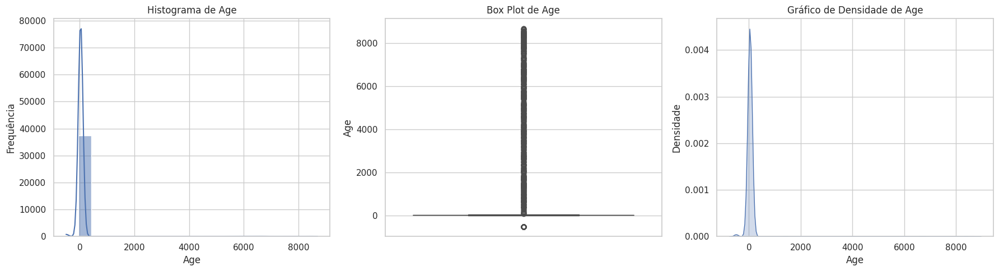


Analisando a coluna: 'Annual_Income'

Medidas Estatísticas:
count    3.854100e+04
mean     1.774417e+05
std      1.446528e+06
min      7.005930e+03
25%      1.887352e+04
50%      3.619652e+04
75%      7.016018e+04
max      2.419806e+07
Name: Annual_Income, dtype: float64
Amplitude (Max - Min): 24191056.07


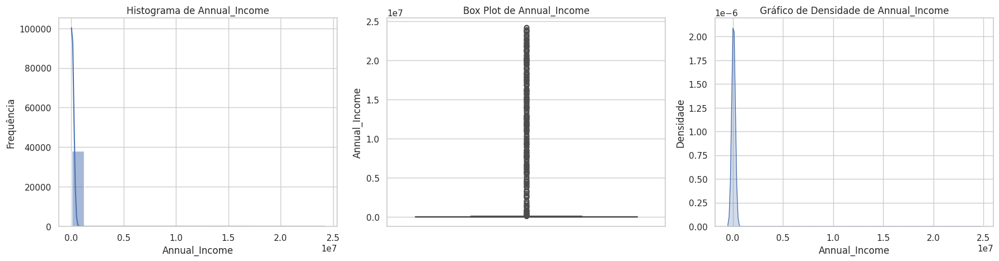


Analisando a coluna: 'Monthly_Inhand_Salary'

Medidas Estatísticas:
count    38541.000000
mean      4037.239427
std       3102.266535
min        303.645417
25%       1579.338333
50%       2998.561667
75%       5758.606667
max      15204.633333
Name: Monthly_Inhand_Salary, dtype: float64
Amplitude (Max - Min): 14900.99


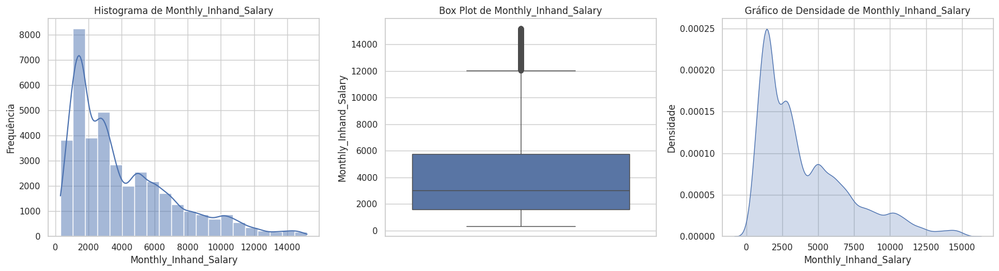


Analisando a coluna: 'Num_Bank_Accounts'

Medidas Estatísticas:
count    38541.000000
mean        17.033263
std        117.981584
min         -1.000000
25%          4.000000
50%          6.000000
75%          8.000000
max       1798.000000
Name: Num_Bank_Accounts, dtype: float64
Amplitude (Max - Min): 1799.00


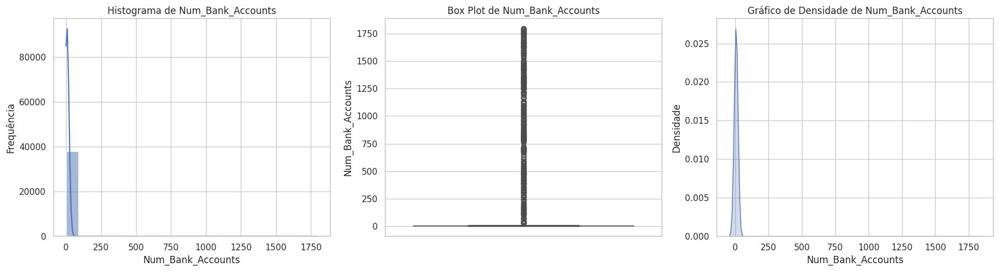


Analisando a coluna: 'Num_Credit_Card'

Medidas Estatísticas:
count    38541.000000
mean        22.500739
std        127.760380
min          0.000000
25%          4.000000
50%          6.000000
75%          7.000000
max       1499.000000
Name: Num_Credit_Card, dtype: float64
Amplitude (Max - Min): 1499.00


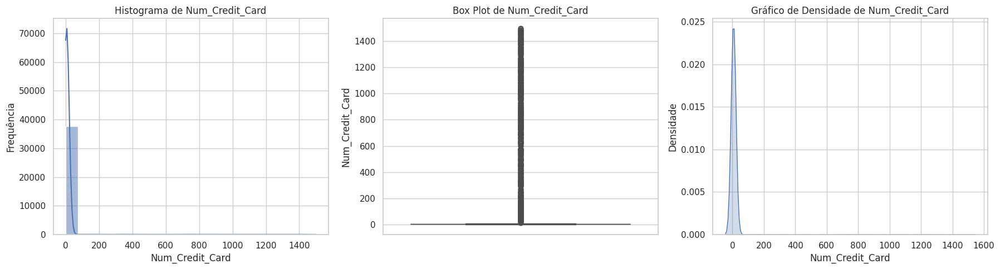


Analisando a coluna: 'Interest_Rate'

Medidas Estatísticas:
count    38541.000000
mean        76.829921
std        480.909466
min          1.000000
25%          8.000000
50%         15.000000
75%         22.000000
max       5797.000000
Name: Interest_Rate, dtype: float64
Amplitude (Max - Min): 5796.00


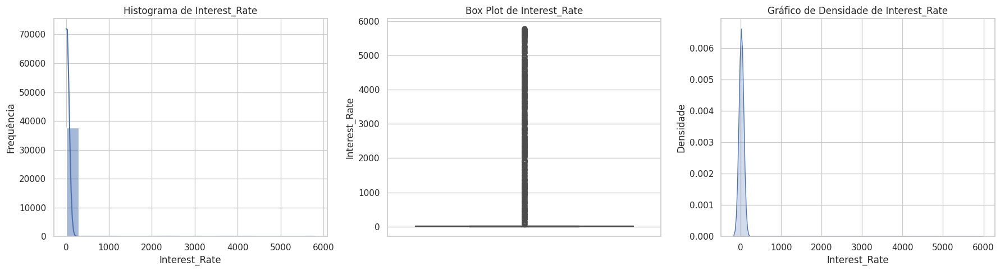


Analisando a coluna: 'Delay_from_due_date'

Medidas Estatísticas:
count    38541.000000
mean        22.002854
std         15.224412
min         -5.000000
25%         10.000000
50%         19.000000
75%         29.000000
max         67.000000
Name: Delay_from_due_date, dtype: float64
Amplitude (Max - Min): 72.00


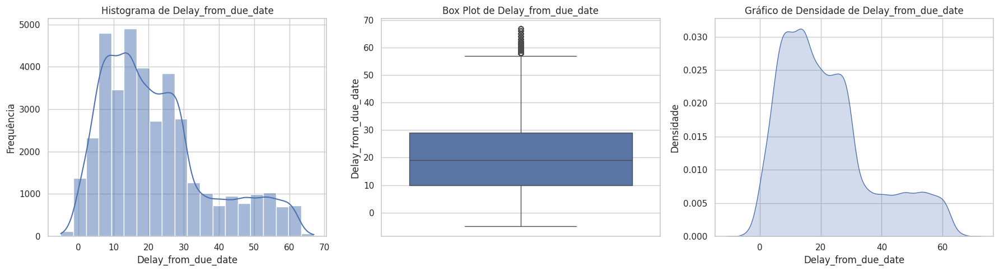


Analisando a coluna: 'Num_of_Delayed_Payment'

Medidas Estatísticas:
count    38541.000000
mean        31.801432
std        228.463065
min         -3.000000
25%          9.000000
50%         14.000000
75%         19.000000
max       4397.000000
Name: Num_of_Delayed_Payment, dtype: float64
Amplitude (Max - Min): 4400.00


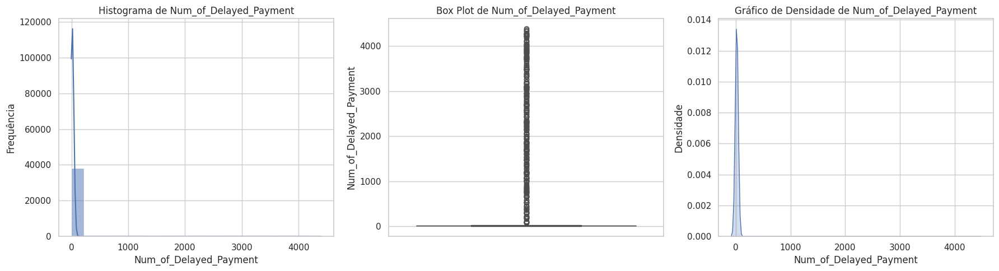


Analisando a coluna: 'Changed_Credit_Limit'

Medidas Estatísticas:
count    38541.000000
mean        10.773944
std          6.931756
min         -6.480000
25%          5.610000
50%          9.710000
75%         15.520000
max         36.290000
Name: Changed_Credit_Limit, dtype: float64
Amplitude (Max - Min): 42.77


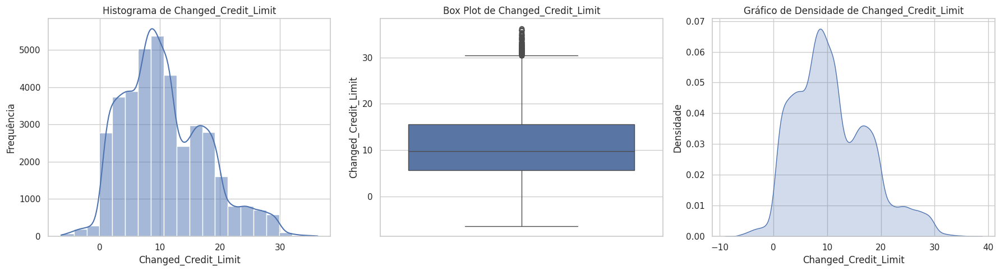


Analisando a coluna: 'Num_Credit_Inquiries'

Medidas Estatísticas:
count    38541.000000
mean        26.958875
std        186.408399
min          0.000000
25%          3.000000
50%          6.000000
75%          9.000000
max       2594.000000
Name: Num_Credit_Inquiries, dtype: float64
Amplitude (Max - Min): 2594.00


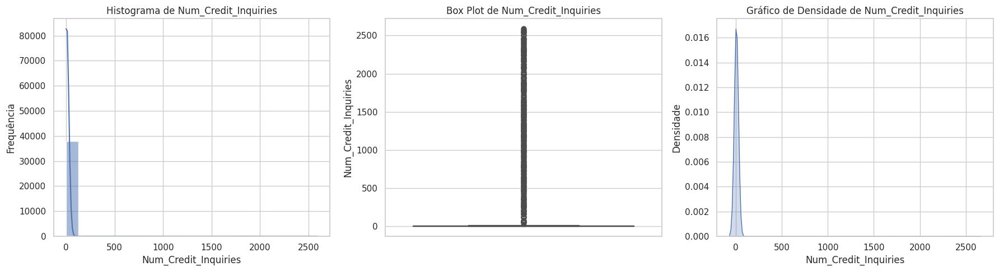


Analisando a coluna: 'Outstanding_Debt'

Medidas Estatísticas:
count    38541.000000
mean      1507.503917
std       1191.986131
min          0.230000
25%        599.540000
50%       1238.200000
75%       2133.240000
max       4998.070000
Name: Outstanding_Debt, dtype: float64
Amplitude (Max - Min): 4997.84


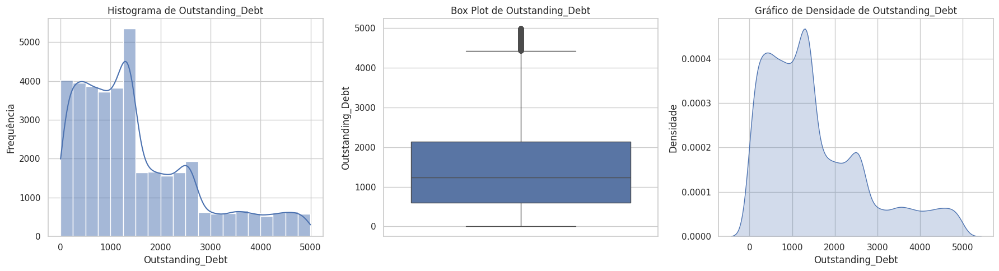


Analisando a coluna: 'Credit_Utilization_Ratio'

Medidas Estatísticas:
count    38541.000000
mean        32.211651
std          5.056382
min         20.881250
25%         28.049044
50%         32.239632
75%         36.402006
max         49.564519
Name: Credit_Utilization_Ratio, dtype: float64
Amplitude (Max - Min): 28.68


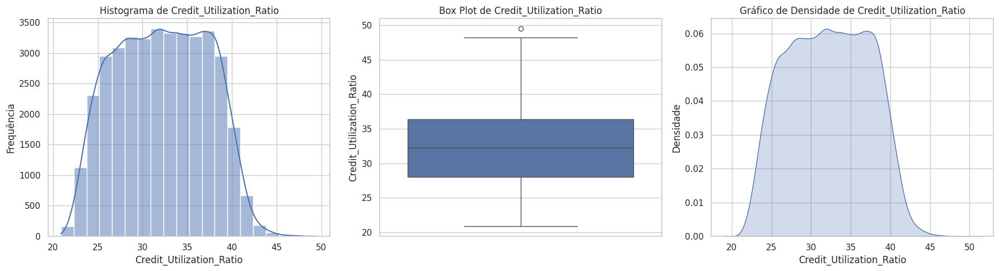


Analisando a coluna: 'Credit_History_Age'

Medidas Estatísticas:
count    38541.000000
mean       213.549778
std         99.864117
min          1.000000
25%        135.000000
50%        212.000000
75%        292.000000
max        404.000000
Name: Credit_History_Age, dtype: float64
Amplitude (Max - Min): 403.00


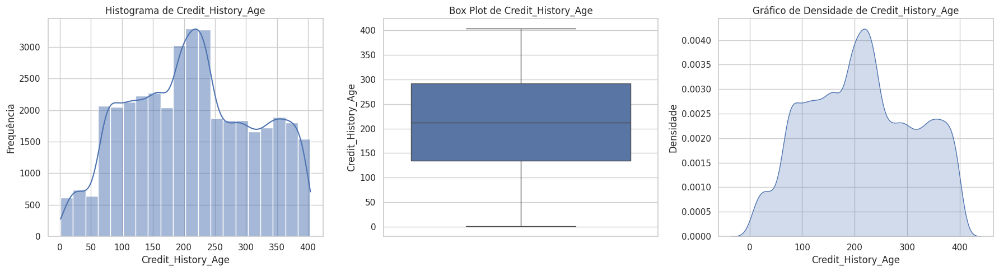


Analisando a coluna: 'Total_EMI_per_month'

Medidas Estatísticas:
count    38541.000000
mean      1419.674245
std       8301.203539
min          4.462837
25%         41.244418
50%         78.748619
75%        169.770374
max      82331.000000
Name: Total_EMI_per_month, dtype: float64
Amplitude (Max - Min): 82326.54


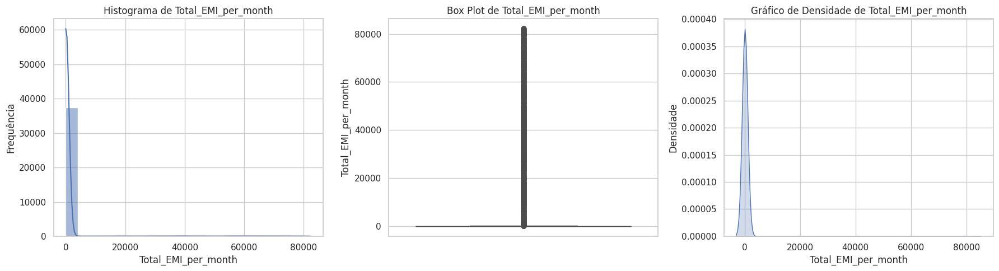


Analisando a coluna: 'Amount_invested_monthly'

Medidas Estatísticas:
count    38541.000000
mean       630.170323
std       2055.774132
min          0.000000
25%         71.736160
50%        130.300394
75%        251.798982
max      10000.000000
Name: Amount_invested_monthly, dtype: float64
Amplitude (Max - Min): 10000.00


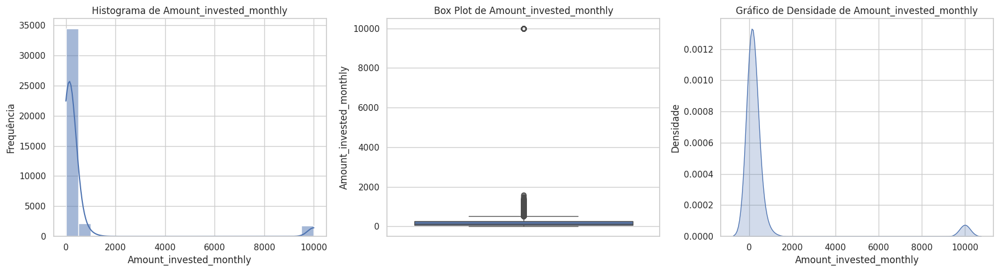


Analisando a coluna: 'Monthly_Balance'

Medidas Estatísticas:
count    3.854100e+04
mean    -3.459519e+22
std      3.395708e+24
min     -3.333333e+26
25%      2.644512e+02
50%      3.254196e+02
75%      4.454818e+02
max      1.552946e+03
Name: Monthly_Balance, dtype: float64
Amplitude (Max - Min): 333333333333333314856026112.00


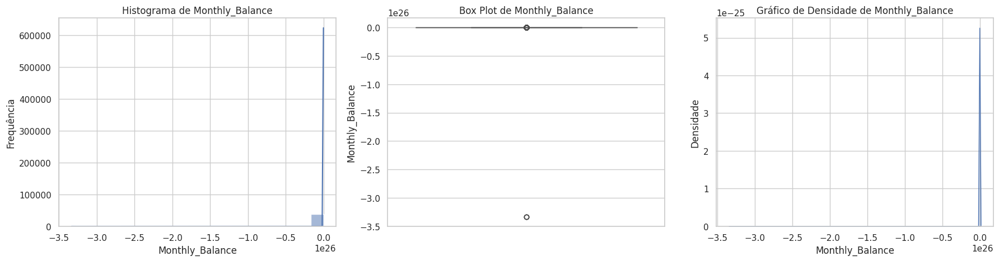

In [30]:
for col in numerical_cols:
    print(f"\nAnalisando a coluna: '{col}'")

    print("\nMedidas Estatísticas:")
    print(data_train[col].describe())

    amplitude = data_train[col].max() - data_train[col].min()
    print(f"Amplitude (Max - Min): {amplitude:.2f}")

    plt.figure(figsize=(18, 5))

    plt.subplot(1, 3, 1)
    sns.histplot(data=data_train, x=col, kde=True, bins=20)
    plt.title(f'Histograma de {col}')
    plt.xlabel(col)
    plt.ylabel('Frequência')

    plt.subplot(1, 3, 2)
    sns.boxplot(y=data_train[col])
    plt.title(f'Box Plot de {col}')
    plt.ylabel(col)

    plt.subplot(1, 3, 3)
    sns.kdeplot(data=data_train, x=col, fill=True)
    plt.title(f'Gráfico de Densidade de {col}')
    plt.xlabel(col)
    plt.ylabel('Densidade')

    plt.tight_layout()
    plt.show()

### Análise de Variáveis Categóricas


### Analisando a coluna: 'Occupation'

Contagem de Frequência:
Occupation
Lawyer           2779
Mechanic         2675
Accountant       2635
Doctor           2613
Architect        2605
Teacher          2602
Engineer         2595
Entrepreneur     2585
Media_Manager    2578
Developer        2576
Scientist        2569
Musician         2448
Manager          2434
Journalist       2424
Writer           2423
Name: count, dtype: int64

Proporção (%) de Frequência:
Occupation
Lawyer           7.21
Mechanic         6.94
Accountant       6.84
Doctor           6.78
Architect        6.76
Teacher          6.75
Engineer         6.73
Entrepreneur     6.71
Media_Manager    6.69
Developer        6.68
Scientist        6.67
Musician         6.35
Manager          6.32
Journalist       6.29
Writer           6.29
Name: proportion, dtype: float64

Moda: Lawyer


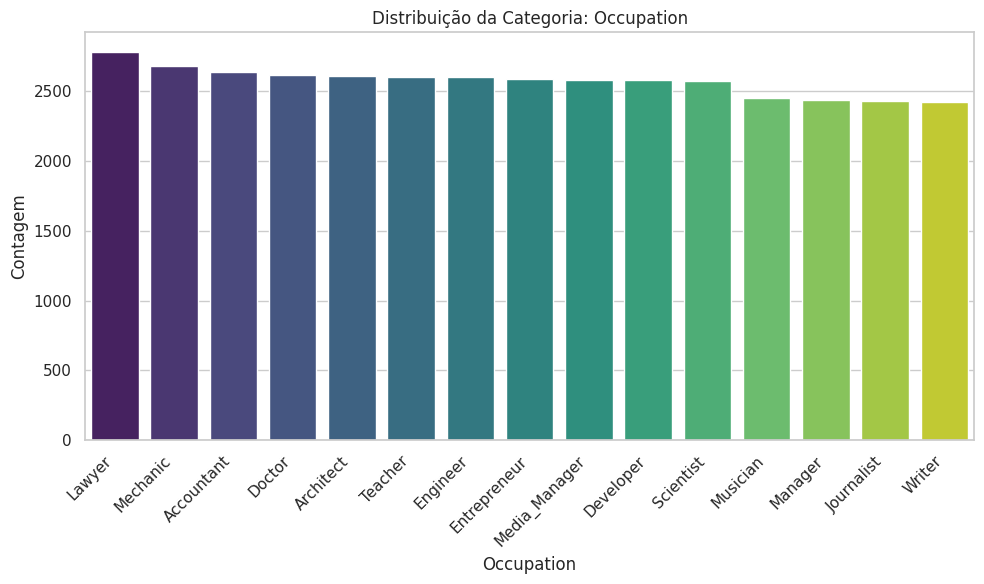


### Analisando a coluna: 'Num_of_Loan'

Contagem de Frequência:
Num_of_Loan
3      6250
2      6204
4      6082
1      4444
6      3239
       ... 
56        1
41        1
192       1
349       1
966       1
Name: count, Length: 188, dtype: int64

Proporção (%) de Frequência:
Num_of_Loan
3      16.22
2      16.10
4      15.78
1      11.53
6       8.40
       ...  
56      0.00
41      0.00
192     0.00
349     0.00
966     0.00
Name: proportion, Length: 188, dtype: float64

Moda: 3


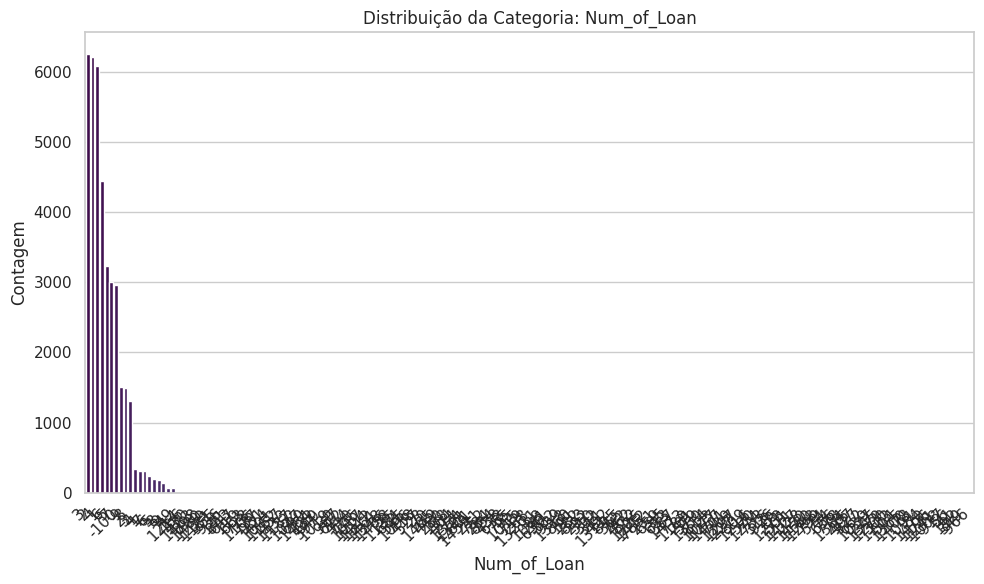


### Analisando a coluna: 'Type_of_Loan'

### Analisando a coluna: 'Credit_Mix'

Contagem de Frequência:
Credit_Mix
Standard    17718
Good        10547
Bad         10276
Name: count, dtype: int64

Proporção (%) de Frequência:
Credit_Mix
Standard    45.97
Good        27.37
Bad         26.66
Name: proportion, dtype: float64

Moda: Standard


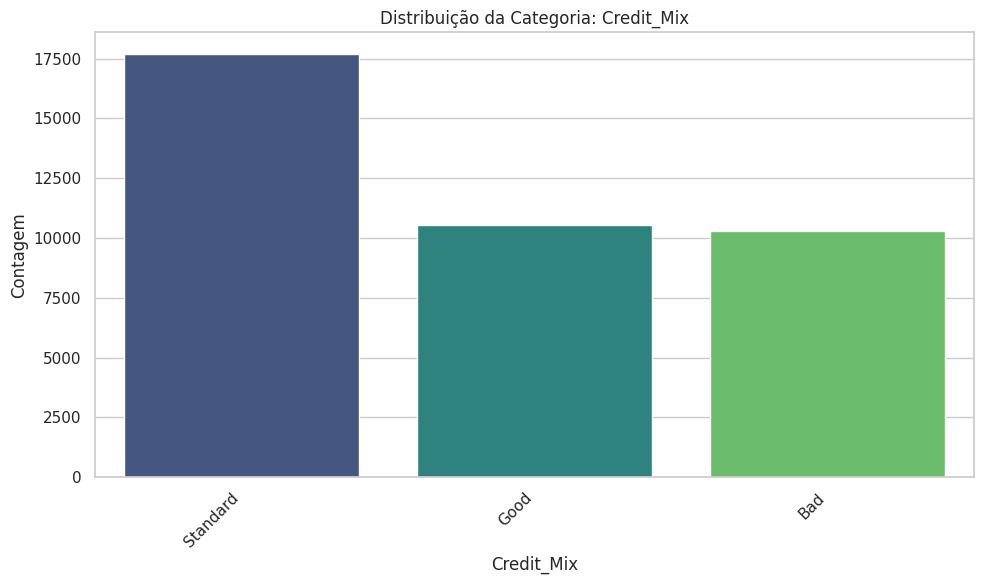


### Analisando a coluna: 'Payment_of_Min_Amount'

Contagem de Frequência:
Payment_of_Min_Amount
Yes    21507
No     12433
NM      4601
Name: count, dtype: int64

Proporção (%) de Frequência:
Payment_of_Min_Amount
Yes    55.80
No     32.26
NM     11.94
Name: proportion, dtype: float64

Moda: Yes


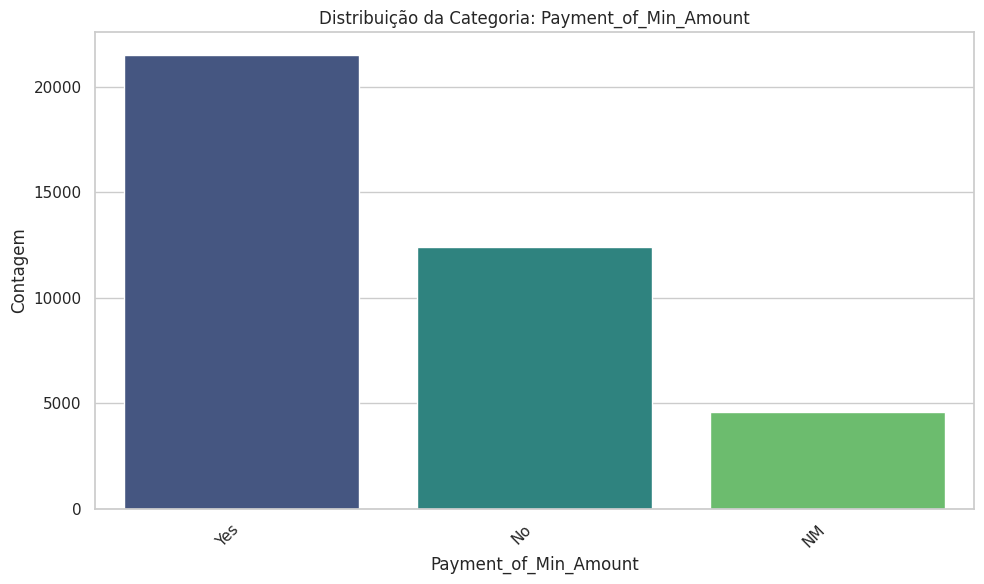


### Analisando a coluna: 'Payment_Behaviour'

Contagem de Frequência:
Payment_Behaviour
Low_spent_Small_value_payments      9769
High_spent_Medium_value_payments    6890
High_spent_Large_value_payments     5303
Low_spent_Medium_value_payments     5268
High_spent_Small_value_payments     4403
Low_spent_Large_value_payments      4083
!@9#%8                              2825
Name: count, dtype: int64

Proporção (%) de Frequência:
Payment_Behaviour
Low_spent_Small_value_payments      25.35
High_spent_Medium_value_payments    17.88
High_spent_Large_value_payments     13.76
Low_spent_Medium_value_payments     13.67
High_spent_Small_value_payments     11.42
Low_spent_Large_value_payments      10.59
!@9#%8                               7.33
Name: proportion, dtype: float64

Moda: Low_spent_Small_value_payments


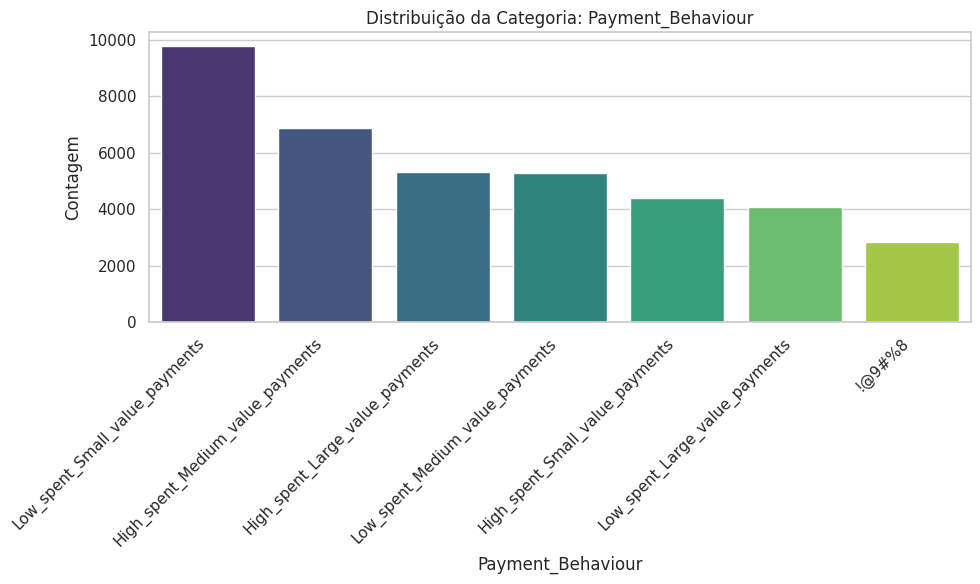


### Analisando a coluna: 'Credit_Score'

Contagem de Frequência:
Credit_Score
Standard    20365
Poor        11957
Good         6219
Name: count, dtype: int64

Proporção (%) de Frequência:
Credit_Score
Standard    52.84
Poor        31.02
Good        16.14
Name: proportion, dtype: float64

Moda: Standard


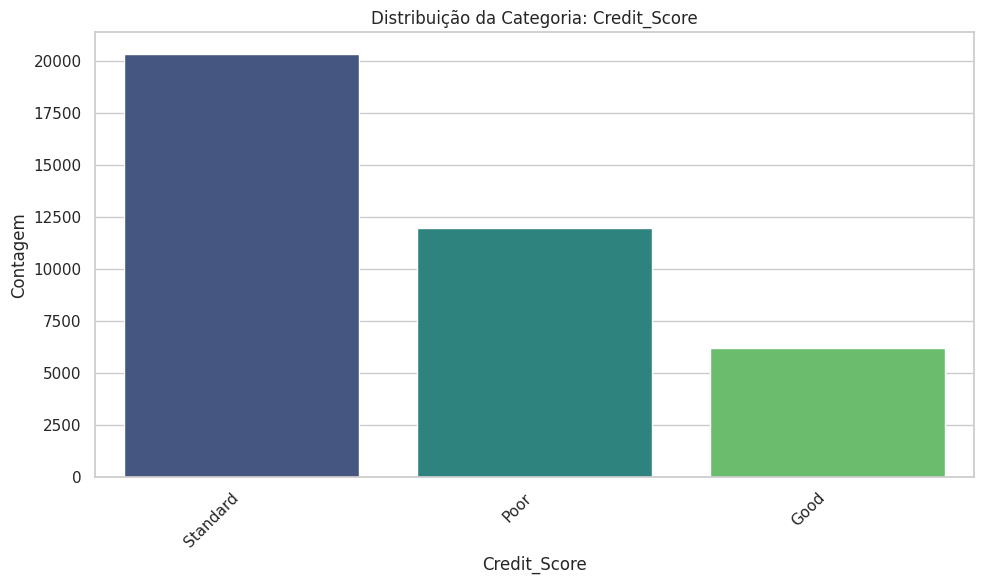

In [31]:
for col in categorical_cols:
    print(f"\n### Analisando a coluna: '{col}'")

    if (col=='Type_of_Loan'): continue # pula devido a grande quantidade de dados

    print("\nContagem de Frequência:")
    contagem_frequencia = data_train[col].value_counts()
    print(contagem_frequencia)

    print("\nProporção (%) de Frequência:")
    proporcao_frequencia = data_train[col].value_counts(normalize=True) * 100
    print(proporcao_frequencia.round(2))

    moda_valores = data_train[col].mode()
    print(f"\nModa: {', '.join(moda_valores.astype(str))}")

    plt.figure(figsize=(10, 6))
    sns.countplot(data=data_train, x=col, order=contagem_frequencia.index, palette='viridis')
    plt.title(f'Distribuição da Categoria: {col}')
    plt.xlabel(col)
    plt.ylabel('Contagem')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

### Análise da Relação entre Variáveis Numéricas

**Matriz de correlação**

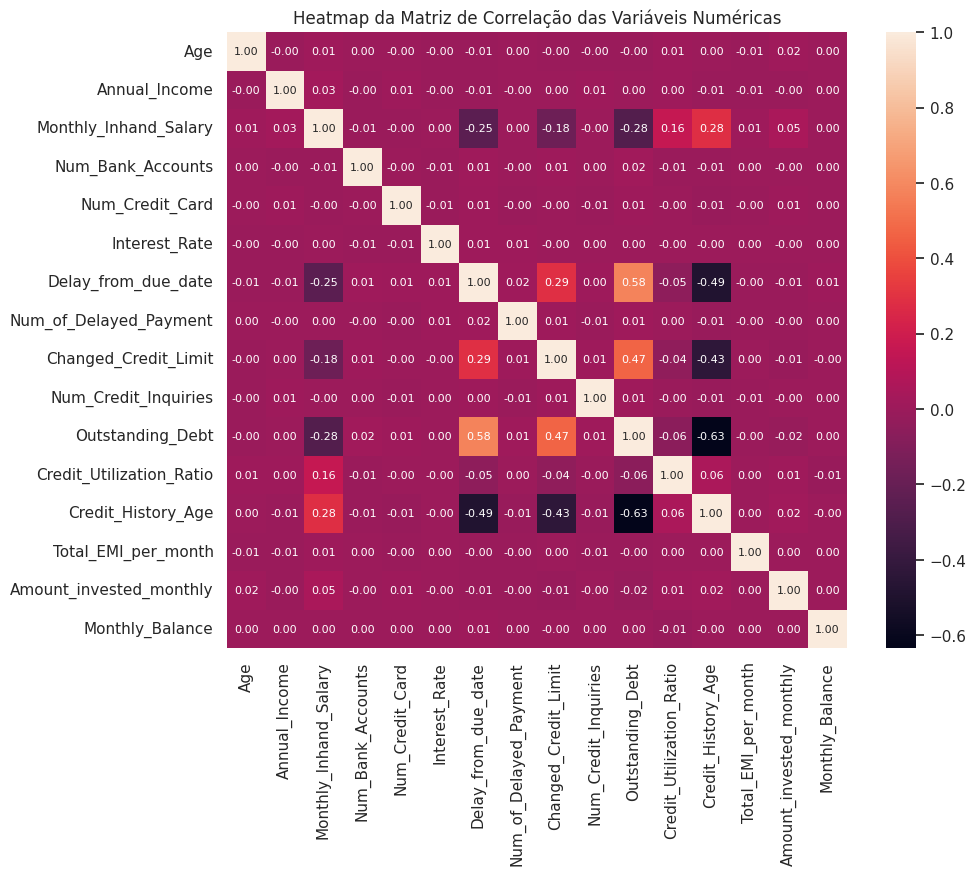

In [32]:
correlation_matrix = data_train[numerical_cols].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", annot_kws={'fontsize': 8})
plt.title('Heatmap da Matriz de Correlação das Variáveis Numéricas')
plt.show()

# Part 6 - Analise de outliers

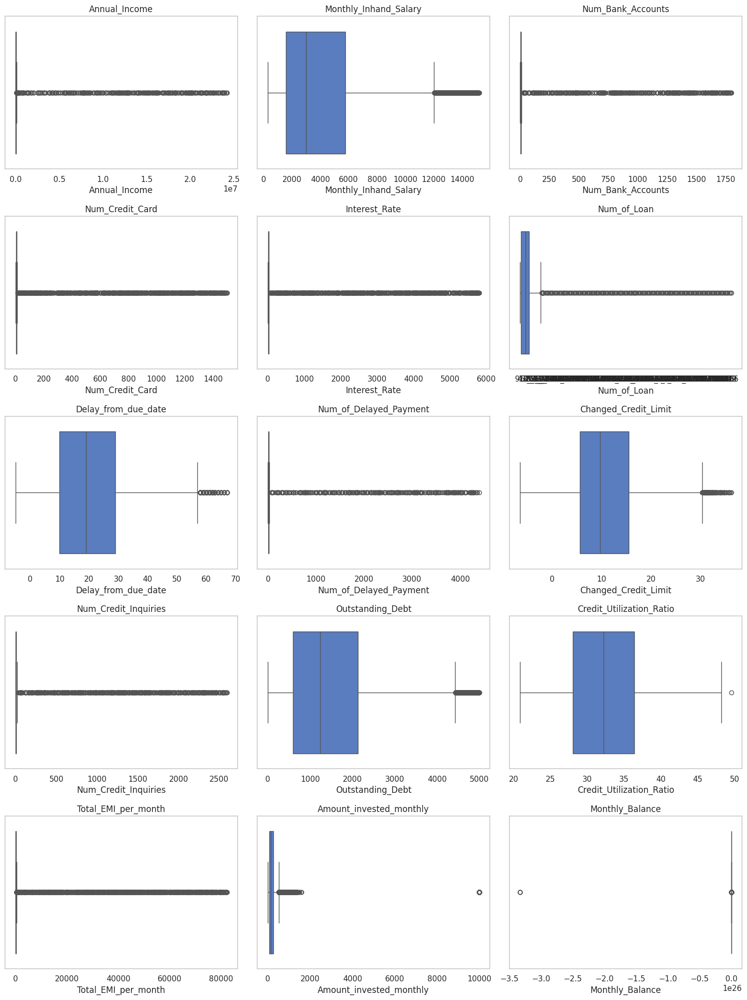

In [33]:
# Lista das colunas numéricas
num_cols = [
    'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts', 'Num_Credit_Card',
    'Interest_Rate', 'Num_of_Loan', 'Delay_from_due_date', 'Num_of_Delayed_Payment',
    'Changed_Credit_Limit', 'Num_Credit_Inquiries', 'Outstanding_Debt',
    'Credit_Utilization_Ratio', 'Total_EMI_per_month', 'Amount_invested_monthly',
    'Monthly_Balance'
]

# Visualizando com boxplots

# Criar boxplots para todas as colunas em um grid
n_cols = 3
n_rows = (len(num_cols) + n_cols - 1) // n_cols
plt.figure(figsize=(n_cols * 5, n_rows * 4))

for i, col in enumerate(num_cols, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.boxplot(x=data_train[col], palette="muted")
    plt.title(col)
    plt.tight_layout()
    plt.grid(False)

plt.show()

In [34]:
# Tratamento dos outliers

from scipy.stats import zscore

# Lista de colunas numéricas
num_cols = [
    'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts', 'Num_Credit_Card',
    'Interest_Rate', 'Num_of_Loan', 'Delay_from_due_date', 'Num_of_Delayed_Payment',
    'Changed_Credit_Limit', 'Num_Credit_Inquiries', 'Outstanding_Debt',
    'Credit_Utilization_Ratio', 'Total_EMI_per_month', 'Amount_invested_monthly',
    'Monthly_Balance'
]

# Garantir que todas as colunas estejam numéricas
for col in num_cols:
    data_train[col] = pd.to_numeric(data_train[col], errors='coerce')  # força float, coloca NaN em inválidos

# Tratar outliers com Z-Score
for col in num_cols:
    col_zscore = zscore(data_train[col].dropna())  # evita erro por NaN temporário
    outliers = np.abs(zscore(data_train[col])) > 3
    mediana = data_train[col].median()
    data_train.loc[outliers, col] = mediana

# Visualizando
print(data_train[num_cols].dtypes)

Annual_Income               float64
Monthly_Inhand_Salary       float64
Num_Bank_Accounts             int64
Num_Credit_Card               int64
Interest_Rate                 int64
Num_of_Loan                 float64
Delay_from_due_date           int64
Num_of_Delayed_Payment        int64
Changed_Credit_Limit        float64
Num_Credit_Inquiries        float64
Outstanding_Debt            float64
Credit_Utilization_Ratio    float64
Total_EMI_per_month         float64
Amount_invested_monthly     float64
Monthly_Balance             float64
dtype: object


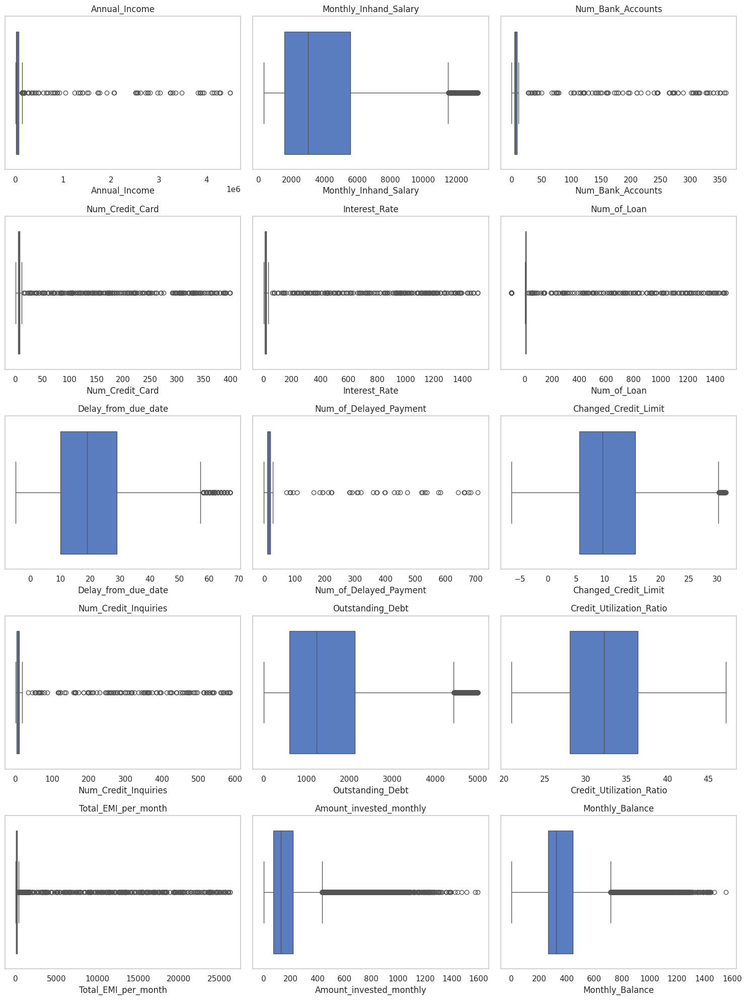

In [35]:
# Lista das colunas numéricas tratadas
num_cols = ['Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts', 'Num_Credit_Card',
            'Interest_Rate', 'Num_of_Loan', 'Delay_from_due_date', 'Num_of_Delayed_Payment',
            'Changed_Credit_Limit', 'Num_Credit_Inquiries', 'Outstanding_Debt',
            'Credit_Utilization_Ratio', 'Total_EMI_per_month', 'Amount_invested_monthly',
            'Monthly_Balance']

# Criar boxplots para todas as colunas após o tratamento dos outliers
n_cols = 3
n_rows = (len(num_cols) + n_cols - 1) // n_cols
plt.figure(figsize=(n_cols * 5, n_rows * 4))

for i, col in enumerate(num_cols, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.boxplot(x=data_train[col], palette="muted")
    plt.title(col)
    plt.tight_layout()
    plt.grid(False)

plt.show()

**Análise** Nesta etapa, foi realizada uma análise de outliers nas variáveis numéricas utilizando a técnica de Z-Score (padronização estatística). Em vez de excluir os dados extremos, optamos por um tratamento conservador, substituindo os valores considerados outliers (valores com |z| > 3) pela mediana da respectiva variável. Essa abordagem preserva o tamanho do conjunto de dados, reduz a influência de valores extremos nos modelos de machine learning e mantém a integridade estatística da base. Esse processo foi essencial para garantir uma distribuição mais equilibrada e evitar distorções na etapa de modelagem.

## Part 6.1 - Remoção outliers

In [36]:
def remover_outliers_iqr(df, colunas_numericas):
    """
    Remove outliers usando o método IQR para as colunas especificadas.

    Parâmetros:
    - df: DataFrame original
    - colunas_numericas: lista de colunas para aplicar a remoção de outliers

    Retorna:
    - df_limpo: DataFrame sem os outliers
    """
    df_limpo = df.copy()
    for col in colunas_numericas:
        Q1 = df_limpo[col].quantile(0.25)
        Q3 = df_limpo[col].quantile(0.75)
        IQR = Q3 - Q1
        limite_inferior = Q1 - 1.5 * IQR
        limite_superior = Q3 + 1.5 * IQR

        # Filtra os dados dentro dos limites
        df_limpo = df_limpo[(df_limpo[col] >= limite_inferior) & (df_limpo[col] <= limite_superior)]

    return df_limpo

colunas_numericas = ['Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
                     'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 'Delay_from_due_date',
                     'Num_of_Delayed_Payment', 'Changed_Credit_Limit', 'Num_Credit_Inquiries',
                     'Outstanding_Debt', 'Credit_Utilization_Ratio', 'Total_EMI_per_month',
                     'Amount_invested_monthly', 'Monthly_Balance']

data_train_sem_outliers = remover_outliers_iqr(data_train, colunas_numericas)
print(f"Número de registros antes: {data_train.shape[0]}")
print(f"Número de registros após remoção: {data_train_sem_outliers.shape[0]}")

Número de registros antes: 38541
Número de registros após remoção: 24556


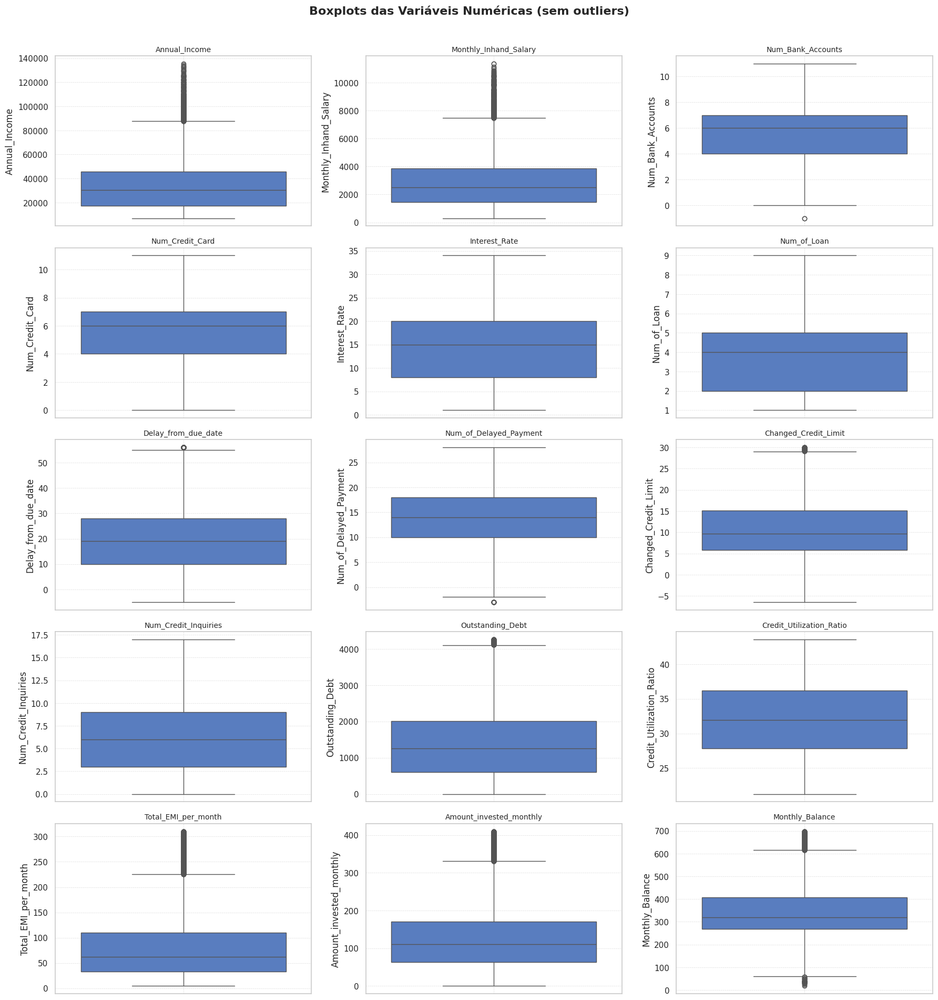

In [37]:
# Lista das colunas numéricas
colunas_numericas = ['Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
                     'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 'Delay_from_due_date',
                     'Num_of_Delayed_Payment', 'Changed_Credit_Limit', 'Num_Credit_Inquiries',
                     'Outstanding_Debt', 'Credit_Utilization_Ratio', 'Total_EMI_per_month',
                     'Amount_invested_monthly', 'Monthly_Balance']

# Número de colunas por linha no grid
n_cols = 3
n_rows = -(-len(colunas_numericas) // n_cols)  # arredondamento para cima

# Criar figura e eixos
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 4 * n_rows))
axes = axes.flatten()  # transforma em vetor para iterar

# Gerar cada boxplot sem outliers
for i, col in enumerate(colunas_numericas):
    sns.boxplot(y=data_train_sem_outliers[col], ax=axes[i], palette="muted")
    axes[i].set_title(col, fontsize=10)
    axes[i].set_xlabel("")
    axes[i].grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

# Remover subplots vazios (se houver)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("Boxplots das Variáveis Numéricas (sem outliers)", fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.03, 1, 0.97])  # espaço para o título
plt.show()

# Part 7 - Feature engineering

**Fazendo Feature engineering na base train.csv**

In [38]:
# Importando biblioteca
from sklearn.preprocessing import LabelEncoder

# Lista das variáveis categóricas
categorical_cols = ['Occupation', 'Type_of_Loan', 'Credit_Mix',
                    'Payment_of_Min_Amount', 'Payment_Behaviour', 'Credit_Score']

# Dicionário para armazenar os encoders
label_encoders = {}

# Aplicar LabelEncoder para cada coluna na base SEM outliers
for col in categorical_cols:
    le = LabelEncoder()
    data_train_sem_outliers[col] = data_train_sem_outliers[col].astype(str)  # garantir strings
    data_train_sem_outliers[col] = le.fit_transform(data_train_sem_outliers[col])
    label_encoders[col] = le  # guardar para uso posterior, ex: no test set


# Visualizando
le

LabelEncoder()

In [39]:
# Exemplo: visualizando classes da última coluna codificada
print(label_encoders['Credit_Score'].classes_)

['Good' 'Poor' 'Standard']


In [40]:
# Visualizando dataset
data_train_sem_outliers.head()

,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
6,23,12,19114.12,1824.843333,3,4,3,4.0,101,3,8,11.27,4.0,1,809.98,22.537593,271,1,49.574949,178.344067,6,244.565317,0
9,28,13,34847.84,3037.986667,2,4,6,1.0,513,7,1,7.42,2.0,1,605.03,38.550848,320,1,18.816215,40.391238,1,484.591214,0
12,28,13,34847.84,3037.986667,2,4,6,1.0,513,3,1,6.42,2.0,1,605.03,34.977895,323,1,18.816215,130.115420,6,444.867032,0
13,28,13,34847.84,3037.986667,2,4,6,1.0,513,3,0,5.42,2.0,1,605.03,33.381010,324,1,18.816215,43.477190,1,481.505262,0
15,28,13,34847.84,3037.986667,2,4,6,1.0,513,3,4,5.42,2.0,1,605.03,32.933856,326,1,18.816215,218.904344,6,356.078109,0


**Fazendo Feature engineering na base test.csv**

In [41]:
# Lista das variáveis categóricas que você quer transformar
categorical_cols = ['Occupation',
                    'Type_of_Loan',
                    'Credit_Mix',
                    'Payment_of_Min_Amount',
                    'Payment_Behaviour']

# Criar um LabelEncoder para cada coluna e aplicar
label_encoders = {}

# Aplicando Feature engineering na base train.csv
for col in categorical_cols:
    le = LabelEncoder()

    # garantir que tudo é string
    data_test[col] = data_test[col].astype(str)
    data_test[col] = le.fit_transform(data_test[col])

    # guardar o encoder para reverter depois se necessári
    label_encoders[col] = le

# Visualizando
le

LabelEncoder()

In [42]:
# Base train
data_train.head()

,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
6,23,Scientist,19114.12,1824.843333,3,4,3,4.0,"Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan",3,8,11.27,4.0,Good,809.98,22.537593,271,No,49.574949,178.344067,Low_spent_Small_value_payments,244.565317,Good
9,28,Teacher,34847.84,3037.986667,2,4,6,1.0,Credit-Builder Loan,7,1,7.42,2.0,Good,605.03,38.550848,320,No,18.816215,40.391238,High_spent_Large_value_payments,484.591214,Good
12,28,Teacher,34847.84,3037.986667,2,4,6,1.0,Credit-Builder Loan,3,1,6.42,2.0,Good,605.03,34.977895,323,No,18.816215,130.115420,Low_spent_Small_value_payments,444.867032,Good
13,28,Teacher,34847.84,3037.986667,2,4,6,1.0,Credit-Builder Loan,3,0,5.42,2.0,Good,605.03,33.381010,324,No,18.816215,43.477190,High_spent_Large_value_payments,481.505262,Good
15,28,Teacher,34847.84,3037.986667,2,4,6,1.0,Credit-Builder Loan,3,4,5.42,2.0,Good,605.03,32.933856,326,No,18.816215,218.904344,Low_spent_Small_value_payments,356.078109,Good


In [43]:
# Base test
data_test.head()

,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance
0,23,12,19114.12,1824.843333,3,4,3,4,127,3,7.0,11.27,2022.0,1,809.98,35.030402,273.0,1,49.574949,236.642682,6,186.266702
1,24,12,19114.12,1824.843333,3,4,3,4,127,3,9.0,13.27,4.0,1,809.98,33.053114,274.0,1,49.574949,21.465380,2,361.444004
3,24,12,19114.12,3086.305000,3,4,3,4,127,4,5.0,11.27,4.0,1,809.98,32.430559,276.0,1,49.574949,39.082511,2,343.826873
5,28,13,34847.84,3037.986667,2,4,6,1,674,3,3.0,5.42,5.0,1,605.03,30.116600,328.0,1,18.816215,251.627369,4,303.355083
8,35,4,143162.64,3086.305000,1,5,8,3,62,8,1942.0,7.10,3.0,1,1303.01,35.229707,221.0,1,246.992319,397.503654,5,854.226027


In [44]:
data_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 33344 entries, 0 to 49998
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       33344 non-null  int64  
 1   Occupation                33344 non-null  int64  
 2   Annual_Income             33344 non-null  float64
 3   Monthly_Inhand_Salary     33344 non-null  float64
 4   Num_Bank_Accounts         33344 non-null  int64  
 5   Num_Credit_Card           33344 non-null  int64  
 6   Interest_Rate             33344 non-null  int64  
 7   Num_of_Loan               33344 non-null  object 
 8   Type_of_Loan              33344 non-null  int64  
 9   Delay_from_due_date       33344 non-null  int64  
 10  Num_of_Delayed_Payment    33344 non-null  float64
 11  Changed_Credit_Limit      33344 non-null  float64
 12  Num_Credit_Inquiries      33344 non-null  float64
 13  Credit_Mix                33344 non-null  int64  
 14  Outstanding

# Part 8 - Divisão treino e teste

In [45]:
# Selecting variables for model
X = data_train_sem_outliers.drop('Credit_Score', axis=1)
y = data_train_sem_outliers['Credit_Score']

In [46]:
# Visualizing data x
X.shape

(24556, 22)

In [47]:
# Visualizing data y
y.shape

(24556,)

# Part 9 - Treinamento modelo

In [48]:
# Importando bibliotecas
from sklearn.model_selection import train_test_split

# Dividindo os dados em conjuntos de treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Visualizando o número de linhas e colunas de X_train
print("Visualizando os dados de X_train:", X_train.shape)

# Visualizando o número de linhas e colunas de y_train
print("Visualizando os dados de y_train:", y_train.shape)

Visualizando os dados de X_train: (19644, 22)
Visualizando os dados de y_train: (19644,)


In [49]:
# Preencher todos os NaNs com a mediana das respectivas colunas
X_train = X_train.fillna(X_train.median())
X_test = X_test.fillna(X_test.median())

# Remover linhas com NaN (menos recomendado se houver perda grande de dados)
X_train = X_train.dropna()

# manter alinhamento
y_train = y_train.loc[X_train.index]
X_test = X_test.dropna()
y_test = y_test.loc[X_test.index]

print("NaNs em X_train:", X_train.isnull().sum().sum())
print("NaNs em X_test:", X_test.isnull().sum().sum())

NaNs em X_train: 0
NaNs em X_test: 0


# Seção A) Machine learning

## Part 10 - Modelo machine learning

In [50]:
# Importando bibliotecas para diversos modelos de classificação e avaliação de desempenho
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score

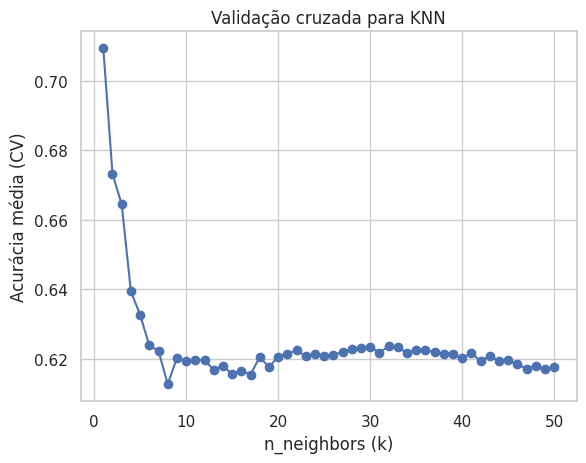

Melhor k = 1, acurácia média (5‑fold CV) = 0.7094


In [51]:
def find_best_n_neighbors(X, y, k_min=1, k_max=30, cv=5):
    """
    Encontra, por validação cruzada, o melhor valor de n_neighbors para KNN.

    Parâmetros
    ----------
    X : array-like ou DataFrame, shape (n_samples, n_features)
        Features de treino.

    y : array-like, shape (n_samples,)
        Labels de treino.

    k_min : int, opcional (default=1)
        Valor mínimo de k a testar.

    k_max : int, opcional (default=30)
        Valor máximo de k a testar.

    cv : int, opcional (default=5)
        Número de folds na validação cruzada.

    Retorna
    -------

    best_k : int
        Valor de k que obteve a maior acurácia média.

    best_score : float
        Acurácia média (CV) associada a best_k.

    all_scores : dict
        Dicionário {k: acurácia média} para todos os k testados.
    """
    best_k = k_min
    best_score = 0
    all_scores = {}

    for k in range(k_min, k_max + 1):
        knn = KNeighborsClassifier(n_neighbors=k)
        # cross_val_score retorna array de scores (um por fold)
        scores = cross_val_score(knn, X, y, cv=cv, scoring='accuracy')
        mean_score = scores.mean()
        all_scores[k] = mean_score

        if mean_score > best_score:
            best_score = mean_score
            best_k = k

    return best_k, best_score, all_scores

best_k, best_acc, scores_dict = find_best_n_neighbors(X_train, y_train,
                                                      k_min=1, k_max=50, cv=5)

# Agora scores_dict existe
ks   = list(scores_dict.keys())
accs = list(scores_dict.values())
ks = list(scores_dict.keys())
accs = list(scores_dict.values())

plt.plot(ks, accs, marker='o')
plt.xlabel("n_neighbors (k)")
plt.ylabel("Acurácia média (CV)")
plt.title("Validação cruzada para KNN")
plt.grid(True)
plt.show()

print(f"Melhor k = {best_k}, acurácia média (5‑fold CV) = {best_acc:.4f}")

In [52]:
### Treinamento modelo machine learning

# Lista de modelos a serem avaliados
models = [

    # Modelo Naive Bayes (bom para conjuntos de dados pequenos; assume independência entre as variáveis)
    GaussianNB(),

    # Árvore de Decisão (simples e interpretável; tende a sobreajustar)
    DecisionTreeClassifier(random_state=42),

    # Floresta Aleatória (ensemble de árvores de decisão; reduz overfitting e melhora a acurácia)
    RandomForestClassifier(n_estimators=100, random_state=42),

    # Regressão Logística (modelo linear, excelente para problemas de classificação binária)
    LogisticRegression(random_state=50, max_iter=1000),

    # AdaBoost (algoritmo de boosting; combina aprendizes fracos para criar um classificador forte)
    AdaBoostClassifier(random_state=45),

    # XGBoost (potente algoritmo de gradient boosting; lida bem com dados faltantes e inclui regularização)
    XGBClassifier(random_state=42),

    # LightGBM (outro modelo de gradient boosting otimizado para velocidade e desempenho)
    LGBMClassifier(boosting_type='gbdt',
                   bagging_fraction=0.9,
                   learning_rate=0.05,
                   feature_fraction=0.9,
                   bagging_freq=50,
                   verbosity=-1,
                   verbose=50),

    # K-Vizinhos Mais Próximos (instância-based learning; prediz a classe com base nos vizinhos mais próximos)
    KNeighborsClassifier(n_neighbors=best_k, metric='minkowski', p=2),

    # Gradient Boosting (técnica de boosting que constrói modelos sequencialmente para reduzir erros)
    GradientBoostingClassifier(random_state=42)
]

# 8. Percorre cada modelo e avalia o desempenho nos dados de treinamento e teste
for i, model in enumerate(models):

    # Treina o modelo no conjunto de treinamento
    model.fit(X_train, y_train)

    # Calcula a acurácia no conjunto de treinamento
    acuracia_treino = accuracy_score(y_train, model.predict(X_train))

    # Calcula a acurácia no conjunto de teste
    acuracia_teste = accuracy_score(y_test, model.predict(X_test))

    # Exibe o nome do modelo e suas acurácias
    print("-----------------")
    print()
    print(f"Modelo {i+1}: {type(model).__name__}")
    print(f"Acurácia de treino: {acuracia_treino:.4f}")
    print(f"Acurácia de teste: {acuracia_teste:.4f}")
    print("-----------------")
    print()

-----------------

Modelo 1: GaussianNB
Acurácia de treino: 0.6207
Acurácia de teste: 0.6295
-----------------

-----------------

Modelo 2: DecisionTreeClassifier
Acurácia de treino: 1.0000
Acurácia de teste: 0.7001
-----------------

-----------------

Modelo 3: RandomForestClassifier
Acurácia de treino: 0.9999
Acurácia de teste: 0.7864
-----------------

-----------------

Modelo 4: LogisticRegression
Acurácia de treino: 0.6038
Acurácia de teste: 0.5993
-----------------

-----------------

Modelo 5: AdaBoostClassifier
Acurácia de treino: 0.6738
Acurácia de teste: 0.6773
-----------------

-----------------

Modelo 6: XGBClassifier
Acurácia de treino: 0.9246
Acurácia de teste: 0.7724
-----------------

-----------------

Modelo 7: LGBMClassifier
Acurácia de treino: 0.7928
Acurácia de teste: 0.7577
-----------------

-----------------

Modelo 8: KNeighborsClassifier
Acurácia de treino: 1.0000
Acurácia de teste: 0.7457
-----------------

-----------------

Modelo 9: GradientBoostingCl

## Part 11 - Feature importance


Treinando Random Forest...


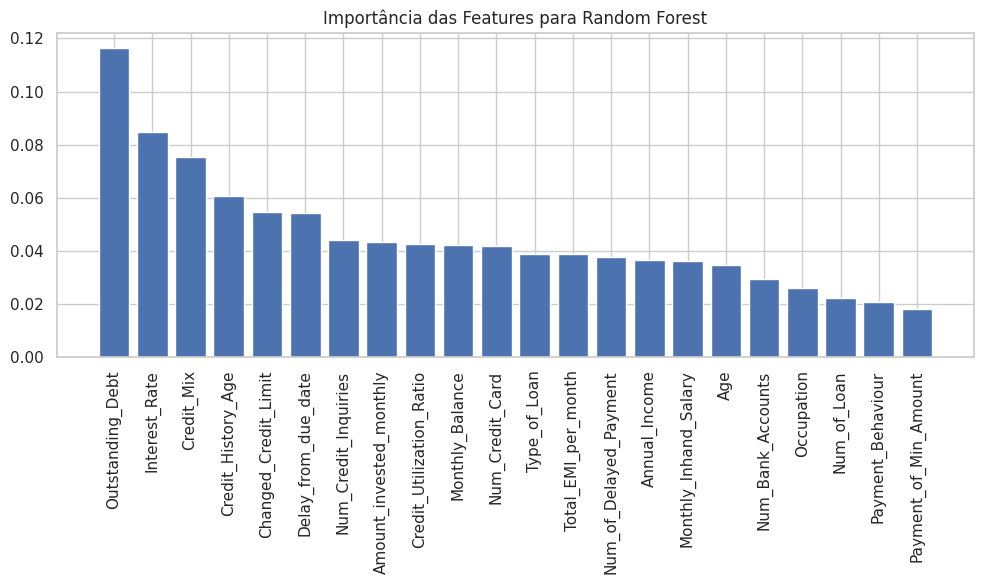

------------------------------------------------------------
Treinando Logistic Regression...


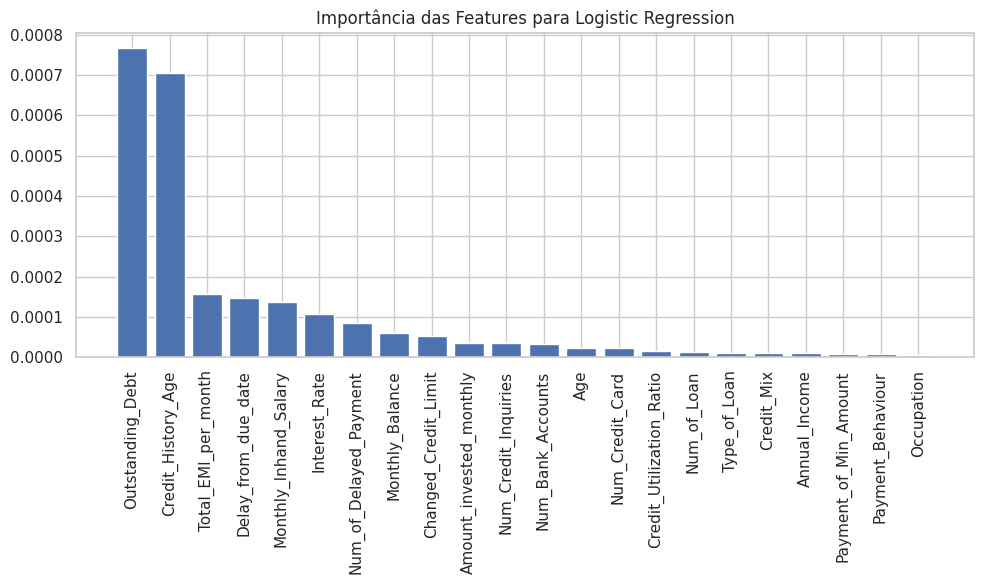

------------------------------------------------------------
Treinando Decision Tree...


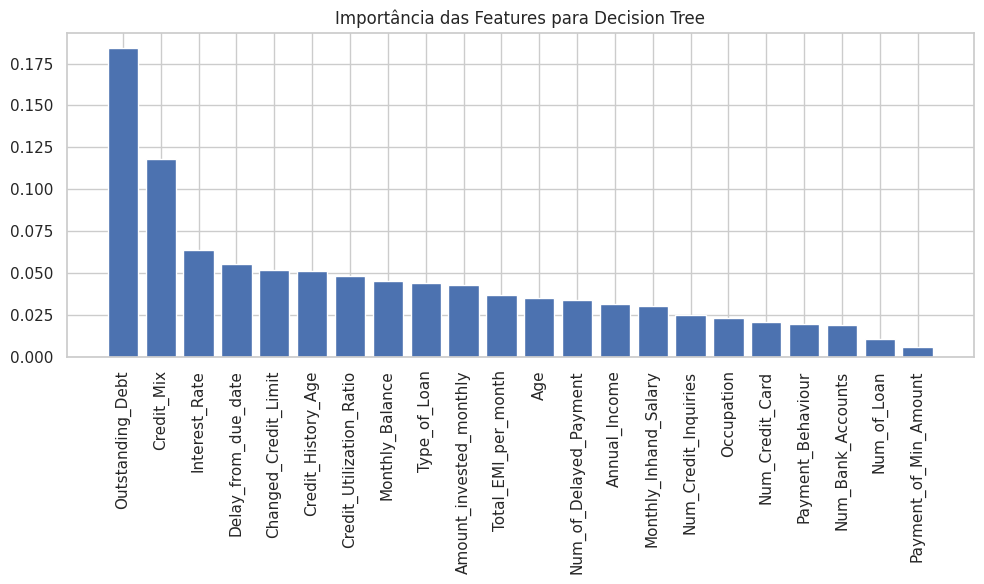

------------------------------------------------------------


In [53]:
models = {"Random Forest": RandomForestClassifier(),
          "Logistic Regression": LogisticRegression(),
          "Decision Tree": DecisionTreeClassifier()}

# Obtém os nomes das features
feature_names = X_train.columns

# Itera sobre os modelos
for model_name, model in models.items():
    print(f"Treinando {model_name}...")

    # Treina o modelo
    model.fit(X_train, y_train)

    # Plota a importância das features para modelos que suportam
    if hasattr(model, 'feature_importances_'):

        # Modelos baseados em árvore
        importance = model.feature_importances_
        indices = np.argsort(importance)[::-1]

        # Plota
        plt.figure(figsize=(10, 6))
        plt.title(f"Importância das Features para {model_name}")
        plt.bar(range(X_train.shape[1]), importance[indices], align="center")
        plt.xticks(range(X_train.shape[1]), feature_names[indices], rotation=90)
        plt.tight_layout()
        plt.show()

    elif model_name == "Logistic Regression":

        # Para Regressão Logística, use os coeficientes
        importance = np.abs(model.coef_[0])

        # Valor absoluto dos coeficientes
        indices = np.argsort(importance)[::-1]

        # Plota
        plt.figure(figsize=(10, 6))
        plt.title(f"Importância das Features para {model_name}")
        plt.bar(range(X_train.shape[1]), importance[indices], align="center")
        plt.xticks(range(X_train.shape[1]), feature_names[indices], rotation=90)
        plt.tight_layout()
        plt.grid(True)
        plt.show()
    else:
        print(f"Importância de feature não disponível para {model_name}")
    print("-" * 60)


## Part 12 - Métricas e avaliação

Treinando Naive Bayes...


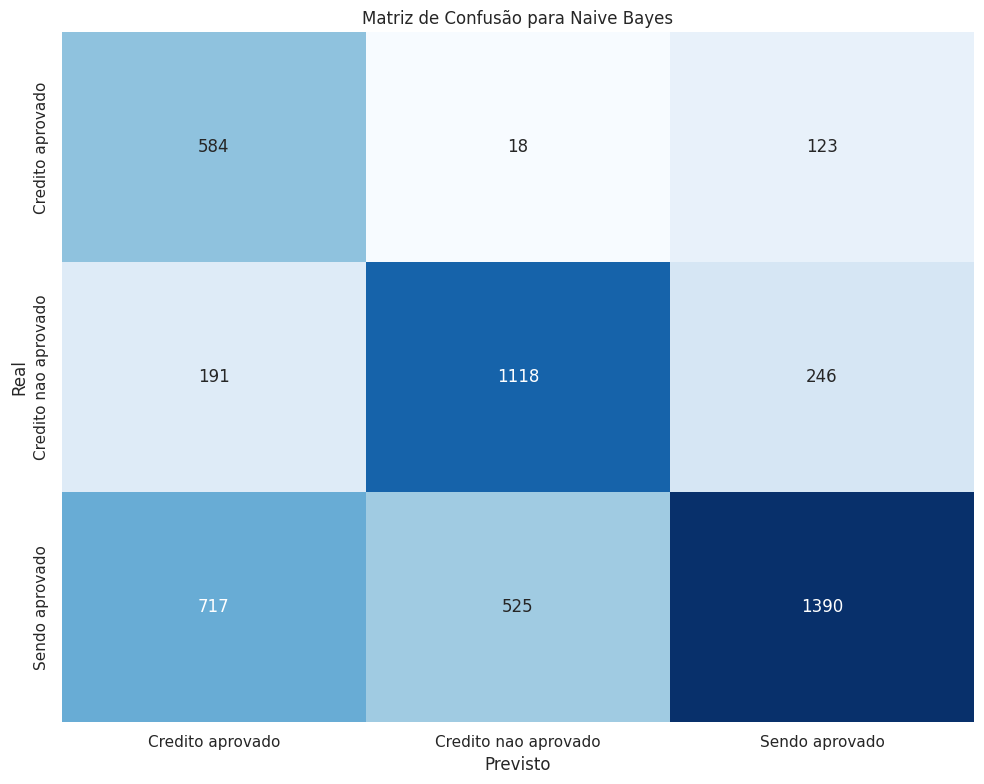

------------------------------------------------------------
Treinando Decision Tree...


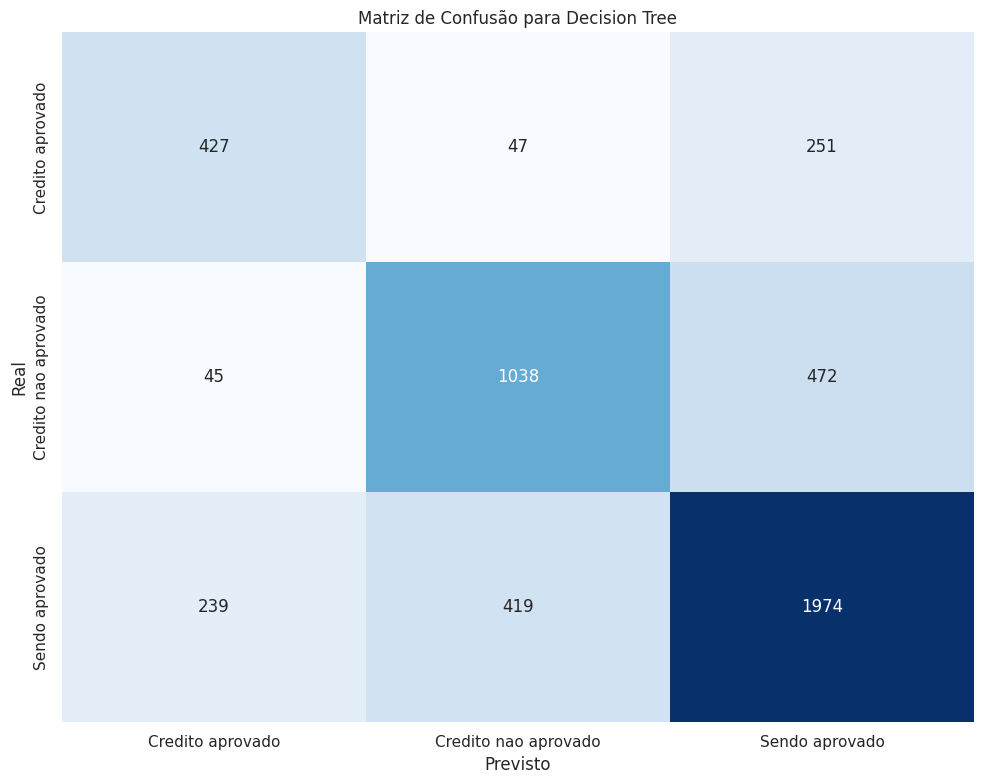

------------------------------------------------------------
Treinando Random Forest...


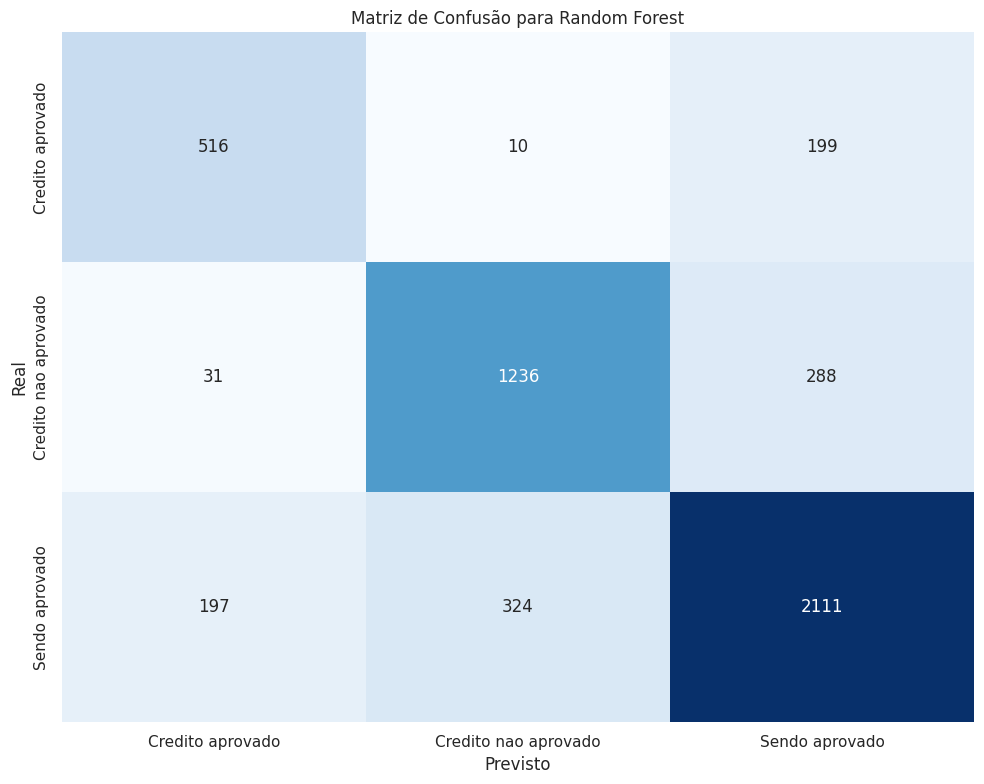

------------------------------------------------------------
Treinando Logistic Regression...


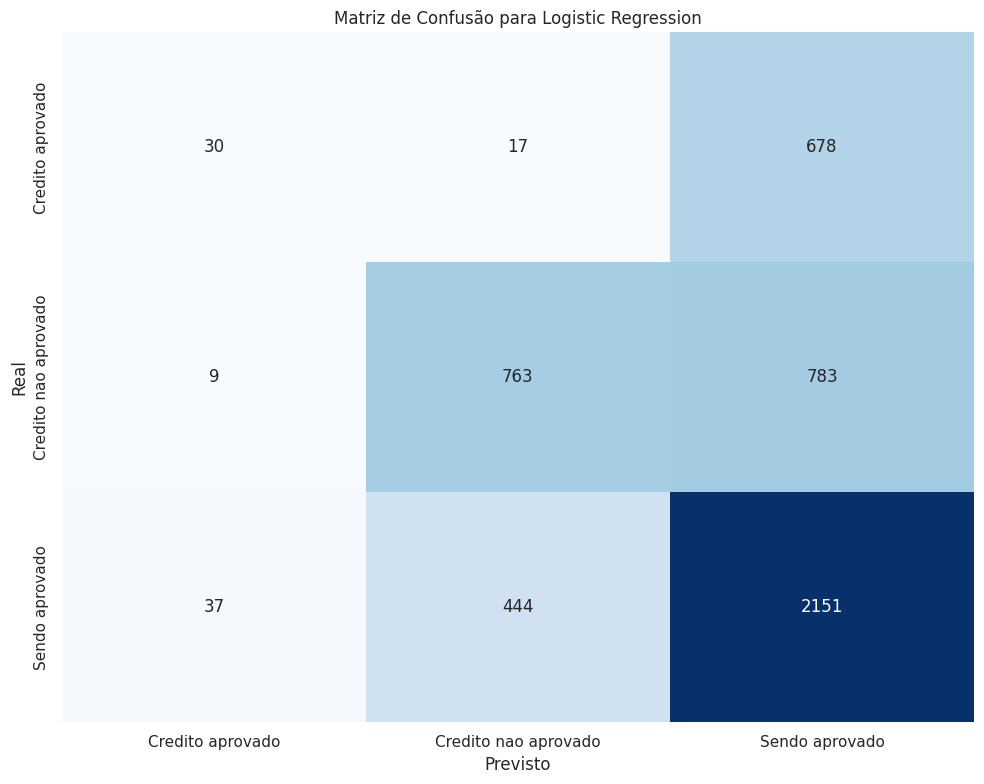

------------------------------------------------------------
Treinando AdaBoost...


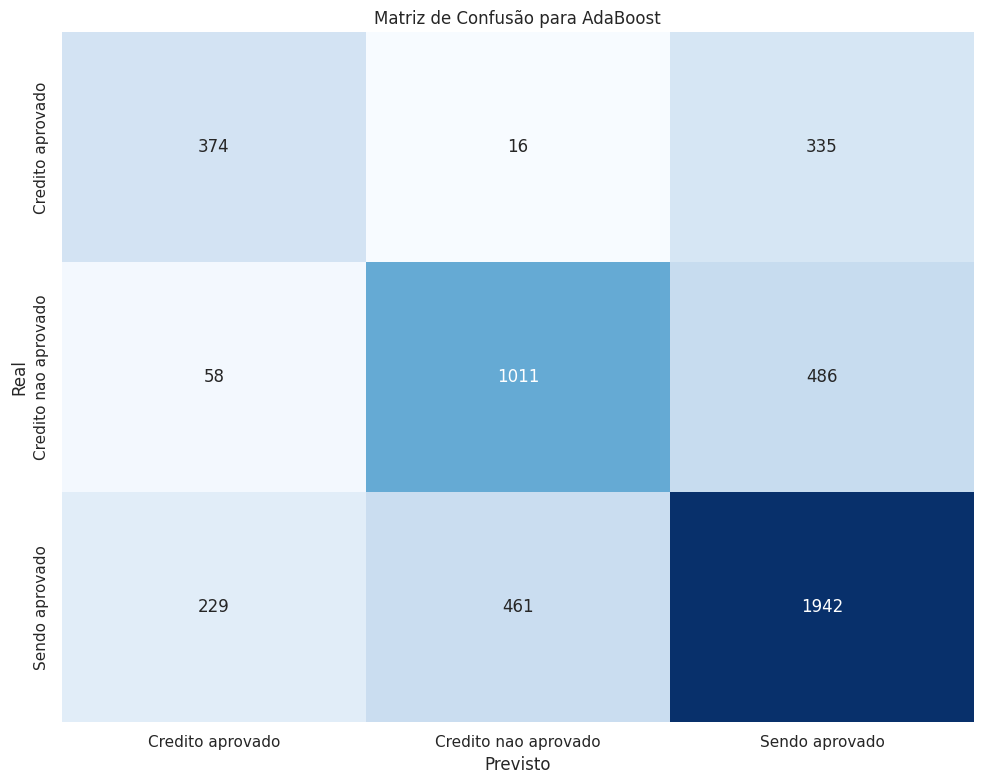

------------------------------------------------------------
Treinando XGBoost...


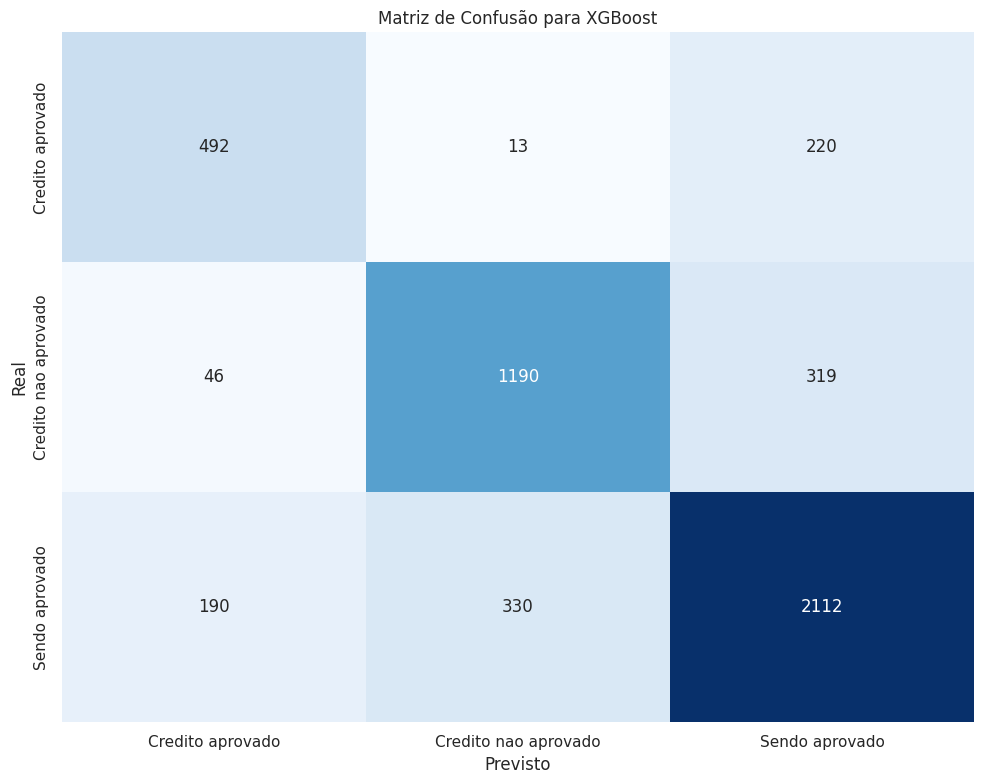

------------------------------------------------------------
Treinando LightGBM...


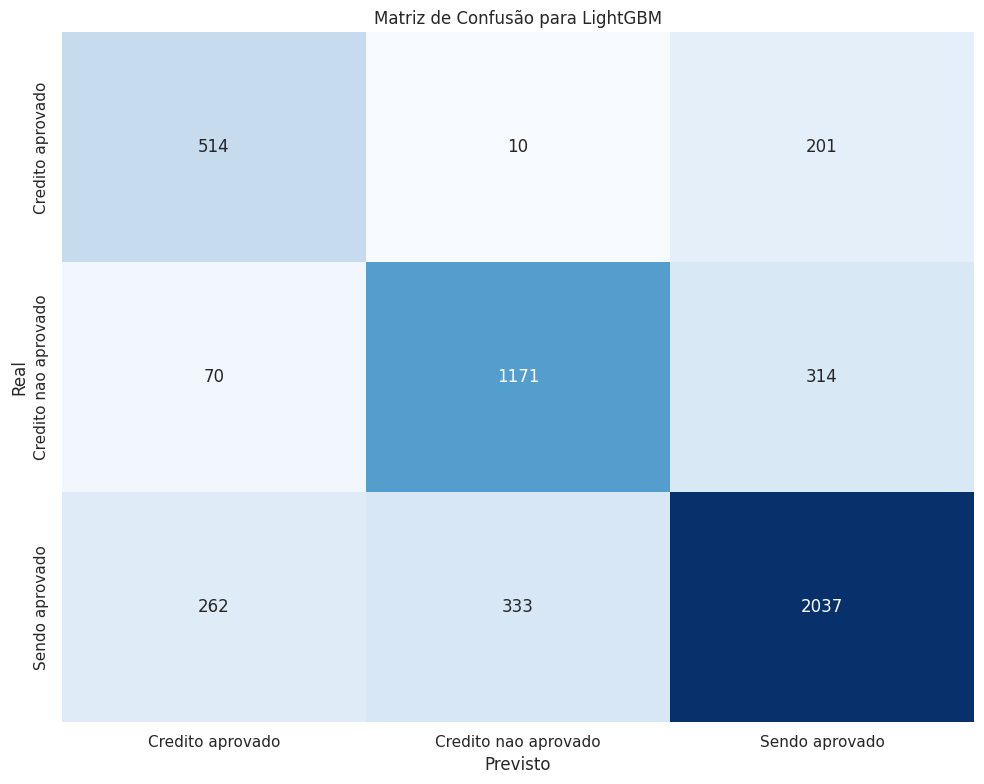

------------------------------------------------------------
Treinando K-Nearest Neighbors...


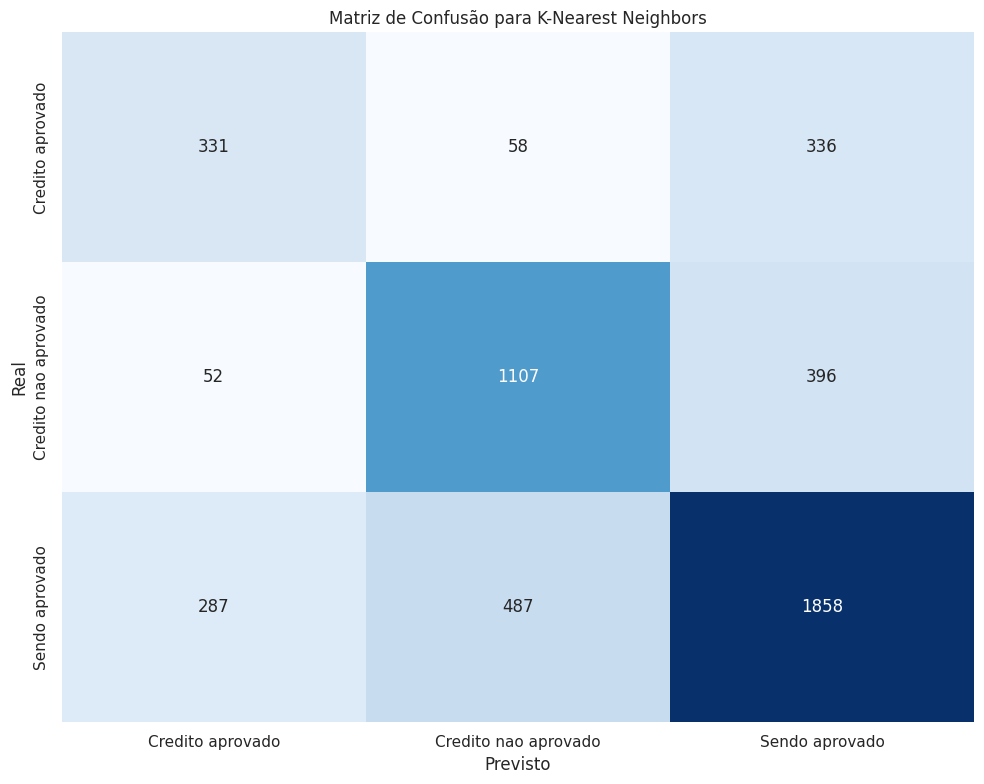

------------------------------------------------------------
Treinando Gradient Boosting...


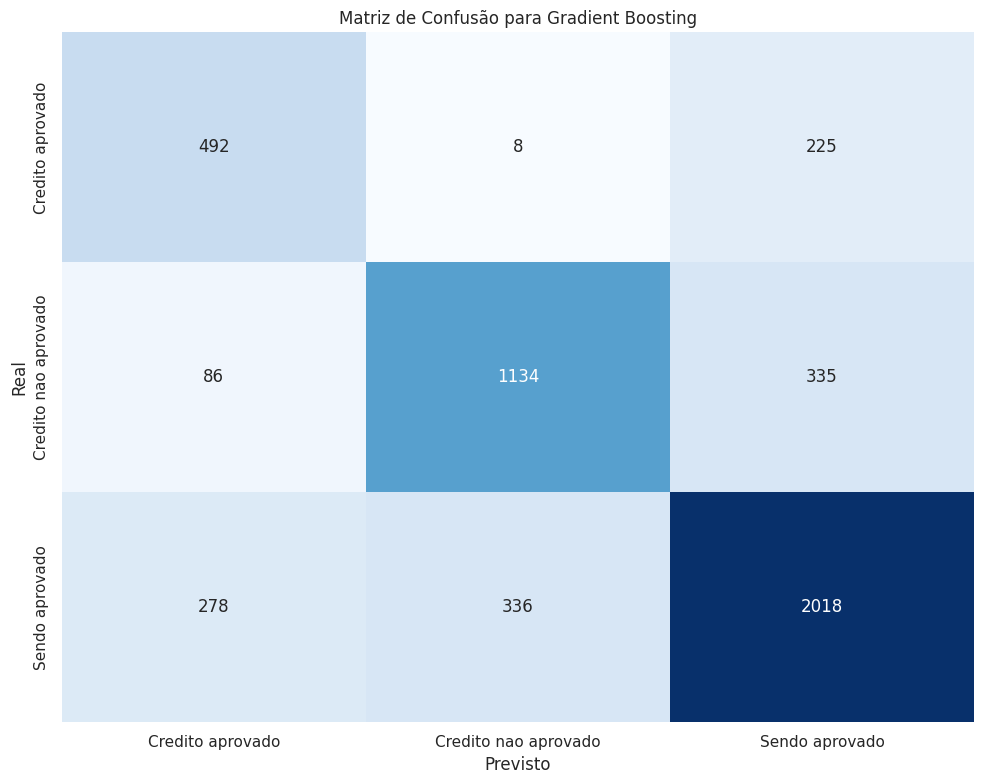

------------------------------------------------------------


In [54]:
from sklearn.metrics import confusion_matrix

# Define os modelos em um dicionário
models = {
    "Naive Bayes": GaussianNB(),
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "Logistic Regression": LogisticRegression(random_state=50, max_iter=1000),
    "AdaBoost": AdaBoostClassifier(random_state=45),
    "XGBoost": XGBClassifier(random_state=42),
    "LightGBM": LGBMClassifier(
        boosting_type='gbdt',
        bagging_fraction=0.9,
        learning_rate=0.05,
        feature_fraction=0.9,
        bagging_freq=50,
        verbosity=-1
    ),
    "K-Nearest Neighbors": KNeighborsClassifier(n_neighbors=5, metric='minkowski', p=2),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42)
}

# Define os rótulos de classe desejados
class_labels = ["Credito aprovado", "Credito nao aprovado", "Sendo aprovado"]

# Itera sobre os modelos e plota a matriz de confusão para cada um
for model_name, model in models.items():
    print(f"Treinando {model_name}...")

    # Treina o modelo no conjunto de treinamento
    model.fit(X_train, y_train)

    # Faz a previsão no conjunto de teste
    y_pred = model.predict(X_test)

    # Calcula a matriz de confusão
    cm = confusion_matrix(y_test, y_pred)

    # Plota a matriz de confusão com rótulos
    plt.figure(figsize=(10, 8))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        cmap="Blues",
        cbar=False,
        xticklabels=class_labels,
        yticklabels=class_labels
    )
    plt.title(f"Matriz de Confusão para {model_name}")
    plt.xlabel("Previsto")
    plt.ylabel("Real")
    plt.tight_layout()
    plt.show()

    print("-" * 60)

Treinando Naive Bayes...


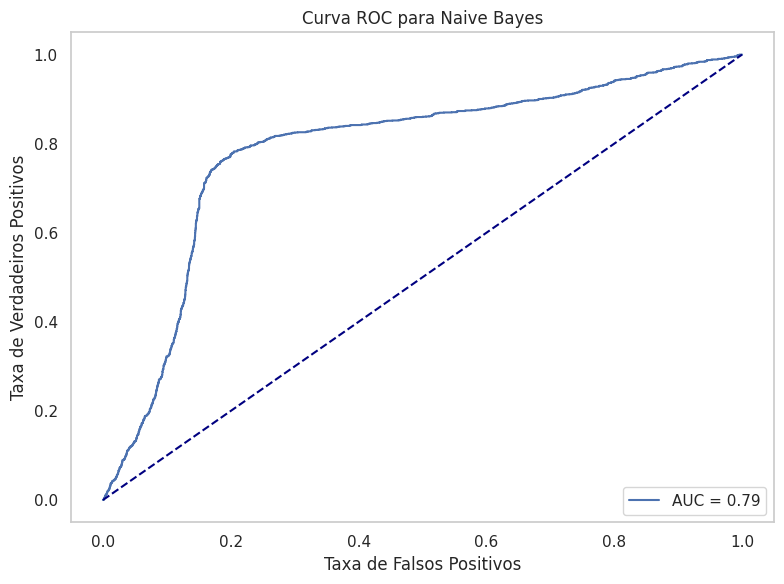

Treinando Decision Tree...


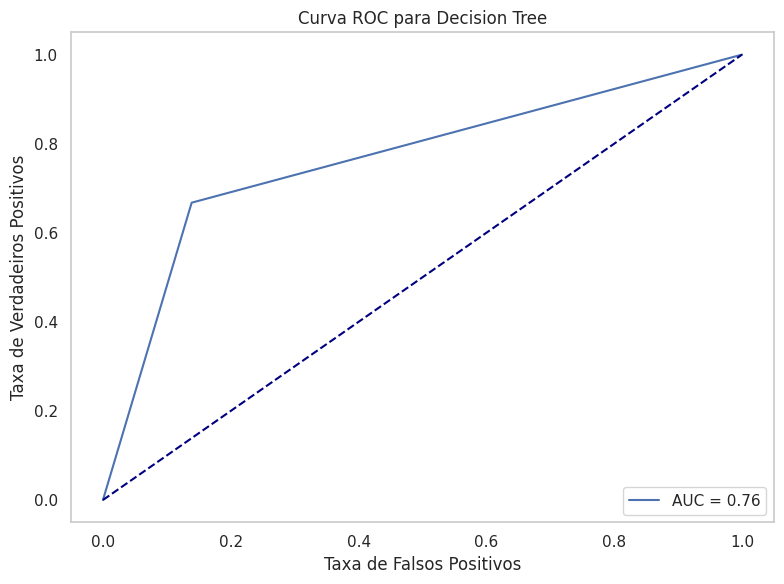

Treinando Random Forest...


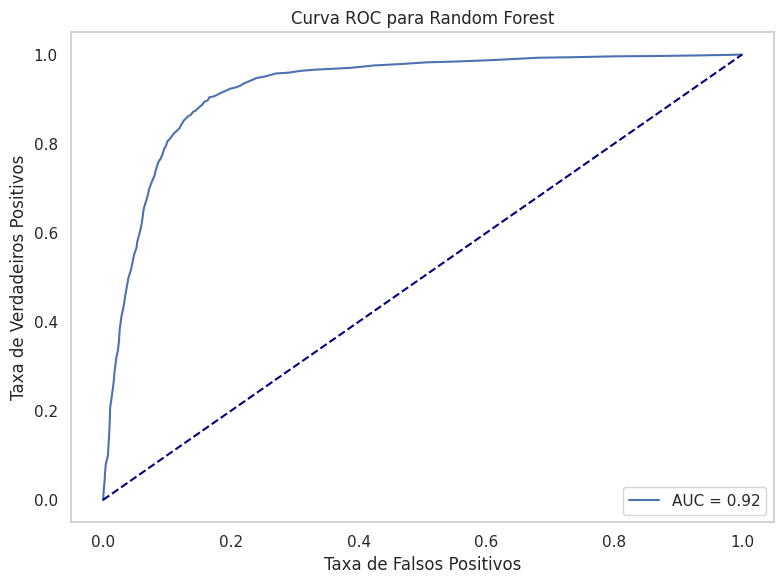

Treinando Logistic Regression...


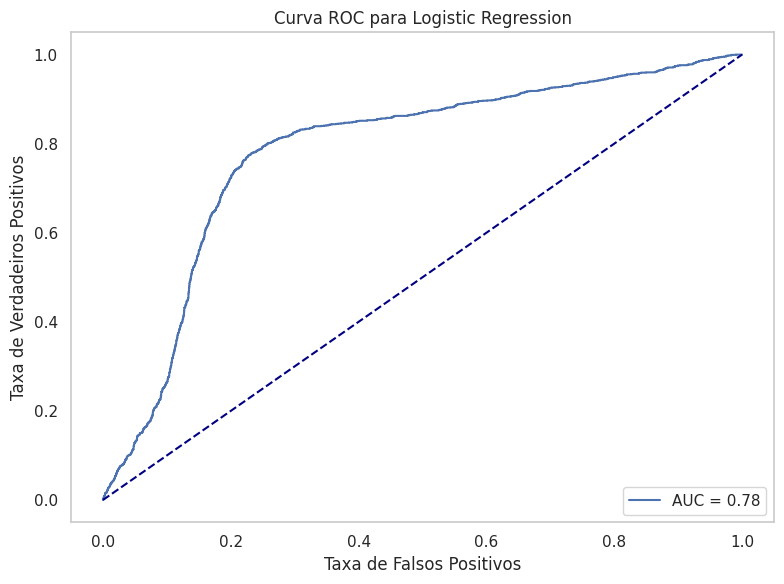

Treinando AdaBoost...


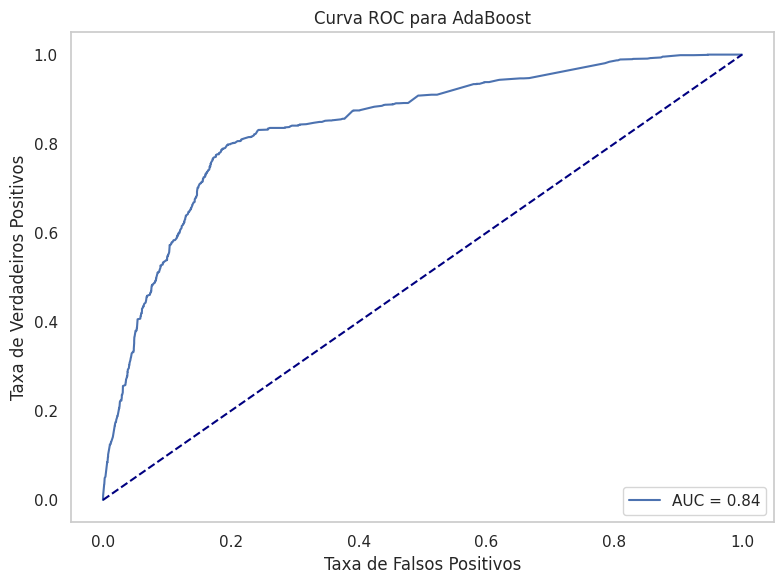

Treinando XGBoost...


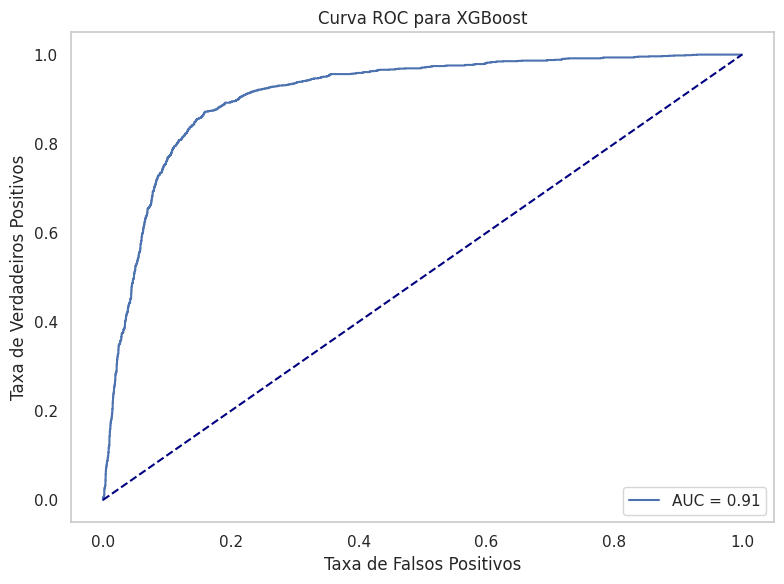

Treinando LightGBM...


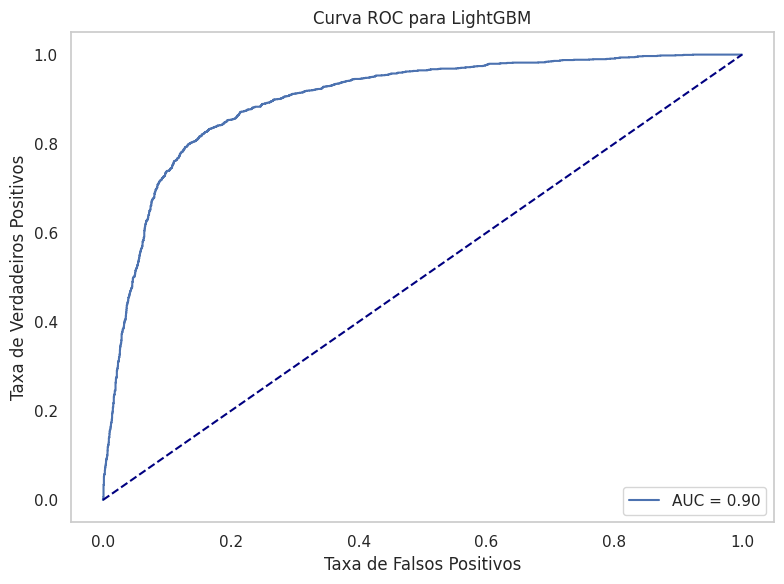

Treinando K-Nearest Neighbors...


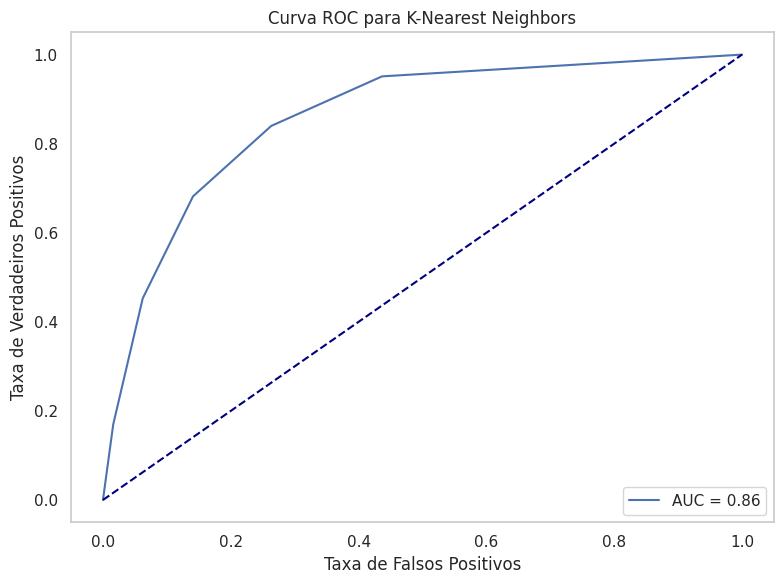

Treinando Gradient Boosting...


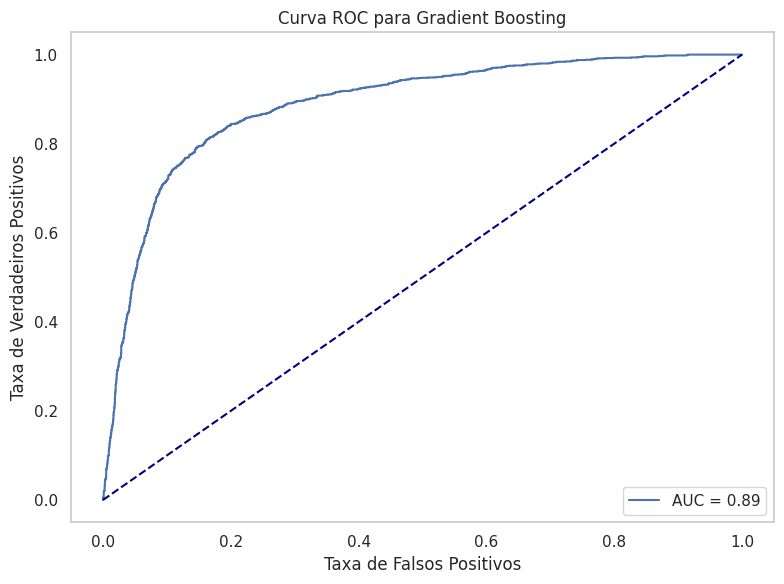

In [55]:
from sklearn.metrics import roc_curve, auc
import numpy as np
import matplotlib.pyplot as plt

# Itera sobre os modelos binários
for model_name, model in models.items():
    print(f"Treinando {model_name}...")

    # Treina o modelo
    model.fit(X_train, y_train)

    # Obtém as probabilidades da classe positiva (classe 1)
    y_prob = model.predict_proba(X_test)[:, 1]

    # Calcula a curva ROC: taxa de falsos positivos (fpr) e taxa de verdadeiros positivos (tpr)
    fpr, tpr, _ = roc_curve(y_test, y_prob, pos_label=1)
    # Calcula a área sob a curva ROC
    roc_auc = auc(fpr, tpr)

    # Plota a curva ROC
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.2f}")
    plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
    plt.xlabel("Taxa de Falsos Positivos")
    plt.ylabel("Taxa de Verdadeiros Positivos")
    plt.title(f"Curva ROC para {model_name}")
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.grid(False)
    plt.show()


In [56]:
from sklearn.metrics import classification_report

# Define os modelos em um dicionário
models = {"Naive Bayes": GaussianNB(),
          "Decision Tree": DecisionTreeClassifier(random_state=42),
          "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
          "Logistic Regression": LogisticRegression(random_state=50, max_iter=1000),
          "AdaBoost": AdaBoostClassifier(random_state=45),
          "XGBoost": XGBClassifier(random_state=42),
          "LightGBM": LGBMClassifier(boosting_type='gbdt',
                                     bagging_fraction=0.9,
                                     learning_rate=0.05,
                                     feature_fraction=0.9,
                                     bagging_freq=50,
                                     verbosity=-1),
          "K-Nearest Neighbors": KNeighborsClassifier(n_neighbors=5, metric='minkowski', p=2),
          "Gradient Boosting": GradientBoostingClassifier(random_state=42)}

# Itera sobre os modelos e calcula o relatório de classificação
for model_name, model in models.items():
    print(f"Treinando {model_name}...")

    # Treina o modelo
    model.fit(X_train, y_train)

    # Faz previsões no conjunto de teste
    y_pred = model.predict(X_test)

    # Calcula e exibe o relatório de classificação
    print(f"Relatório de Classificação para {model_name}:")
    report = classification_report(y_test, y_pred)
    print(report)
    print("-" * 60)


Treinando Naive Bayes...
Relatório de Classificação para Naive Bayes:
              precision    recall  f1-score   support

           0       0.39      0.81      0.53       725
           1       0.67      0.72      0.70      1555
           2       0.79      0.53      0.63      2632

    accuracy                           0.63      4912
   macro avg       0.62      0.68      0.62      4912
weighted avg       0.69      0.63      0.64      4912

------------------------------------------------------------
Treinando Decision Tree...
Relatório de Classificação para Decision Tree:
              precision    recall  f1-score   support

           0       0.60      0.59      0.59       725
           1       0.69      0.67      0.68      1555
           2       0.73      0.75      0.74      2632

    accuracy                           0.70      4912
   macro avg       0.67      0.67      0.67      4912
weighted avg       0.70      0.70      0.70      4912

---------------------------------

## Part 13 - Salvando modelos

- Foi criada uma pasta chamada /content/models, destinada ao armazenamento geral dos modelos gerados. Nessa pasta, todos os modelos treinados ou baixados são salvos de forma organizada, facilitando o acesso e o gerenciamento durante o processo de desenvolvimento e experimentação.

In [57]:
import os
import pickle
from sklearn.metrics import accuracy_score

# Caminho onde vamos guardar os .pkl
models_dir = r"/content/models"
os.makedirs(models_dir, exist_ok=True)

# Lista de modelos
models = [GaussianNB(),
          DecisionTreeClassifier(random_state=42),
          RandomForestClassifier(n_estimators=100, random_state=42),LogisticRegression(random_state=50, max_iter=1000),
          AdaBoostClassifier(random_state=45),
          XGBClassifier(random_state=42),
          LGBMClassifier(boosting_type='gbdt',
                         bagging_fraction=0.9,
                         learning_rate=0.05,
                         feature_fraction=0.9,
                         bagging_freq=50,
                         verbosity=-1,
                         verbose=50),
          KNeighborsClassifier(n_neighbors=5, metric='minkowski', p=2),GradientBoostingClassifier(random_state=42)
          ]

# Loop para treinar, avaliar e salvar cada modelo
for i, model in enumerate(models, start=1):
    # Treino
    model.fit(X_train, y_train)

    # Métricas
    acuracia_treino = accuracy_score(y_train, model.predict(X_train))
    acuracia_teste  = accuracy_score(y_test,  model.predict(X_test))

    print("-" * 40)
    print(f"Modelo {i}: {type(model).__name__}")
    print(f"Acurácia de treino: {acuracia_treino:.4f}")
    print(f"Acurácia de teste:  {acuracia_teste:.4f}")
    print("-" * 40)

    # Salvar no mesmo diretório criado
    model_filename = os.path.join(models_dir, f"{type(model).__name__}.pkl")
    with open(model_filename, 'wb') as f:
        pickle.dump(model, f)
    print(f"Modelo salvo em: {model_filename}\n")

----------------------------------------
Modelo 1: GaussianNB
Acurácia de treino: 0.6207
Acurácia de teste:  0.6295
----------------------------------------
Modelo salvo em: /content/models/GaussianNB.pkl

----------------------------------------
Modelo 2: DecisionTreeClassifier
Acurácia de treino: 1.0000
Acurácia de teste:  0.7001
----------------------------------------
Modelo salvo em: /content/models/DecisionTreeClassifier.pkl

----------------------------------------
Modelo 3: RandomForestClassifier
Acurácia de treino: 0.9999
Acurácia de teste:  0.7864
----------------------------------------
Modelo salvo em: /content/models/RandomForestClassifier.pkl

----------------------------------------
Modelo 4: LogisticRegression
Acurácia de treino: 0.6038
Acurácia de teste:  0.5993
----------------------------------------
Modelo salvo em: /content/models/LogisticRegression.pkl

----------------------------------------
Modelo 5: AdaBoostClassifier
Acurácia de treino: 0.6738
Acurácia de tes

## Part 14 - Resultado final

In [58]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# List of models for comparison
models = [('Naive Bayes', GaussianNB()),
          ('Decision Tree', DecisionTreeClassifier(random_state=42)),
          ('Random Forest', RandomForestClassifier(n_estimators=100, random_state=42)),
          ('Logistic Regression', LogisticRegression(random_state=50, max_iter=1000)),
          ('AdaBoost', AdaBoostClassifier(random_state=45)),
          ('XGBoost', XGBClassifier(random_state=42)),
          ('LightGBM', LGBMClassifier(boosting_type='gbdt', bagging_fraction=0.9, learning_rate=0.05, feature_fraction=0.9, bagging_freq=50, verbosity=-1)),
          ('K-Nearest Neighbors', KNeighborsClassifier(n_neighbors=5, metric='minkowski', p=2)),
          ('Gradient Boosting', GradientBoostingClassifier(random_state=42))]

# List to store the metrics of each model
metrics_list = []

# Iterate over the models
for model_name, model in models:
    # Train the model
    model.fit(X_train, y_train)

    # Make predictions on the test set
    y_pred = model.predict(X_test)

    # Calculate the metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    # Store the metrics of this model
    metrics_list.append({'Model': model_name,
                         'Accuracy': accuracy,
                         'Precision': precision,
                         'Recall': recall,
                         'F1-Score': f1})

# Convert the list of metrics into a DataFrame
metrics_df = pd.DataFrame(metrics_list)

# Find the best model based on F1-Score (or Accuracy if preferred)
best_model_idx = metrics_df['F1-Score'].idxmax()

# Function to highlight the best model with a yellow background
def highlight_best(s):
    return ['background-color: yellow' if s.name == best_model_idx else '' for _ in s]

# Apply the highlight function to the DataFrame
styled_df = metrics_df.style.apply(highlight_best, axis=1)

# Display the DataFrame with the best model highlighted
styled_df

,Model,Accuracy,Precision,Recall,F1-Score
0,Naive Bayes,0.629479,0.694279,0.629479,0.637105
1,Decision Tree,0.700122,0.699314,0.700122,0.699591
2,Random Forest,0.786441,0.786979,0.786441,0.786669
3,Logistic Regression,0.599349,0.574697,0.599349,0.554069
4,AdaBoost,0.677321,0.675216,0.677321,0.675768
5,XGBoost,0.772394,0.772376,0.772394,0.772367
6,LightGBM,0.757736,0.762226,0.757736,0.759261
7,K-Nearest Neighbors,0.671010,0.669443,0.671010,0.669892
8,Gradient Boosting,0.741857,0.747161,0.741857,0.743676


# Seção B) Aprendizado não supervisionado

## Part 15 - Escalonamento dados

In [59]:
# Remover a variável alvo se ela estiver presente
X_unsup = data_train_sem_outliers.drop(columns=['Credit_Score'], errors='ignore')

# Selecionar apenas colunas numéricas para cálculo da mediana
medianas = X_unsup.select_dtypes(include='number').median()

# Preencher apenas as colunas numéricas com a mediana
X_unsup1 = X_unsup.fillna(medianas)

X_unsup1.select_dtypes(include='object').columns

Index([], dtype='object')

In [60]:
# Importando biblioteca
from sklearn.preprocessing import LabelEncoder

# Identificar colunas categóricas
categorical_cols = X_unsup1.select_dtypes(include='object').columns

# Aplicar LabelEncoder em cada uma
for col in categorical_cols:
    le = LabelEncoder()
    X_unsup1[col] = le.fit_transform(X_unsup1[col].astype(str))

# Visualizando
le

LabelEncoder()

In [61]:
# Importando biblioteca
from sklearn.preprocessing import StandardScaler

# Scalonamento
scaler = StandardScaler()

# Treinamento
# Agora tudo é numérico
X_scaled = scaler.fit_transform(X_unsup1)

# Visualizando
scaler

StandardScaler()

## Part 16 - Regra cotovelo

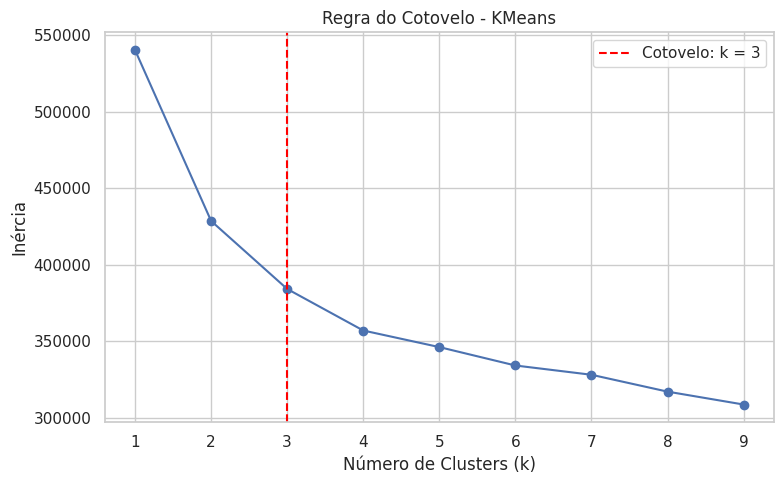

Melhor número de clusters (cotovelo): 3


In [62]:
from sklearn.cluster import KMeans
from kneed import KneeLocator

# Calcular a inércia para diferentes valores de k
inertia = []
k_range = range(1, 10)

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

# Identificar o ponto de "cotovelo"
kl = KneeLocator(k_range, inertia, curve="convex", direction="decreasing")

# Replotar com o cotovelo marcado
plt.figure(figsize=(8, 5))
plt.plot(k_range, inertia, marker='o')
plt.axvline(x=kl.elbow, color='red', linestyle='--', label=f'Cotovelo: k = {kl.elbow}')
plt.title('Regra do Cotovelo - KMeans')
plt.xlabel('Número de Clusters (k)')
plt.ylabel('Inércia')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Exibir o melhor k
print(f"Melhor número de clusters (cotovelo): {kl.elbow}")

## Part 17 - Modelo K-Means

In [63]:
# Aplicar K-Means
kmeans = KMeans(n_clusters=3, random_state=42)

# Previsão modelo kmeans
clusters = kmeans.fit_predict(X_scaled)

# Adicionar os clusters ao dataset
data_train_sem_outliers['Cluster'] = clusters

# Visualizando modelo
kmeans

KMeans(n_clusters=3, random_state=42)

## Part 18 - Modelo PCA

In [64]:
from sklearn.decomposition import PCA
def plot_pca_variance(X, threshold=0.95):
    """
    Exibe gráfico da variância explicada pelo PCA e sugere o número ideal de componentes.

    Parâmetros:
    - X: Dados já escalados (ex: com StandardScaler)
    - threshold: Variância explicada acumulada desejada (default = 0.95)

    Retorna:
    - Número de componentes que explica ao menos 'threshold' da variância
    """
    pca = PCA().fit(X)
    explained_var = np.cumsum(pca.explained_variance_ratio_)

    # Encontrar o ponto de corte
    n_components = np.argmax(explained_var >= threshold) + 1

    # Plotando a curva de variância explicada
    plt.figure(figsize=(8, 5))
    plt.plot(range(1, len(explained_var) + 1), explained_var, marker='o')
    plt.axhline(y=threshold, color='red', linestyle='--', label=f'{int(threshold*100)}% da variância')
    plt.axvline(x=n_components, color='green', linestyle='--', label=f'n_components = {n_components}')
    plt.title('Variância Explicada Acumulada - PCA')
    plt.xlabel('Número de Componentes')
    plt.ylabel('Variância Acumulada')
    plt.grid(False)
    plt.legend()
    plt.show()

    print(f'Número ideal de componentes (≥ {int(threshold*100)}% da variância): {n_components}')
    return n_components

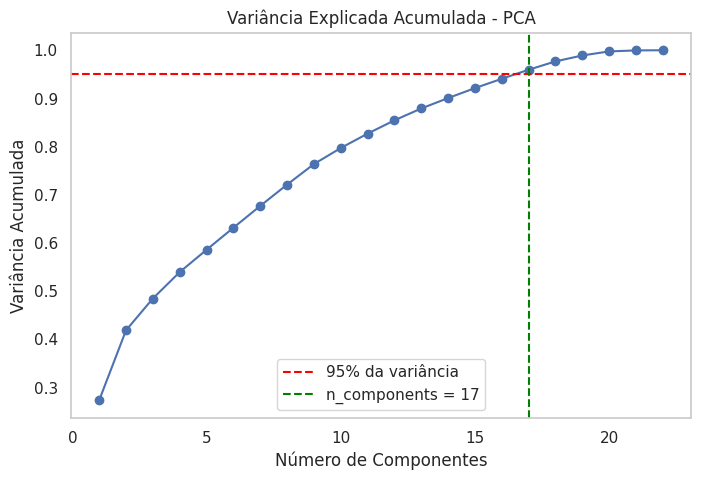

Número ideal de componentes (≥ 95% da variância): 17


In [65]:
# X_scaled = dados já normalizados com StandardScaler
n_ideal = plot_pca_variance(X_scaled, threshold=0.95)

In [66]:
from sklearn.decomposition import PCA

# Visualizar clusters com PCA
pca = PCA(n_components=17,       # Número de componentes principais
          svd_solver='auto',     # Algoritmo para decomposição SVD ('auto', 'full', 'arpack', 'randomized')
          whiten=False,          # Se True, remove a correlação e padroniza a variância dos componentes
          random_state=42        # Reprodutibilidade para métodos aleatórios (ex: 'randomized')
         )

# Treinamento modelo PCA
pca_result = pca.fit_transform(X_scaled)

# Visualizando modelo PCA
pca

PCA(n_components=17, random_state=42)

In [67]:
print(f"Formato dos dados reduzidos: {pca_result.shape}")

Formato dos dados reduzidos: (24556, 17)


In [68]:
print(f"Variância explicada acumulada: {pca.explained_variance_ratio_.cumsum()[-1]:.2f}")

Variância explicada acumulada: 0.96


## Part 19 - Visualização clusters

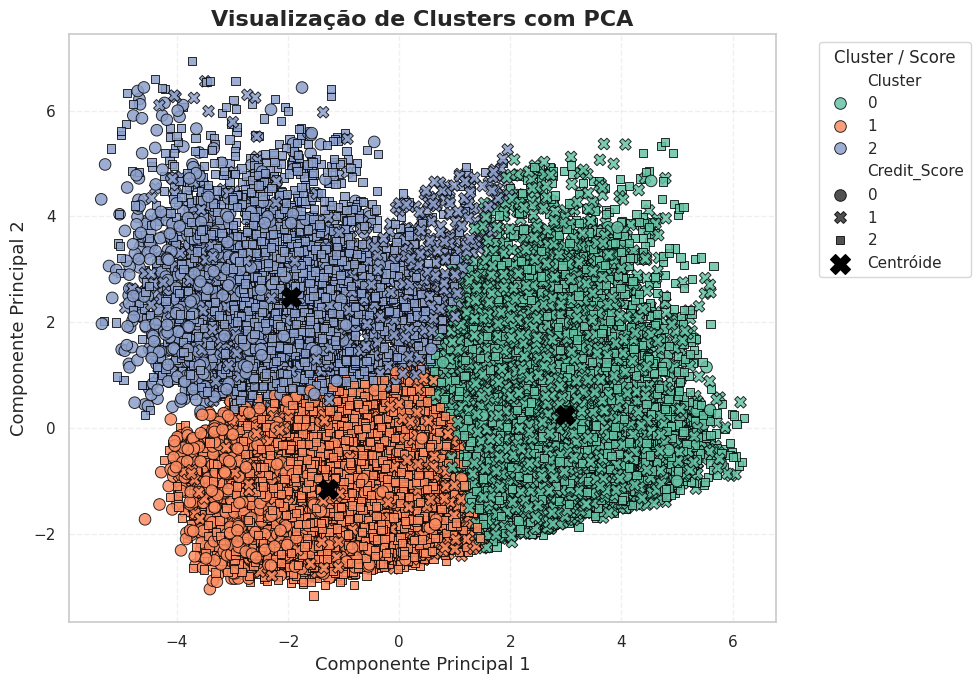

<Figure size 640x480 with 0 Axes>

In [69]:
# Calcular centróides com base no PCA
centroids = []
for cluster_id in sorted(data_train_sem_outliers['Cluster'].unique()):
    mask = data_train_sem_outliers['Cluster'] == cluster_id
    centroid = pca_result[mask].mean(axis=0)
    centroids.append(centroid)
centroids = np.array(centroids)

# Plotagem
plt.figure(figsize=(10, 7))
sns.scatterplot(x=pca_result[:, 0],
                y=pca_result[:, 1],
                hue=data_train_sem_outliers['Cluster'],
                style=data_train_sem_outliers['Credit_Score'],
                palette='Set2',
                s=70,
                alpha=0.85,
                edgecolor='black')

# Adiciona os centróides com marcador especial
plt.scatter(centroids[:, 0],
            centroids[:, 1],
            s=200,
            c='black',
            marker='X',
            label='Centróide')

# Títulos e rótulos
plt.title("Visualização de Clusters com PCA", fontsize=16, fontweight='bold')
plt.xlabel("Componente Principal 1", fontsize=13)
plt.ylabel("Componente Principal 2", fontsize=13)

# Legenda completa
plt.legend(title='Cluster / Score', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# (Opcional) Salvar a imagem
plt.savefig("clusters_pca_com_centroides.png", dpi=300)

In [70]:
# Importando biblioteca tSNE
from sklearn.manifold import TSNE

# Função para encontrar o valor de n_components para t-SNE
def testar_tsne_n_components(X_scaled, cluster_labels, n_components_list=[2, 3], perplexity=30, learning_rate=200):

    """
    Testa diferentes valores de n_components para t-SNE e retorna visualizações
    e métricas de separação.

    Parâmetros:
    - X_scaled: dados numéricos padronizados
    - cluster_labels: rótulos dos clusters (por exemplo, do KMeans)
    - n_components_list: lista com os valores de n_components para testar (ex: [2, 3])
    - perplexity: número de vizinhos considerados no t-SNE
    - learning_rate: taxa de aprendizado do t-SNE

    Retorna:
    - Dicionário com silhouette scores por dimensão
    """

    results = {}

    for n in n_components_list:
        print(f"\nExecutando t-SNE com n_components = {n}...")
        tsne = TSNE(n_components=n, perplexity=perplexity, learning_rate=learning_rate, n_iter=1000, random_state=42)
        tsne_result = tsne.fit_transform(X_scaled)

        if n == 2:
            plt.figure(figsize=(8, 6))
            sns.scatterplot(x=tsne_result[:, 0], y=tsne_result[:, 1], hue=cluster_labels, palette='Set2', s=70)
            plt.title(f't-SNE com 2 componentes (perplexidade={perplexity})')
            plt.grid(False)
            plt.tight_layout()
            plt.show()

        try:
            score = silhouette_score(tsne_result, cluster_labels)
            print(f"Silhouette Score (n_components={n}): {score:.4f}")
            results[n] = score
        except Exception as e:
            print(f"Não foi possível calcular o silhouette para n_components = {n}: {e}")

    return results


Executando t-SNE com n_components = 2...


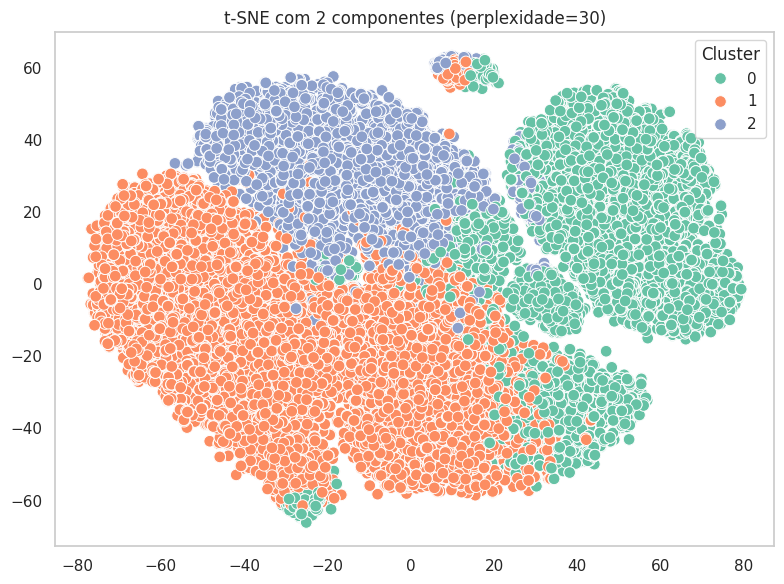

Não foi possível calcular o silhouette para n_components = 2: name 'silhouette_score' is not defined

Executando t-SNE com n_components = 3...
Não foi possível calcular o silhouette para n_components = 3: name 'silhouette_score' is not defined


In [71]:
%%time
# Supondo que você já tenha X_scaled e os clusters atribuídos
resultados_tsne = testar_tsne_n_components(X_scaled,
                                           data_train_sem_outliers['Cluster'],
                                           n_components_list=[2, 3])

In [72]:
%%time

## Modelo tsne
# Aplicar t-SNE nos dados escalados
tsne = TSNE(n_components=3,       # Reduz para 2 dimensões para visualização
            perplexity=30,        # Quantidade de vizinhos considerados (tipicamente entre 5 e 50)
            learning_rate=200,    # Taxa de aprendizado (pode testar 10, 100, 300, etc.)
            n_iter=1000,          # Número de iterações
            random_state=42,      # Reprodutibilidade
            verbose=1             # Mostra progresso
           )

# Treinamento
tsne_result = tsne.fit_transform(X_scaled)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 24556 samples in 0.005s...
[t-SNE] Computed neighbors for 24556 samples in 5.425s...
[t-SNE] Computed conditional probabilities for sample 1000 / 24556
[t-SNE] Computed conditional probabilities for sample 2000 / 24556
[t-SNE] Computed conditional probabilities for sample 3000 / 24556
[t-SNE] Computed conditional probabilities for sample 4000 / 24556
[t-SNE] Computed conditional probabilities for sample 5000 / 24556
[t-SNE] Computed conditional probabilities for sample 6000 / 24556
[t-SNE] Computed conditional probabilities for sample 7000 / 24556
[t-SNE] Computed conditional probabilities for sample 8000 / 24556
[t-SNE] Computed conditional probabilities for sample 9000 / 24556
[t-SNE] Computed conditional probabilities for sample 10000 / 24556
[t-SNE] Computed conditional probabilities for sample 11000 / 24556
[t-SNE] Computed conditional probabilities for sample 12000 / 24556
[t-SNE] Computed conditional probabilities for sam

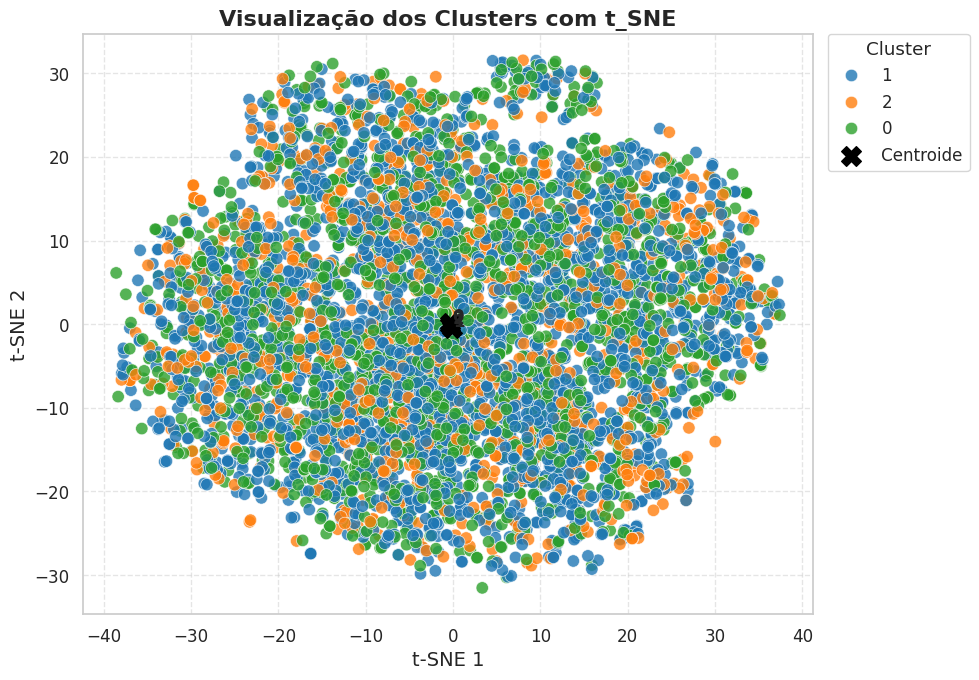

In [73]:
sns.set_style('whitegrid')
sns.set_context('notebook', font_scale=1.1)

# DataFrame apenas com tSNE1 e tSNE2
df_tsne = pd.DataFrame(tsne_result[:, :2], columns=['tSNE1', 'tSNE2'])
df_tsne['Cluster'] = data_train_sem_outliers['Cluster'].astype(str)

# Calcula centróides
centroids = df_tsne.groupby('Cluster').mean().reset_index()

#  Plot
plt.figure(figsize=(10, 7))
palette = sns.color_palette('tab10', n_colors=df_tsne['Cluster'].nunique())

sns.scatterplot(data=df_tsne,
                x='tSNE1', y='tSNE2',
                hue='Cluster',
                palette=palette,
                s=80,
                linewidth=0.5,
                edgecolor='w',
                alpha=0.8)

# Marca centróides
plt.scatter(centroids['tSNE1'],
            centroids['tSNE2'],
            marker='X',
            s=200,
            color='black',
            label='Centroide')

for _, row in centroids.iterrows():
    plt.text(row['tSNE1'] + 0.2, row['tSNE2'] + 0.2,
             row['Cluster'],
             fontsize=12,
             weight='bold')

plt.title("Visualização dos Clusters com t_SNE", fontsize=16, weight='bold')
plt.xlabel("t‑SNE 1", fontsize=14)
plt.ylabel("t‑SNE 2", fontsize=14)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, title='Cluster')
plt.tight_layout()
plt.show()

## Part 20 - Modelo 2 DBSCAN

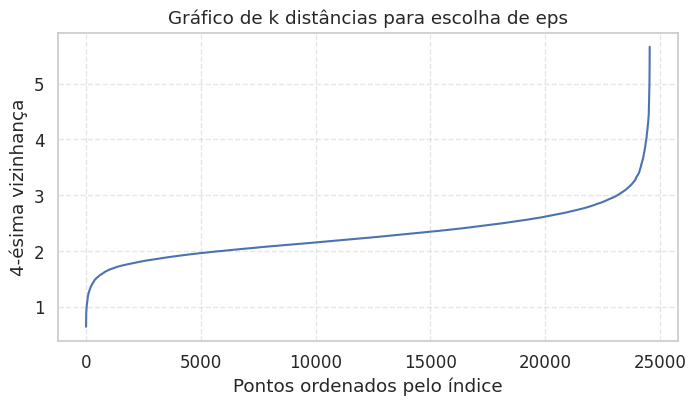

In [74]:
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

# 4) Gráfico de k-distâncias para definição de eps
k = 4  # normalmente min_samples
nbrs = NearestNeighbors(n_neighbors=k).fit(X_scaled)
distances, _ = nbrs.kneighbors(X_scaled)
distances = np.sort(distances[:, k-1])

plt.figure(figsize=(8,4))
plt.plot(distances)
plt.ylabel(f"{k}‑ésima vizinhança")
plt.xlabel("Pontos ordenados pelo índice")
plt.title("Gráfico de k distâncias para escolha de eps")
plt.grid(False, linestyle='--', alpha=0.5)
plt.show()

In [75]:
# 5) Aplicar DBSCAN (ajuste eps e min_samples conforme o gráfico acima)
dbscan = DBSCAN(eps=1.5, min_samples=5, metric='euclidean', n_jobs=-1)
clusters = dbscan.fit_predict(X_scaled)

dbscan

DBSCAN(eps=1.5, n_jobs=-1)

In [76]:
# 6) Analisar distribuição dos clusters
unique, counts = np.unique(clusters, return_counts=True)
cluster_counts = dict(zip(unique, counts))
print("Contagem por cluster:", cluster_counts)

# 7) Anexar label de cluster ao DataFrame original para inspeção
data_train_sem_outliers = data_train_sem_outliers.copy()
data_train_sem_outliers['Cluster_DBSCAN'] = clusters

Contagem por cluster: {np.int64(-1): np.int64(24367), np.int64(0): np.int64(5), np.int64(1): np.int64(5), np.int64(2): np.int64(5), np.int64(3): np.int64(6), np.int64(4): np.int64(5), np.int64(5): np.int64(5), np.int64(6): np.int64(5), np.int64(7): np.int64(6), np.int64(8): np.int64(5), np.int64(9): np.int64(5), np.int64(10): np.int64(5), np.int64(11): np.int64(5), np.int64(12): np.int64(5), np.int64(13): np.int64(5), np.int64(14): np.int64(5), np.int64(15): np.int64(5), np.int64(16): np.int64(5), np.int64(17): np.int64(5), np.int64(18): np.int64(5), np.int64(19): np.int64(5), np.int64(20): np.int64(5), np.int64(21): np.int64(6), np.int64(22): np.int64(5), np.int64(23): np.int64(5), np.int64(24): np.int64(5), np.int64(25): np.int64(6), np.int64(26): np.int64(7), np.int64(27): np.int64(7), np.int64(28): np.int64(5), np.int64(29): np.int64(5), np.int64(30): np.int64(6), np.int64(31): np.int64(5), np.int64(32): np.int64(5), np.int64(33): np.int64(5), np.int64(34): np.int64(5), np.int64(35

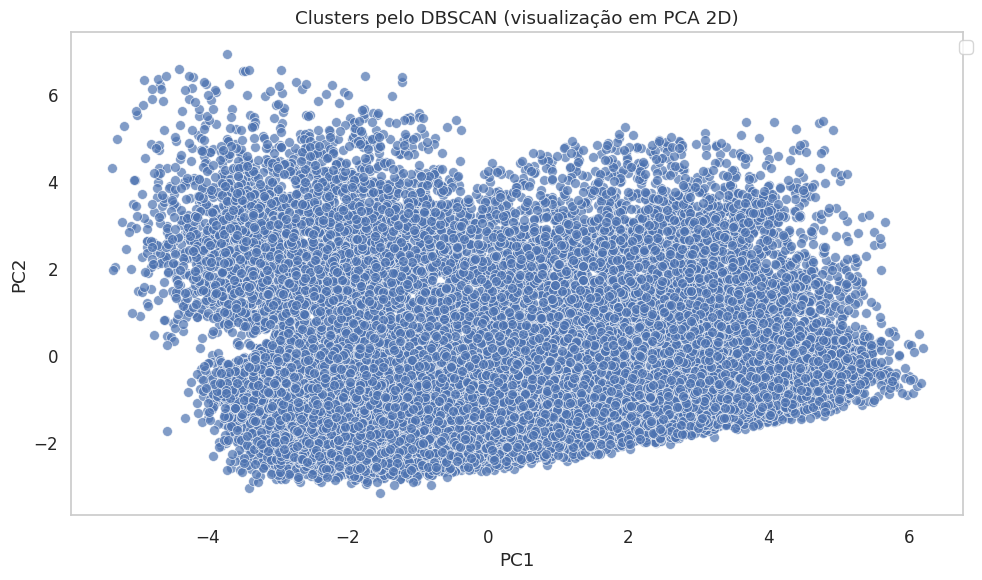

In [77]:
# 8) (Opcional) Visualizar clusters com PCA ou t-SNE
pca_2 = PCA(n_components=2).fit_transform(X_scaled)
df_vis = pd.DataFrame(pca_2, columns=['PC1','PC2'])
df_vis['Cluster'] = clusters.astype(str)

plt.figure(figsize=(10,6))
sns.scatterplot(data=df_vis, x='PC1', y='PC2',
                palette='tab10',
                s=50,
                alpha=0.7)

plt.title("Clusters pelo DBSCAN (visualização em PCA 2D)")
plt.legend(bbox_to_anchor=(1.02,1))
plt.tight_layout()
plt.grid(False)
plt.show()

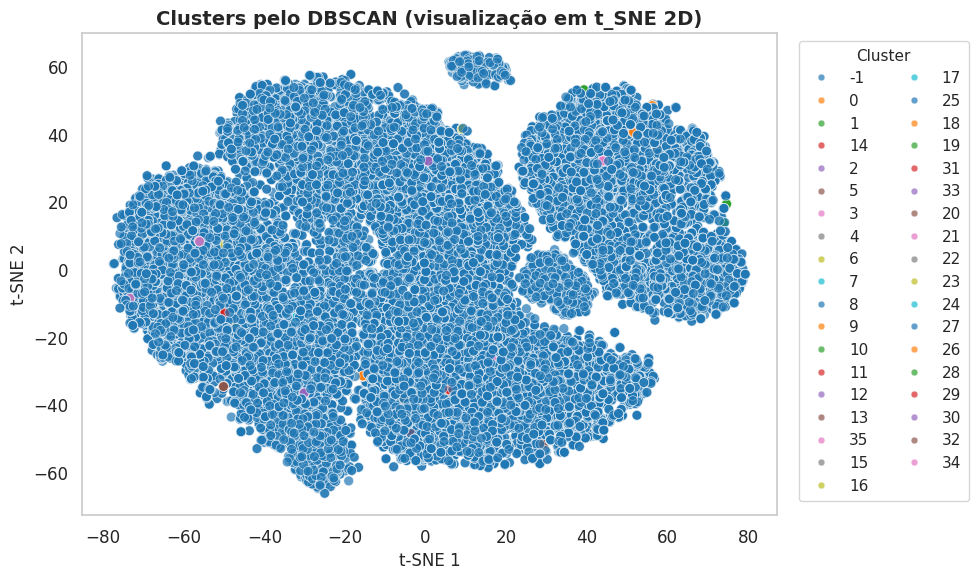

In [78]:
# 1) Executa o t‑SNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200,
            n_iter=1000, random_state=42, init='pca')
tsne_2d = tsne.fit_transform(X_scaled)

# 2) DataFrame para plot
df_tsne = pd.DataFrame(tsne_2d, columns=['tSNE1', 'tSNE2'])
df_tsne['Cluster'] = clusters.astype(str)

# 3) Plot
fig, ax = plt.subplots(figsize=(10, 6))
sns.scatterplot(
    data=df_tsne, x='tSNE1', y='tSNE2',
    hue='Cluster',
    palette='tab10',
    s=50, alpha=0.7,
    edgecolor='w', linewidth=0.5,
    ax=ax
)

ax.set_title("Clusters pelo DBSCAN (visualização em t_SNE 2D)", fontsize=14, weight='bold')
ax.set_xlabel("t‑SNE 1", fontsize=12)
ax.set_ylabel("t‑SNE 2", fontsize=12)
ax.grid(False)

# 4) Ajuste da legenda
legend = ax.legend(
    title='Cluster',
    loc='upper left',                # posição dentro do axes antes de “empurrar” para fora
    bbox_to_anchor=(1.02, 1),        # desloca para fora (x=1.02·largura do axes, y=1·altura)
    ncol=2,                          # duas colunas na legenda
    fontsize='small',                # tamanho da fonte
    title_fontsize='small',          # tamanho do título
    markerscale=0.7,                 # escala dos símbolos na legenda
    frameon=True,                    # desenha caixa ao redor
    borderpad=0.5                    # distância do conteúdo ao frame
)

plt.tight_layout()  # ajusta margens para caber tudo
plt.show()

In [79]:
from sklearn.metrics import (silhouette_score, calinski_harabasz_score, davies_bouldin_score)

# clusters: array com labels do DBSCAN (inclui -1 para ruído)
# X_scaled: dados usados no ajuste (numéricos e escalonados)

# Filtra apenas pontos “válidos” (descarta ruído) para o Silhouette
mask = clusters != -1
X_valid = X_scaled[mask]
labels_valid = clusters[mask]

# Número de clusters encontrados (excluindo ruído)
n_clusters = len(set(labels_valid))
print(f"Número de clusters (excluindo ruído): {n_clusters}")
print(f"Número de pontos classificados como ruído: {(clusters == -1).sum()}\n")

# 1) Silhouette Score
sil_score = silhouette_score(X_valid, labels_valid)
print(f"Silhouette Score (sem ruído): {sil_score:.4f}")

# 2) Calinski–Harabasz Index
ch_score = calinski_harabasz_score(X_scaled, clusters)
print(f"Calinski–Harabasz Index:    {ch_score:.4f}")

# 3) Davies–Bouldin Index
db_score = davies_bouldin_score(X_scaled, clusters)
print(f"Davies–Bouldin Index:       {db_score:.4f}")

Número de clusters (excluindo ruído): 36
Número de pontos classificados como ruído: 24367

Silhouette Score (sem ruído): 0.5753
Calinski–Harabasz Index:    4.3028
Davies–Bouldin Index:       1.3774


## Part 21 - Modelo 3 Agglomerative Clustering

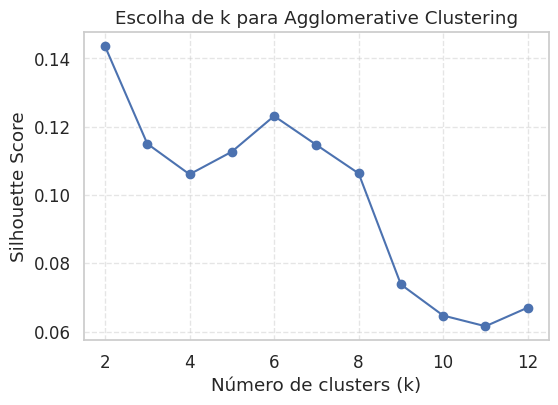

Melhor n_clusters: 2
Silhouette por k: {2: np.float64(0.14357066575584373), 3: np.float64(0.11501991808490952), 4: np.float64(0.10605910262880158), 5: np.float64(0.11268531239562016), 6: np.float64(0.12312756044010015), 7: np.float64(0.1146856608120013), 8: np.float64(0.10633098849312425), 9: np.float64(0.07379612724565221), 10: np.float64(0.0646973105475549), 11: np.float64(0.061564450643256406), 12: np.float64(0.067024440692892)}


In [80]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

#
def encontrar_melhor_n_clusters(X, k_min=2, k_max=10, linkage='ward'):

    """
    Encontra o melhor número de clusters para AgglomerativeClustering
    baseado no Silhouette Score.

    Parâmetros
    ----------
    X : array-like, shape (n_samples, n_features)
        Dados escalonados para clustering.
    k_min : int
        Menor número de clusters a testar (>=2).
    k_max : int
        Maior número de clusters a testar.
    linkage : {'ward', 'complete', 'average', 'single'}
        Tipo de linkage a usar.

    Retorna
    -------
    best_k : int
        Valor de n_clusters com maior silhouette score.
    scores : dict
        Dicionário {k: silhouette_score}.
    """

    scores = {}
    for k in range(k_min, k_max+1):

        # Ward exige métrica euclidiana implícita
        if linkage == 'ward':
            agg = AgglomerativeClustering(n_clusters=k, linkage='ward')
        else:
            agg = AgglomerativeClustering(n_clusters=k,
                                          linkage=linkage,
                                          metric='euclidean')
        labels = agg.fit_predict(X)

        # silhouette_score requer pelo menos 2 clusters não vazios
        score = silhouette_score(X, labels)
        scores[k] = score # opcional: print(f"k={k}, silhouette={score:.4f}")

    # identifica k com maior score
    best_k = max(scores, key=scores.get)
    return best_k, scores

# Exemplo de uso:
best_k, scores = encontrar_melhor_n_clusters(X_scaled, k_min=2, k_max=12)

ks = list(scores.keys())
vals = list(scores.values())

plt.figure(figsize=(6,4))
plt.plot(ks, vals, marker='o')
plt.xlabel("Número de clusters (k)")
plt.ylabel("Silhouette Score")
plt.title("Escolha de k para Agglomerative Clustering")
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

print(f"Melhor n_clusters: {best_k}")
print("Silhouette por k:", scores)

In [81]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import (silhouette_score, calinski_harabasz_score, davies_bouldin_score)

# 1) Definir o número de clusters
# n_clusters e comparar usando silhouette_score
n_clusters = best_k

## modelo com linkage='complete' e distância Euclidiana
agg_complete = AgglomerativeClustering(n_clusters=2,
                                       metric='euclidean',   # antes era affinity='euclidean'
                                       linkage='complete')

# Previsão cluster
labels_complete = agg_complete.fit_predict(X_scaled)

# Previsão
labels_agg = agg_complete.fit_predict(X_scaled)

# Visualizando modelo
agg_complete

AgglomerativeClustering(linkage='complete')

In [82]:
from sklearn.metrics import silhouette_score

sil = silhouette_score(X_scaled, labels_agg)
print(f"Silhouette (Ward): {sil:.4f}")

Silhouette (Ward): 0.3814


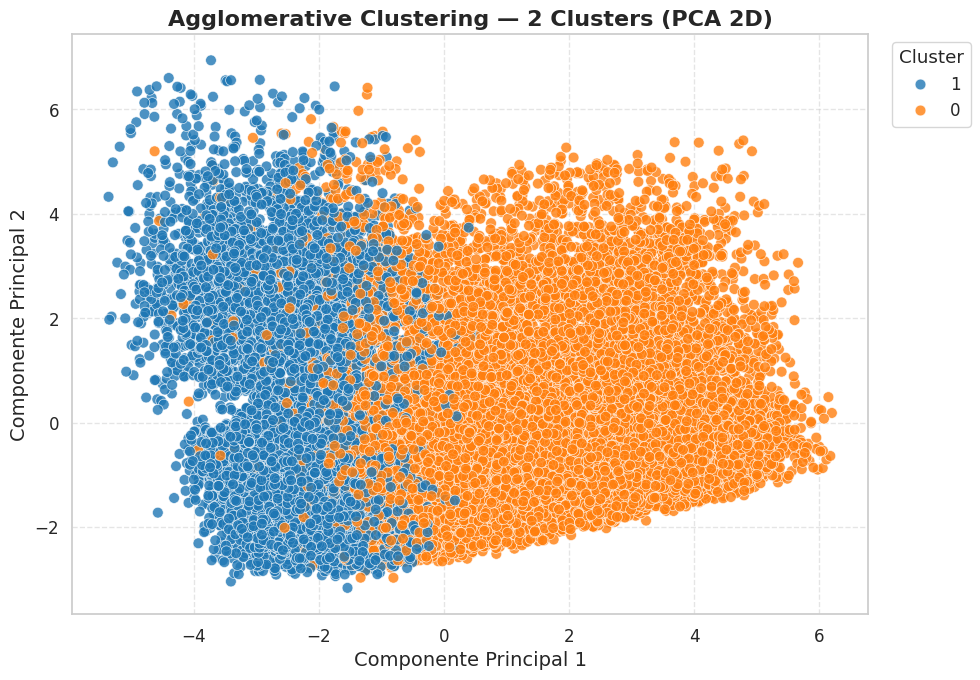

In [83]:
# 1) Ajusta o Agglomerative Clustering com o melhor número de clusters
best_k = best_k  # valor obtido pela função encontrar_melhor_n_clusters
agg = AgglomerativeClustering(n_clusters=best_k, linkage='ward')
labels_agg = agg.fit_predict(X_scaled)

# 2) Reduce para 2 dimensões com PCA para visualização
pca = PCA(n_components=2)
coords_2d = pca.fit_transform(X_scaled)

# 3) Monta um DataFrame para plot
df_plot = pd.DataFrame(coords_2d, columns=['PC1', 'PC2'])
df_plot['Cluster'] = labels_agg.astype(str)

# 4) Plota os clusters
plt.figure(figsize=(10, 7))
palette = sns.color_palette('tab10', n_colors=best_k)

sns.scatterplot(
    data=df_plot,
    x='PC1', y='PC2',
    hue='Cluster',
    palette=palette,
    s=60,
    alpha=0.8,
    edgecolor='w',
    linewidth=0.5
)

plt.title(f"Agglomerative Clustering — {best_k} Clusters (PCA 2D)", fontsize=16, weight='bold')
plt.xlabel("Componente Principal 1", fontsize=14)
plt.ylabel("Componente Principal 2", fontsize=14)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', title='Cluster')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

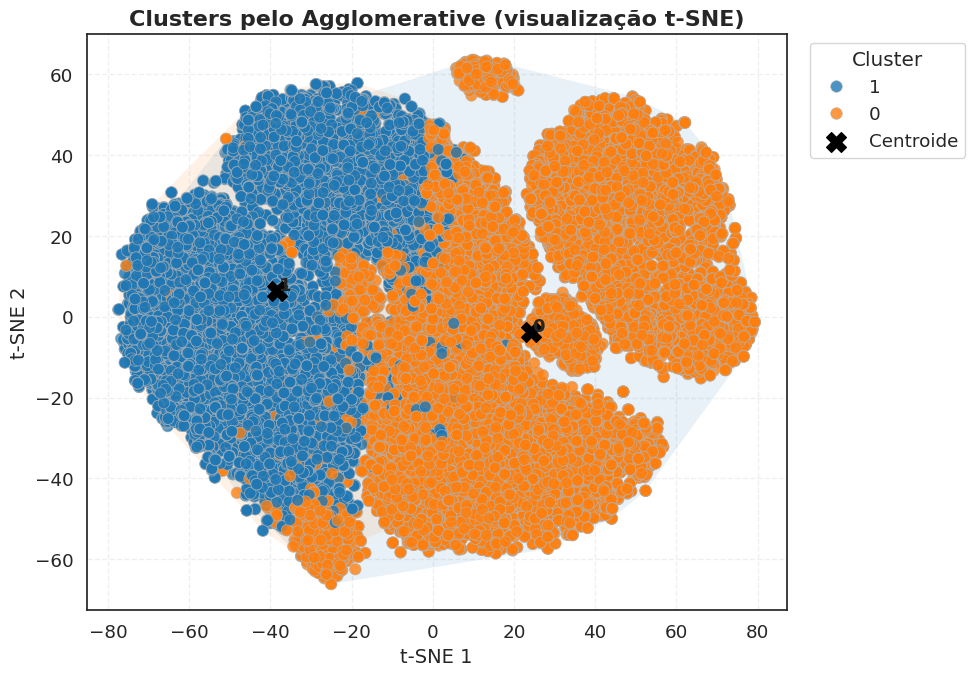

In [84]:
from scipy.spatial import ConvexHull

# 1) Execução do t-SNE como antes
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200,
            n_iter=1000, random_state=42, init='pca')
tsne_result = tsne.fit_transform(X_scaled)

df_tsne = pd.DataFrame(tsne_result, columns=['tSNE1','tSNE2'])
df_tsne['Cluster'] = labels_agg.astype(str)
centroids = df_tsne.groupby('Cluster')[['tSNE1','tSNE2']].mean().reset_index()

# 2) Estilo e paleta
sns.set_style('white')
sns.set_context('notebook', font_scale=1.2)
palette = sns.color_palette('tab10', n_colors=df_tsne['Cluster'].nunique())

# 3) Plot principal
plt.figure(figsize=(10,7))
for cid, color in zip(centroids['Cluster'], palette):
    pts = df_tsne[df_tsne.Cluster==cid][['tSNE1','tSNE2']].values
    # convex hull
    if len(pts) >= 3:
        hull = ConvexHull(pts)
        hull_pts = pts[hull.vertices]
        plt.fill(hull_pts[:,0], hull_pts[:,1],
                 alpha=0.1, facecolor=color, edgecolor=None)

sns.scatterplot(
    data=df_tsne, x='tSNE1', y='tSNE2',
    hue='Cluster', palette=palette,
    s=70, alpha=0.8, edgecolor='.7', linewidth=0.5
)

# 4) Centróides
plt.scatter(
    centroids['tSNE1'], centroids['tSNE2'],
    marker='X', s=200, color='black', label='Centroide'
)
for _, row in centroids.iterrows():
    plt.text(row['tSNE1']+0.3, row['tSNE2']+0.3,
             row['Cluster'], fontsize=13, weight='bold')

# 5) Ajustes finais
plt.title("Clusters pelo Agglomerative (visualização t‑SNE)", fontsize=16, weight='bold')
plt.xlabel("t‑SNE 1", fontsize=14)
plt.ylabel("t‑SNE 2", fontsize=14)
plt.legend(bbox_to_anchor=(1.02,1), loc='upper left', title='Cluster')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()


# Part 22 - Métricas e avalicações clusters

**Definição métricas**

| Métrica                 | Ideal         | Interpretação rápida                            |
|-------------------------|---------------|-------------------------------------------------|
| **Silhouette Score**    | Próximo de 1  | Bom agrupamento (forma e distância)             |
| **Davies-Bouldin**      | Próximo de 0  | Menos sobreposição entre grupos                 |
| **Calinski-Harabasz**   | Alto          | Alta separação inter-cluster, boa coesão intra  |
| **ARI** (se rótulo)     | Próximo de 1  | Clusters se alinham com rótulos verdadeiros     |

In [85]:
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import (silhouette_score, davies_bouldin_score, calinski_harabasz_score, adjusted_rand_score)

# 1) Ajusta cada modelo e captura os rótulos
kmeans = KMeans(n_clusters=4, random_state=42).fit(X_scaled)
labels_km = kmeans.labels_

dbscan = DBSCAN(eps=1.5, min_samples=5, metric='euclidean', n_jobs=-1).fit(X_scaled)
labels_db = dbscan.labels_

agg = AgglomerativeClustering(n_clusters=4, linkage='ward').fit(X_scaled)
labels_ag = agg.labels_

# 2) Dicionário de nomes → labels
model_labels = {'KMeans': labels_km,
                'DBSCAN': labels_db,
                'Agglomerative': labels_ag}

# 3) Calcula métricas para cada um
results = []
for name, labels in model_labels.items():

    # Silhouette (quanto maior, melhor)
    sil = silhouette_score(X_scaled, labels)

    # Davies–Bouldin (quanto menor, melhor)
    db  = davies_bouldin_score(X_scaled, labels)

    # Calinski–Harabasz (quanto maior, melhor)
    ch  = calinski_harabasz_score(X_scaled, labels)

    # Adjusted Rand Index comparando com o Credit_Score original
    ari = adjusted_rand_score(data_train_sem_outliers['Credit_Score'], labels)

    # Resultados modelo
    results.append({'Modelo': name,
                    'Silhouette': sil,
                    'Davies-Bouldin': db,
                    'Calinski-Harabasz': ch,
                    'ARI': ari})

# 4) Cria DataFrame
df_metricas = pd.DataFrame(results)

# 5) Exibe
df_metricas

,Modelo,Silhouette,Davies-Bouldin,Calinski-Harabasz,ARI
0,KMeans,0.131357,2.092898,4203.814334,0.077484
1,DBSCAN,-0.395005,1.377379,4.302848,0.000453
2,Agglomerative,0.106059,2.194020,3457.701185,0.084150


**Análise**

Em suma, entre os três métodos testados, o KMeans demonstrou o melhor equilíbrio entre coesão interna e separação de clusters, exibindo a maior pontuação de Silhouette e o índice Calinski‑Harabasz mais elevado, além de um Davies‑Bouldin razoável. Embora o agrupamento hierárquico aglomerativo tenha apresentado um ARI ligeiramente superior, sua coesão e separação ficaram aquém do KMeans. Já o DBSCAN, com os parâmetros atuais, não formou grupos consistentes, refletido pela Silhouette negativa, baixo CH e ARI quase nulo, o que indica que ele não é adequado para este conjunto sem ajuste ou filtragem prévia.  

Portanto, recomendamos adotar o KMeans como método principal, ajustando o número de clusters e testando diferentes inicializações para otimizar ainda mais os resultados. Paralelamente, vale explorar refinamentos no Agglomerative (por exemplo, alterando o linkage) e considerar uma etapa prévia de redução de dimensionalidade ou remoção de outliers para potencialmente melhorar o índice de concordância (ARI) com as classes de referência. Dos três modelos avaliados, o **KMeans** apresenta o melhor compromisso geral de qualidade de cluster:

| Modelo          | Silhouette ↑ | Davies‑Bouldin ↓ | Calinski‑Harabasz ↑ | ARI ↑    |
|-----------------|--------------|------------------|---------------------|----------|
| **KMeans**      | **0.1314**   | **2.0929**           | **4203.81**         | **0.07748**  |
| **Agglomerative**   | **0.1061**       | **2.1940**           | **3457.70**            | **0.08415** |
| DBSCAN          | –0.3950      | 1.3774      | 4.30                | 0.00045  |

1. **Silhouette** (quanto mais próximo de 1, melhor):  
   - KMeans tem o maior valor (0.13), indicando clusters mais coesos e bem separados.  
   - Agglomerative vem em segundo (0.106).  
   - DBSCAN teve valor negativo, ou seja, os pontos ficaram, em média, mais próximos de clusters vizinhos do que do seu próprio, sinalizando má formação de agrupamentos para esses parâmetros.

2. **Davies‑Bouldin** (quanto mais próximo de 0, melhor):  
   - DBSCAN obteve o menor índice (1.38), mas isso costuma ocorrer quando ele forma poucos clusters de tamanho muito desigual ou muitos “ruídos”.  
   - KMeans (2.09) e Agglomerative (2.19) ficam em seguida, com valores razoáveis.

3. **Calinski‑Harabasz** (quanto maior, mais separados e densos são os clusters):  
   - KMeans dispara na frente (≈4204), mostrando uma boa separação e densidade interna.  
   - Agglomerative aparece em seguida (≈3458).  
   - DBSCAN fica próximo de zero, refletindo que seus agrupamentos não são estáveis para esse conjunto de dados.

4. **ARI (Adjusted Rand Index)** (quanto mais próximo de 1, maior concordância com rótulos verdadeiros):  
   - Todos os índices estão baixos, indicando que nenhum método reproduz muito bem as classes de referência.  
   - Ainda assim, Agglomerative leva uma ligeira vantagem (0.084), seguido de perto pelo KMeans (0.077). DBSCAN está praticamente nulo.

**Conclusão:**  
- **KMeans** é a melhor escolha geral, com o maior *Silhouette*, o maior *Calinski‑Harabasz* e desempenho competitivo em *ARI*.  
- **Agglomerative** também é razoável, especialmente se você valoriza um *ARI* marginalmente maior — mas perde em coesão e separação de clusters.  
- **DBSCAN**, com os parâmetros atuais, não funcionou bem: silhueta negativa, poucos clusters significativos e baixa concordância com rótulos.

> **Próximos passos**:  
> - Ajustar hiperparâmetros de KMeans (ex.: número de clusters) ou Agglomerative (ex.: linkage) via *grid search*.  
> - Tentar outras métricas de distância ou reduzir dimensionalidade antes de agrupar para melhorar separabilidade e ARI.  
> - Se houver muito barulho ou outliers, considerar uma etapa prévia de filtragem ou PCA.

# Part 23 - Sistema Especialista com Regras

In [86]:
def classificar_risco(row):
    # Regra para Risco Alto
    if row['Credit_Utilization_Ratio'] > 0.8 and row['Num_Credit_Card'] > 6:
        return 'Risco Alto'

    # Regra para Risco Médio
    elif row['Credit_History_Age'] < 24 or row['Num_Bank_Accounts'] < 2:
        return 'Risco Médio'

    # Regra para Pagamento mínimo não realizado + muitos empréstimos
    elif row['Payment_of_Min_Amount'] == 0 and row['Num_of_Loan'] >= 5:
        return 'Risco Alto'

    # Regra para Risco Baixo
    elif row['Credit_Utilization_Ratio'] < 0.4 and row['Outstanding_Debt'] < 1000:
        return 'Risco Baixo'

    # Caso padrão
    else:
        return 'Risco Médio'

In [87]:
# Aplicar a função linha a linha
data_train_sem_outliers['Risco_Manual'] = data_train_sem_outliers.apply(classificar_risco, axis=1)

# Ver distribuição dos perfis
print(data_train_sem_outliers['Risco_Manual'].value_counts())

Risco_Manual
Risco Médio    16179
Risco Alto      8377
Name: count, dtype: int64


In [88]:
# Exemplo de mapeamento manual (ajustar conforme necessário)
risco_map = {'Risco Baixo': '0',
             'Risco Médio': '1',
             'Risco Alto': '2'}

In [89]:
data_train_sem_outliers['Risco_Manual_Num'] = data_train_sem_outliers['Risco_Manual'].map(risco_map)
print(classification_report(data_train_sem_outliers['Credit_Score'].astype(str), data_train_sem_outliers['Risco_Manual_Num']))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00      3560
           1       0.23      0.48      0.31      7819
           2       0.46      0.29      0.36     13177

    accuracy                           0.31     24556
   macro avg       0.23      0.26      0.22     24556
weighted avg       0.32      0.31      0.29     24556



# Part 24 - Previsão/Deploy

In [90]:
import re
import pickle

# 1. Carregar o modelo Random Forest
with open(r'/content/models/RandomForestClassifier.pkl', 'rb') as f:
    modelo = pickle.load(f)

# dados test
data_test.head(n=5)

,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance
0,23,12,19114.12,1824.843333,3,4,3,4,127,3,7.0,11.27,2022.0,1,809.98,35.030402,273.0,1,49.574949,236.642682,6,186.266702
1,24,12,19114.12,1824.843333,3,4,3,4,127,3,9.0,13.27,4.0,1,809.98,33.053114,274.0,1,49.574949,21.465380,2,361.444004
3,24,12,19114.12,3086.305000,3,4,3,4,127,4,5.0,11.27,4.0,1,809.98,32.430559,276.0,1,49.574949,39.082511,2,343.826873
5,28,13,34847.84,3037.986667,2,4,6,1,674,3,3.0,5.42,5.0,1,605.03,30.116600,328.0,1,18.816215,251.627369,4,303.355083
8,35,4,143162.64,3086.305000,1,5,8,3,62,8,1942.0,7.10,3.0,1,1303.01,35.229707,221.0,1,246.992319,397.503654,5,854.226027


In [91]:
# 2) Extrair a lista de features que o modelo espera
#    (esse atributo existe em modelos do scikit-learn >=0.24)
expected_features = list(modelo.feature_names_in_)

# 3) Checar se há colunas faltando ou a mais
cols_test = set(data_test.columns)
faltantes = set(expected_features) - cols_test
extras     = cols_test - set(expected_features)

print("Colunas faltando no data_test:", faltantes)
print("Colunas extras no data_test:", extras)

# 1) Monte X_test com *somente* as colunas esperadas (ignora automaticamente as extras)
X_test = data_test[list(expected_features)]

non_numeric = X_test.select_dtypes(include=['object','category']).columns
print("Colunas não-numéricas em X_test:", list(non_numeric))

# Tratamento dados test
for col in non_numeric:
    print(col, "exemplos:", X_test[col].unique()[:10])
for col in non_numeric:
    # extrai apenas dígitos e ponto
    X_test[col] = (
        X_test[col]
        .astype(str)
        .str.replace(r'[^0-9\.]', '', regex=True)
        .replace('', '0')              # strings vazias viram zero
        .astype(float)
    )

Colunas faltando no data_test: set()
Colunas extras no data_test: set()
Colunas não-numéricas em X_test: ['Num_of_Loan']
Num_of_Loan exemplos: ['4' '1' '3' '1381' '0' '2' '7' '5' '6' '5_']


In [92]:
def preprocess_client(df: pd.DataFrame) -> pd.DataFrame:
    """
    Garante que o DataFrame do cliente:
    - Tenha todas as expected_features (preenche faltantes com zero)
    - Esteja na mesma ordem de colunas do treinamento
    - Converta strings numéricas (ex: '24_') para float
    """
    # 1) Adiciona colunas faltantes
    faltantes = set(expected_features) - set(df.columns)
    for col in faltantes:
        df[col] = 0

    # 2) Seleciona e reordena
    X = df[expected_features].copy()

    # 3) Limpa strings em colunas não-numéricas, se houver
    non_num = X.select_dtypes(include=['object','category']).columns
    for col in non_num:
        X[col] = (
            X[col]
            .astype(str)
            .str.replace(r'[^0-9\.]', '', regex=True)
            .replace('', '0')
            .astype(float)
        )

    return X


def predict_client(client_data: dict) -> dict:
    """
    Recebe um dict com os atributos do cliente,
    retorna label previsto e probabilidade.
    """
    # Converte dict para DataFrame de 1 linha
    df_cli = pd.DataFrame([client_data])

    # Pré-processa
    X_cli = preprocess_client(df_cli)

    # Previsão
    label = modelo.predict(X_cli)[0]
    prob   = modelo.predict_proba(X_cli)[0, 1]

    return {'predicted_label': label, 'prob_positive': prob}

In [93]:
# Exemplo mínimo de client_data
cliente = {'Age': 38,
           'Occupation': 'Engineer',                # se você usou encoding para essa feature,
           'Annual_Income': 72000,
           'Monthly_Inhand_Salary': 5000,
           'Num_Bank_Accounts': 2,
           'Num_Credit_Card': 1,
           'Interest_Rate': 10,
           'Num_of_Loan': 0,
           'Type_of_Loan': 'Personal',              # idem ao comentário sobre Occupation
           'Delay_from_due_date': 0,
           'Num_of_Delayed_Payment': 0,
           'Changed_Credit_Limit': 1500,
           'Num_Credit_Inquiries': 1,
           'Credit_Mix': 'Good',                    # idem: ou codificado, ou deixe a string se seu preprocessamento tratar
           'Outstanding_Debt': 8000,
           'Credit_Utilization_Ratio': 0.15,
           'Credit_History_Age': '2 Years and 8 Months',  # se você converteu no treino para um número (ex: meses), passe o número aqui
           'Payment_of_Min_Amount': 'Yes',          # idem
           'Total_EMI_per_month': 350,
           'Amount_invested_monthly': 300,
           'Payment_Behaviour': 'Low_spent_in_Electronics',
           'Monthly_Balance': 1200}

# Gera previsão
res = predict_client(cliente)
print(f"Label previsto: {res['predicted_label']}, Probabilidade positiva emprestimo: {res['prob_positive']:.2%}")

Label previsto: 2, Probabilidade positiva emprestimo: 24.00%


# Part 25 - Conclusão

Após uma análise completa dos dados de credit score, incluindo limpeza, exploração e testes com diferentes modelos de machine learning, chegamos a algumas conclusões importantes. O objetivo era encontrar o modelo que melhor preveja o credit score de um cliente, levando em conta não só a acurácia geral, mas também a capacidade de evitar erros específicos.

Considerando os modelos testados como supervisionados, (Naive Bayes, Decision Tree, Random Forest, etc.), o Random Forest se destacou como o mais eficiente e confiável. Ele apresentou a melhor performance em todas as métricas que consideramos importantes: acurácia geral, precisão (evitando classificar erroneamente alguém com bom score), recall (identificando a maioria dos clientes com bom score) e F1-score (equilibrando precisão e recall).

O XGBoost também se mostrou um modelo poderoso, com resultados muito próximos ao Random Forest. Ele é uma ótima alternativa, principalmente se tivermos um volume enorme de dados para analisar. Outros modelos como LightGBM e Gradient Boosting tiveram performance satisfatória, mas não superaram os dois primeiros.

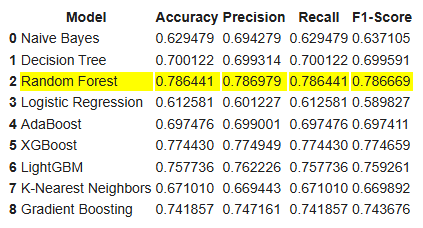

**Modelos Não-Supervisionados:**

Para a análise exploratória e identificação de grupos de clientes com características semelhantes, avaliamos três modelos não-supervisionados: KMeans, DBSCAN e Agglomerative Clustering. Utilizamos métricas como Silhouette Score, Davies-Bouldin, Calinski-Harabasz e ARI para comparar a qualidade dos clusters gerados por cada modelo.

O KMeans demonstrou o melhor equilíbrio entre coesão interna e separação de clusters, com as maiores pontuações de Silhouette e Calinski-Harabasz, além de um Davies-Bouldin razoável. Embora o Agglomerative Clustering tenha apresentado um ARI ligeiramente superior, sua coesão e separação ficaram aquém do KMeans. O DBSCAN, com os parâmetros utilizados, não formou grupos consistentes, indicando que pode não ser adequado para este conjunto de dados sem ajustes ou pré-processamento adicional.

Recomendamos adotar o KMeans como método principal para clusterização, com a possibilidade de otimizar o número de clusters e testar diferentes inicializações para aprimorar os resultados. Explorar refinamentos no Agglomerative Clustering e considerar técnicas de redução de dimensionalidade ou remoção de outliers também pode ser interessante para melhorar a qualidade dos clusters.



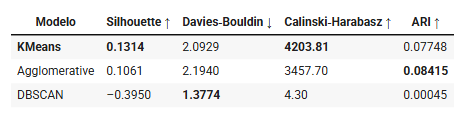


**Considerações:**  
- **KMeans** é a melhor escolha geral, com o maior *Silhouette*, o maior *Calinski‑Harabasz* e desempenho competitivo em *ARI*.  
- **Agglomerative** também é razoável, especialmente se você valoriza um *ARI* marginalmente maior — mas perde em coesão e separação de clusters.  
- **DBSCAN**, com os parâmetros atuais, não funcionou bem: silhueta negativa, poucos clusters significativos e baixa concordância com rótulos.

***Considerações Finais:***

Este projeto demonstrou a viabilidade da aplicação de técnicas de machine learning, tanto supervisionadas quanto não-supervisionadas, para a previsão e análise de credit score da Quantum Finance. As conclusões e recomendações aqui descritas podem servir como base para a construção de sistemas mais robustos e eficazes na avaliação de risco de crédito e na segmentação de clientes.

Entre os campeões de cada categoria, Random Forest (supervisionado) e KMeans (não-supervisionado), a escolha do "melhor" depende do objetivo final da análise.

**Random Forest é ideal para previsão do credit score. Ele se destaca por:**

Alta acurácia, precisão, recall e F1-score, indicando um bom equilíbrio entre identificar corretamente os bons scores e minimizar erros.
Robustez e capacidade de generalização, tornando-o confiável para prever o credit score em novos dados.
Ser um modelo "caixa preta", ou seja, sua lógica interna pode ser difícil de interpretar, mas ele entrega resultados excelentes para a tarefa de previsão.
KMeans é ideal para análise exploratória e segmentação de clientes. Ele se destaca por:

Encontrar grupos de clientes com características semelhantes, revelando padrões e insights nos dados.
Ser um modelo relativamente simples e fácil de interpretar, permitindo entender os critérios de formação dos clusters.
Não precisar de rótulos prévios (aprendizado não-supervisionado), sendo útil para explorar dados sem conhecimento prévio das classes.
Em resumo:

Logo, como o objetivo é prever o credit score com alta precisão, ***Random Forest é a melhor escolha.***
Mas como incremento para a Quantum finance, se o objetivo é entender os diferentes perfis de clientes e segmentá-los em grupos, KMeans é mais indicado.